In [1]:
# https://www.kaggle.com/competitions/hackathon-online-data-science-mini-epidemiology/submissions

In [2]:
!pip install -q kaggle
import json

data = {"username":"tunkedsaro","key":"ff3d00dc680ff94caf6f8d4d9bcd3168"}
json_data = json.dumps(data)

# Write the JSON string to a file
file_path = "/content/kaggle.json"
with open(file_path, 'w') as json_file:
    json_file.write(json_data)

!mkdir ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/ #copy api key ---- depend on your directory -- my directory is .../colab/..
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list
!kaggle competitions download -c hackathon-online-data-science-mini-epidemiology
!unzip -q /content/hackathon-online-data-science-mini-epidemiology.zip

!pip -q install autogluon.tabular

from autogluon.tabular import TabularDataset, TabularPredictor
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

ref                                                    title                                        size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------  ------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
waqi786/cats-dataset                                   🐾 Cats Dataset                                6KB  2024-07-31 06:12:49           1200         24  1.0              
patricklford/global-ev-sales-2010-2024                 Global EV Sales: 2010-2024                   83KB  2024-07-19 13:40:22           2040         29  1.0              
rabieelkharoua/students-performance-dataset            📚 Students Performance Dataset 📚             66KB  2024-06-12 23:09:20          26198        524  1.0              
ihelon/coffee-sales                                    Coffee Sales                                 13KB  2024-08-01 07:55:34           9061     

In [3]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Define a custom RMSE metric
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

def pplot(train_df,province:str):
    # province = "Bangkok"
    Songkhla_df = train_df[train_df['PROVINCE']==province]
    plt.figure(figsize=(14,7))
    for year in Songkhla_df['Year'].unique():
        yearly_data = Songkhla_df[Songkhla_df['Year'] == year]
        plt.plot(yearly_data['Week_no'], yearly_data['Count'], label=f'Year {year}')

    plt.xlabel('Week Number')
    plt.ylabel('Count')
    plt.title(f'{province}')
    plt.legend()
    plt.grid(True)
    plt.show()

In [4]:
train_df  = pd.read_csv("/content/Train_set.csv")
test_df   = pd.read_csv("/content/Test_set.csv")
submit_df = pd.read_csv("/content/sample_submission.csv")

In [5]:
pvrecord = {i:0 for i in list(train_df['PROVINCE'].unique())}

<hr>

# Bangkok

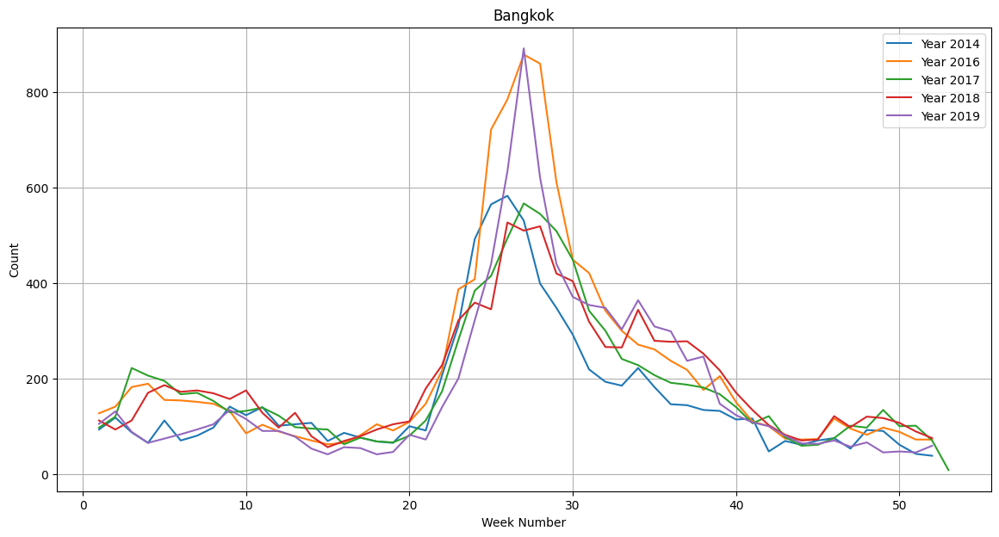

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154643"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       51.21 GB / 52.96 GB (96.7%)
Disk Space Avail:   47.16 GB / 78.19 GB (60.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 74.0012
[2000]	valid_set's rmse: 70.5455
[3000]	valid_set's rmse: 69.0106
[4000]	valid_set's rmse: 68.3099
[5000]	valid_set's rmse: 67.9517
[6000]	valid_set's rmse: 67.5253
[7000]	valid_set's rmse: 67.6677


	-67.5016	 = Validation score   (-root_mean_squared_error)
	3.53s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[8000]	valid_set's rmse: 67.7102


	-76.0311	 = Validation score   (-root_mean_squared_error)
	0.24s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-57.3259	 = Validation score   (-root_mean_squared_error)
	0.61s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-58.195	 = Validation score   (-root_mean_squared_error)
	0.56s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-94.6925	 = Validation score   (-root_mean_squared_error)
	4.97s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: XGBoost ...
	-59.2318	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-57.7453	 = Validation score   (-root_mean_squared_error)
	5.38s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-62.7111	 = Validation score   (-root_mean_squared_error)
	0.34s	 = Trai


RMSE: 39.23794010974002


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-39.237940,-39.237940,-54.006344,root_mean_squared_error,0.093363,0.071828,6.424339,0.003326,0.000447,0.016033,2,True,11
1,RandomForestMSE,-41.428842,-41.428842,-57.325920,root_mean_squared_error,0.061671,0.048713,0.614759,0.061671,0.048713,0.614759,1,True,5
2,XGBoost,-42.542986,-42.542986,-59.231776,root_mean_squared_error,0.008151,0.003539,0.392709,0.008151,0.003539,0.392709,1,True,8
3,ExtraTreesMSE,-46.504911,-46.504911,-58.194991,root_mean_squared_error,0.058848,0.050274,0.560889,0.058848,0.050274,0.560889,1,True,6
4,LightGBMLarge,-48.632063,-48.632063,-62.711141,root_mean_squared_error,0.017742,0.008220,0.343916,0.017742,0.008220,0.343916,1,True,10
5,KNeighborsDist,-50.927445,-50.927445,-62.155789,root_mean_squared_error,0.014374,0.015035,0.009991,0.014374,0.015035,0.009991,1,True,2
6,LightGBMXT,-51.965023,-51.965023,-67.501576,root_mean_squared_error,0.032571,0.014347,3.525152,0.032571,0.014347,3.525152,1,True,3
7,LightGBM,-52.537777,-52.537777,-76.031100,root_mean_squared_error,0.019104,0.012499,0.239225,0.019104,0.012499,0.239225,1,True,4
8,KNeighborsUnif,-55.848677,-55.848677,-65.608903,root_mean_squared_error,0.014989,0.015386,0.017971,0.014989,0.015386,0.017971,1,True,1
9,NeuralNetTorch,-56.259371,-56.259371,-57.745283,root_mean_squared_error,0.005226,0.003742,5.382868,0.005226,0.003742,5.382868,1,True,9


In [6]:
#*
province = "Bangkok"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Bangkok = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Bangkok.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Bangkok.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<hr>

## Samut Prakan

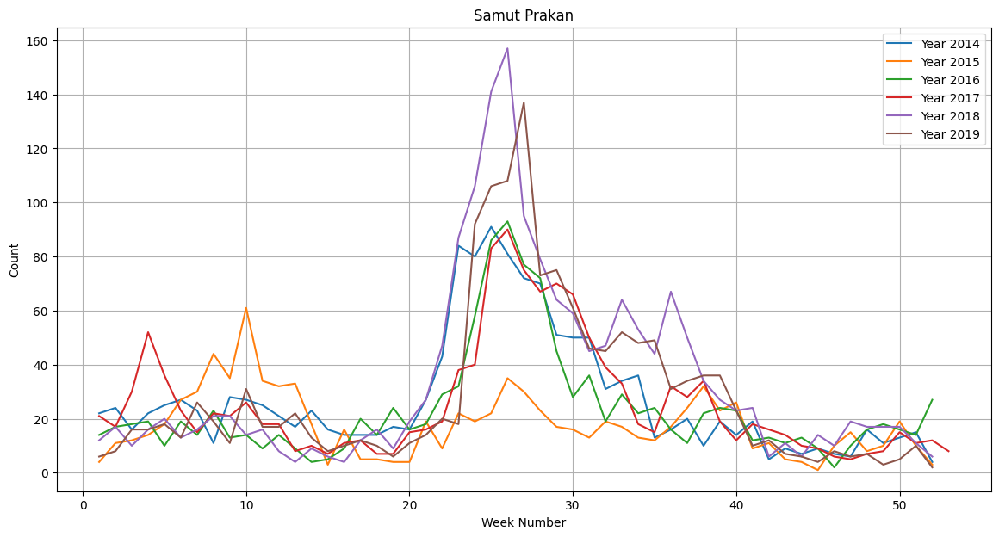

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154700"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   47.15 GB / 78.19 GB (60.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 13.752
[2000]	valid_set's rmse: 12.8471
[3000]	valid_set's rmse: 12.2224
[4000]	valid_set's rmse: 11.9652
[5000]	valid_set's rmse: 11.7514
[6000]	valid_set's rmse: 11.5654
[7000]	valid_set's rmse: 11.476
[8000]	valid_set's rmse: 11.3406
[9000]	valid_set's rmse: 11.2753
[10000]	valid_set's rmse: 11.2028


	-11.2028	 = Validation score   (-root_mean_squared_error)
	1.23s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 12.397
[2000]	valid_set's rmse: 11.2975
[3000]	valid_set's rmse: 10.7912
[4000]	valid_set's rmse: 10.7226
[5000]	valid_set's rmse: 10.6651
[6000]	valid_set's rmse: 10.6155
[7000]	valid_set's rmse: 10.6658
[8000]	valid_set's rmse: 10.655


	-10.6097	 = Validation score   (-root_mean_squared_error)
	1.35s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-10.9571	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-10.2921	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-15.489	 = Validation score   (-root_mean_squared_error)
	1.57s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-9.5843	 = Validation score   (-root_mean_squared_error)
	0.3s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-19.3534	 = Validation score   (-root_mean_squared_error)
	1.2s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...


[1000]	valid_set's rmse: 9.4849


	-9.4265	 = Validation score   (-root_mean_squared_error)
	0.83s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 0.579, 'XGBoost': 0.421}
	-9.2488	 = Validation score   (-root_mean_squared_error)
	0.02s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 8.3s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 4049.8 rows/s (50 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20240803_154700")



RMSE: 10.166167116762558


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-8.222635,-8.222635,-10.292113,root_mean_squared_error,0.060414,0.047213,0.496994,0.060414,0.047213,0.496994,1,True,6
1,LightGBMLarge,-10.149209,-10.149209,-9.426477,root_mean_squared_error,0.027741,0.007969,0.834928,0.027741,0.007969,0.834928,1,True,10
2,WeightedEnsemble_L2,-10.166167,-10.166167,-9.248765,root_mean_squared_error,0.041862,0.012346,1.160764,0.004102,0.000412,0.023103,2,True,11
3,XGBoost,-11.083365,-11.083365,-9.584291,root_mean_squared_error,0.010020,0.003964,0.302732,0.010020,0.003964,0.302732,1,True,8
4,LightGBM,-11.243881,-11.243881,-10.609718,root_mean_squared_error,0.041614,0.009857,1.354361,0.041614,0.009857,1.354361,1,True,4
5,LightGBMXT,-11.649417,-11.649417,-11.202847,root_mean_squared_error,0.044479,0.015604,1.227195,0.044479,0.015604,1.227195,1,True,3
6,NeuralNetFastAI,-12.208974,-12.208974,-15.488985,root_mean_squared_error,0.014868,0.008283,1.566841,0.014868,0.008283,1.566841,1,True,7
7,KNeighborsUnif,-12.657189,-12.657189,-12.834859,root_mean_squared_error,0.014554,0.014566,0.005133,0.014554,0.014566,0.005133,1,True,1
8,KNeighborsDist,-12.902267,-12.902267,-12.134007,root_mean_squared_error,0.013929,0.015087,0.004359,0.013929,0.015087,0.004359,1,True,2
9,RandomForestMSE,-12.941467,-12.941467,-10.957106,root_mean_squared_error,0.054861,0.049559,0.490782,0.054861,0.049559,0.490782,1,True,5


In [7]:
#*
province = "Samut Prakan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Samut_Prakan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Samut_Prakan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Samut_Prakan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nonthaburi

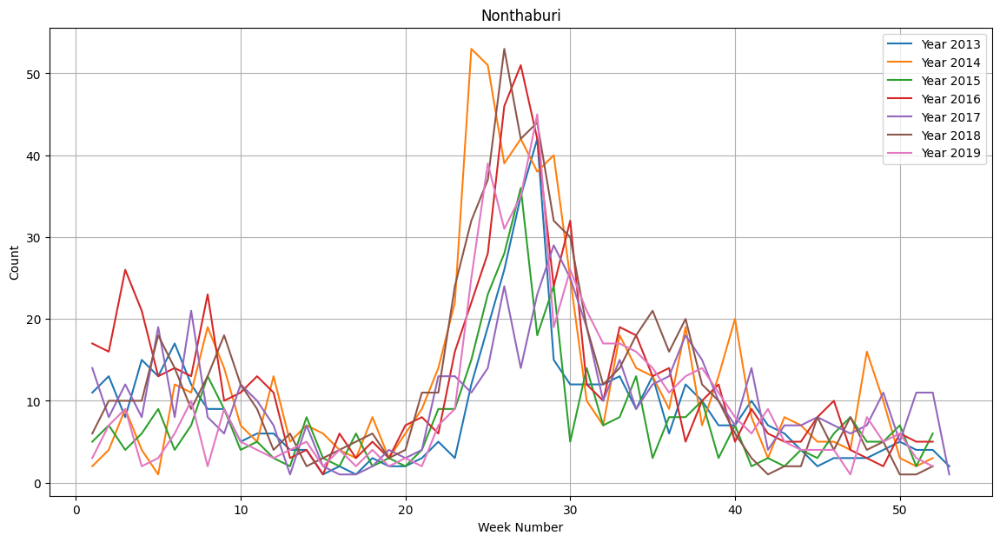

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154710"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.39 GB / 52.96 GB (95.1%)
Disk Space Avail:   47.12 GB / 78.19 GB (60.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.72195
[2000]	valid_set's rmse: 4.45109
[3000]	valid_set's rmse: 4.39181
[4000]	valid_set's rmse: 4.34431
[5000]	valid_set's rmse: 4.36215


	-4.344	 = Validation score   (-root_mean_squared_error)
	0.73s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-4.4745	 = Validation score   (-root_mean_squared_error)
	0.29s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.0568	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.7243	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.9675	 = Validation score   (-root_mean_squared_error)
	1.77s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.8449	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.0289	 = Validation score   (-root_mean_squared_error)
	4.65s	 = Training   runt


RMSE: 6.438546710645192


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT,-5.842835,-5.842835,-4.344049,root_mean_squared_error,0.027195,0.008699,0.730464,0.027195,0.008699,0.730464,1,True,3
1,WeightedEnsemble_L2,-6.438547,-6.438547,-3.870525,root_mean_squared_error,0.035432,0.012488,5.391148,0.002353,0.000439,0.014121,2,True,11
2,LightGBMLarge,-6.445473,-6.445473,-4.564772,root_mean_squared_error,0.018005,0.010015,0.360679,0.018005,0.010015,0.360679,1,True,10
3,LightGBM,-6.512515,-6.512515,-4.474479,root_mean_squared_error,0.006714,0.010022,0.293984,0.006714,0.010022,0.293984,1,True,4
4,ExtraTreesMSE,-6.691586,-6.691586,-4.724251,root_mean_squared_error,0.058284,0.047134,0.494091,0.058284,0.047134,0.494091,1,True,6
5,RandomForestMSE,-6.752251,-6.752251,-5.056842,root_mean_squared_error,0.056998,0.048923,0.524683,0.056998,0.048923,0.524683,1,True,5
6,XGBoost,-6.883568,-6.883568,-4.844881,root_mean_squared_error,0.009194,0.002486,0.143259,0.009194,0.002486,0.143259,1,True,8
7,NeuralNetTorch,-6.977476,-6.977476,-4.028910,root_mean_squared_error,0.005884,0.003350,4.646563,0.005884,0.003350,4.646563,1,True,9
8,KNeighborsDist,-7.572509,-7.572509,-5.401300,root_mean_squared_error,0.013912,0.015286,0.004107,0.013912,0.015286,0.004107,1,True,2
9,KNeighborsUnif,-7.678542,-7.678542,-5.436100,root_mean_squared_error,0.014404,0.014024,0.004881,0.014404,0.014024,0.004881,1,True,1


In [8]:
#*
province = "Nonthaburi"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nonthaburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nonthaburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nonthaburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

# Pathum Thani

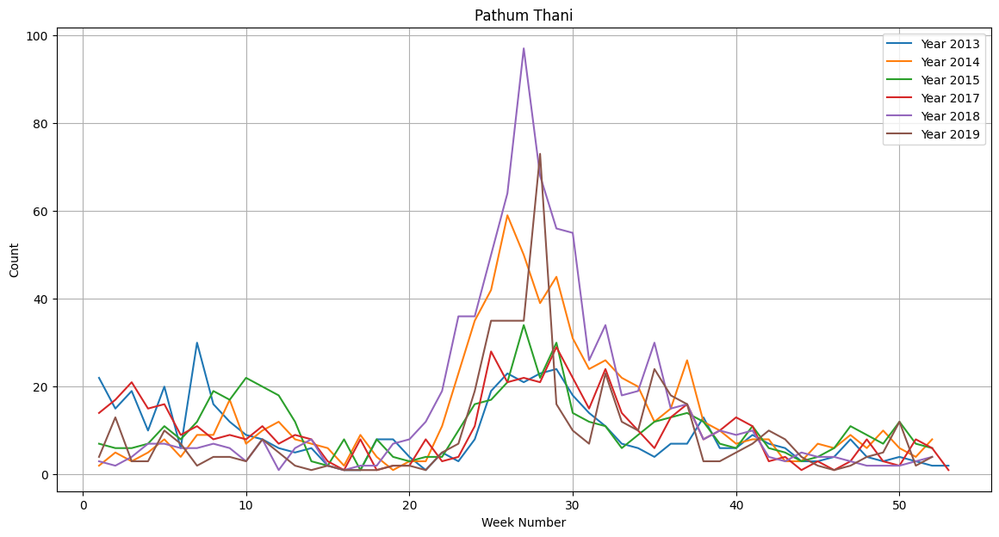

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154720"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.37 GB / 52.96 GB (95.1%)
Disk Space Avail:   47.11 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.39817
[2000]	valid_set's rmse: 7.79082
[3000]	valid_set's rmse: 7.48319
[4000]	valid_set's rmse: 7.35487
[5000]	valid_set's rmse: 7.27717
[6000]	valid_set's rmse: 7.26226
[7000]	valid_set's rmse: 7.26253
[8000]	valid_set's rmse: 7.27229


	-7.2608	 = Validation score   (-root_mean_squared_error)
	1.1s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-7.3363	 = Validation score   (-root_mean_squared_error)
	0.27s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-8.1831	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-7.5532	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-10.8056	 = Validation score   (-root_mean_squared_error)
	1.61s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-10.5236	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-14.989	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   run


RMSE: 7.223013573266722


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-5.831035,-5.831035,-7.764245,root_mean_squared_error,0.017923,0.010277,0.332892,0.017923,0.010277,0.332892,1,True,10
1,WeightedEnsemble_L2,-7.223014,-7.223014,-7.155443,root_mean_squared_error,0.141929,0.078473,2.218635,0.003149,0.000394,0.014348,2,True,11
2,ExtraTreesMSE,-7.483964,-7.483964,-7.553250,root_mean_squared_error,0.058182,0.047979,0.501584,0.058182,0.047979,0.501584,1,True,6
3,LightGBM,-7.651206,-7.651206,-7.336341,root_mean_squared_error,0.022229,0.010195,0.273780,0.022229,0.010195,0.273780,1,True,4
4,XGBoost,-7.809266,-7.809266,-10.523634,root_mean_squared_error,0.007510,0.002430,0.139370,0.007510,0.002430,0.139370,1,True,8
5,LightGBMXT,-7.850495,-7.850495,-7.260824,root_mean_squared_error,0.040446,0.009627,1.096031,0.040446,0.009627,1.096031,1,True,3
6,RandomForestMSE,-7.875435,-7.875435,-8.183115,root_mean_squared_error,0.060673,0.046749,0.491846,0.060673,0.046749,0.491846,1,True,5
7,KNeighborsUnif,-9.361556,-9.361556,-8.737748,root_mean_squared_error,0.014410,0.014056,0.005214,0.014410,0.014056,0.005214,1,True,1
8,KNeighborsDist,-9.536845,-9.536845,-8.983431,root_mean_squared_error,0.013983,0.013490,0.004007,0.013983,0.013490,0.004007,1,True,2
9,NeuralNetFastAI,-11.090313,-11.090313,-10.805638,root_mean_squared_error,0.014404,0.008491,1.609715,0.014404,0.008491,1.609715,1,True,7


In [9]:
#*
province = "Pathum Thani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Pathum_Thani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Pathum_Thani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Pathum_Thani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<hr>

## Phra Nakhon Si Ayutthaya

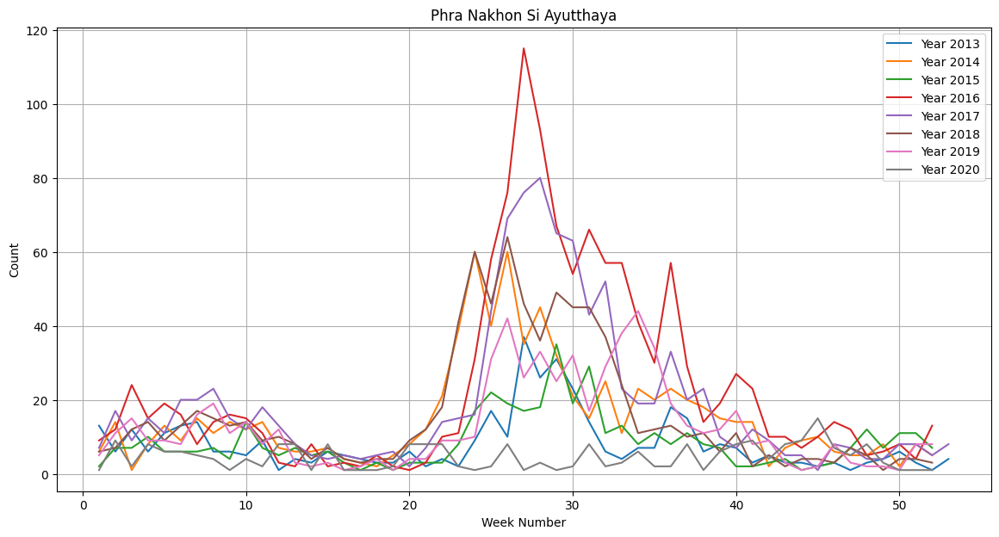

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154726"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.36 GB / 52.96 GB (95.1%)
Disk Space Avail:   47.09 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.58088
[2000]	valid_set's rmse: 7.71774
[3000]	valid_set's rmse: 7.42996
[4000]	valid_set's rmse: 7.24188
[5000]	valid_set's rmse: 7.18166
[6000]	valid_set's rmse: 7.19437


	-7.1956	 = Validation score   (-root_mean_squared_error)
	0.96s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-5.4645	 = Validation score   (-root_mean_squared_error)
	0.31s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.7144	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.9565	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.0038	 = Validation score   (-root_mean_squared_error)
	0.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.3459	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.9856	 = Validation score   (-root_mean_squared_error)
	5.52s	 = Training   run


RMSE: 8.790417107404064


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-8.031406,-8.031406,-5.956535,root_mean_squared_error,0.062884,0.047158,0.491409,0.062884,0.047158,0.491409,1,True,6
1,RandomForestMSE,-8.618886,-8.618886,-5.714420,root_mean_squared_error,0.057801,0.046631,0.494845,0.057801,0.046631,0.494845,1,True,5
2,XGBoost,-8.698426,-8.698426,-5.345896,root_mean_squared_error,0.009362,0.002882,0.146996,0.009362,0.002882,0.146996,1,True,8
3,WeightedEnsemble_L2,-8.790417,-8.790417,-5.016180,root_mean_squared_error,0.060500,0.030617,1.389854,0.003140,0.000424,0.019474,2,True,11
4,NeuralNetTorch,-8.802041,-8.802041,-5.985633,root_mean_squared_error,0.005866,0.003908,5.519634,0.005866,0.003908,5.519634,1,True,9
5,LightGBMLarge,-8.896814,-8.896814,-5.093107,root_mean_squared_error,0.012398,0.010336,0.375691,0.012398,0.010336,0.375691,1,True,10
6,LightGBM,-8.941732,-8.941732,-5.464525,root_mean_squared_error,0.023683,0.010203,0.305415,0.023683,0.010203,0.305415,1,True,4
7,LightGBMXT,-8.972186,-8.972186,-7.195558,root_mean_squared_error,0.032307,0.014880,0.958872,0.032307,0.014880,0.958872,1,True,3
8,KNeighborsDist,-10.009275,-10.009275,-9.379267,root_mean_squared_error,0.013951,0.014206,0.004929,0.013951,0.014206,0.004929,1,True,2
9,KNeighborsUnif,-10.312752,-10.312752,-10.002238,root_mean_squared_error,0.014894,0.014986,0.005439,0.014894,0.014986,0.005439,1,True,1


In [10]:
province = "Phra Nakhon Si Ayutthaya" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phra_Nakhon_Si_Ayutthaya = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phra_Nakhon_Si_Ayutthaya.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phra_Nakhon_Si_Ayutthaya.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<hr>

## Ang Thong

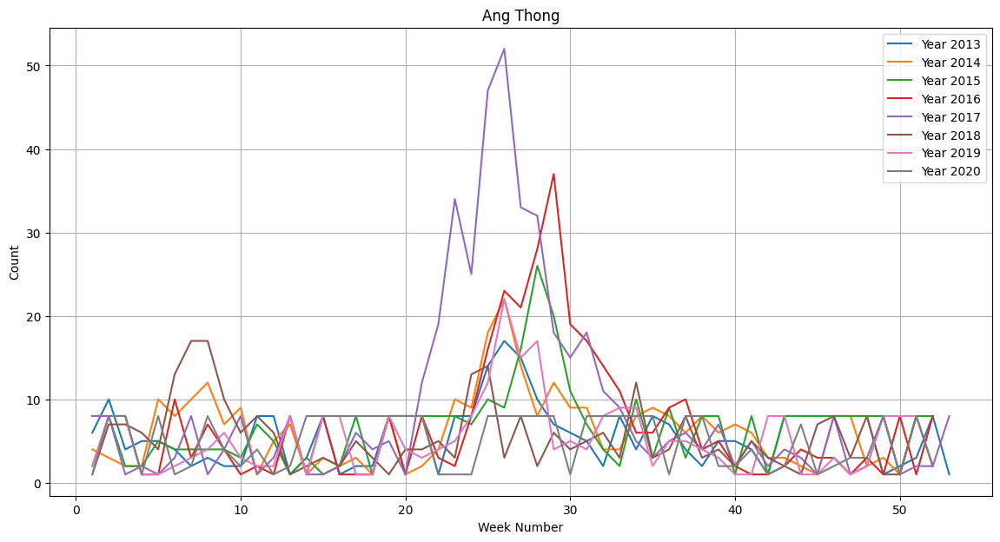

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154736"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.36 GB / 52.96 GB (95.1%)
Disk Space Avail:   47.07 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 3.73293
[2000]	valid_set's rmse: 3.6331
[3000]	valid_set's rmse: 3.61779


	-3.6159	 = Validation score   (-root_mean_squared_error)
	0.58s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-3.8014	 = Validation score   (-root_mean_squared_error)
	0.24s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-3.8938	 = Validation score   (-root_mean_squared_error)
	0.53s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.4318	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.3808	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.722	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.7569	 = Validation score   (-root_mean_squared_error)
	4.67s	 = Training   runt


RMSE: 3.588964622360581


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBM,-3.469169,-3.469169,-3.801355,root_mean_squared_error,0.016580,0.012357,0.240817,0.016580,0.012357,0.240817,1,True,4
1,LightGBMXT,-3.562832,-3.562832,-3.615935,root_mean_squared_error,0.033716,0.008585,0.582681,0.033716,0.008585,0.582681,1,True,3
2,WeightedEnsemble_L2,-3.588965,-3.588965,-3.364944,root_mean_squared_error,0.083708,0.064824,5.438622,0.002666,0.000407,0.014331,2,True,11
3,ExtraTreesMSE,-3.669799,-3.669799,-3.431820,root_mean_squared_error,0.058661,0.048154,0.508536,0.058661,0.048154,0.508536,1,True,6
4,KNeighborsDist,-3.755549,-3.755549,-3.841915,root_mean_squared_error,0.014029,0.013857,0.004570,0.014029,0.013857,0.004570,1,True,2
5,KNeighborsUnif,-3.790087,-3.790087,-3.878221,root_mean_squared_error,0.014361,0.014333,0.004077,0.014361,0.014333,0.004077,1,True,1
6,RandomForestMSE,-3.792657,-3.792657,-3.893765,root_mean_squared_error,0.057457,0.048538,0.530991,0.057457,0.048538,0.530991,1,True,5
7,LightGBMLarge,-3.802249,-3.802249,-3.593097,root_mean_squared_error,0.006922,0.010325,0.355461,0.006922,0.010325,0.355461,1,True,10
8,XGBoost,-4.060461,-4.060461,-3.722020,root_mean_squared_error,0.009113,0.002750,0.136736,0.009113,0.002750,0.136736,1,True,8
9,NeuralNetTorch,-4.369270,-4.369270,-3.756934,root_mean_squared_error,0.005801,0.003907,4.674938,0.005801,0.003907,4.674938,1,True,9


In [11]:
province = "Ang Thong" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Ang_Thong = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Ang_Thong.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Ang_Thong.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Lopburi

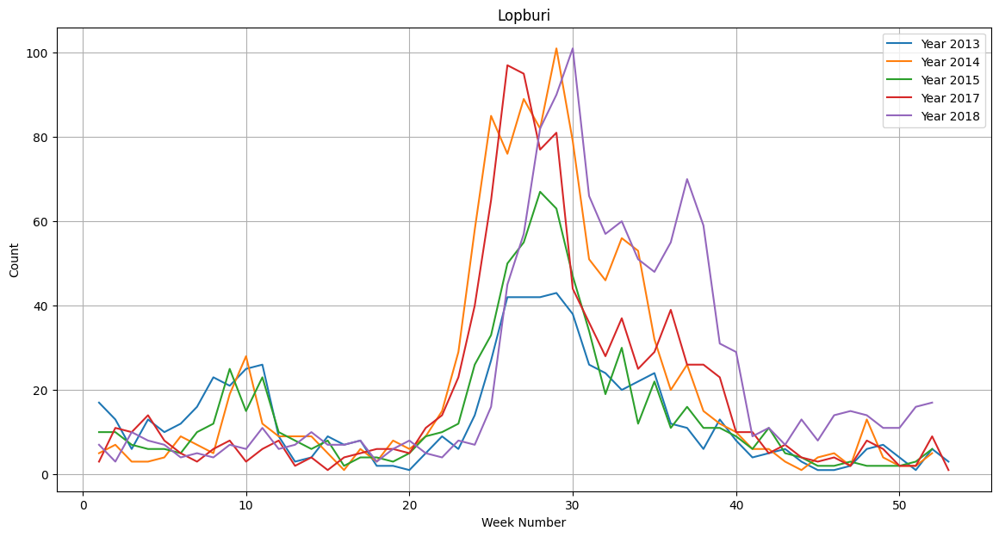

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154745"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   47.06 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 13.3685
[2000]	valid_set's rmse: 13.0029


	-12.989	 = Validation score   (-root_mean_squared_error)
	1.08s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.75, 'NeuralNetFastAI': 0.1, 'LightGBMLarge': 0.1, 'NeuralNetTorch': 0.05}
	-10.5426	 = Validation score   (-root_mean_squared_error)
	0.01s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 5.57s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 661.0 rows/s (42 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20240803_154745")



RMSE: 7.7765270352184315


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-6.746544,-6.746544,-12.988978,root_mean_squared_error,0.031288,0.008504,1.078666,0.031288,0.008504,1.078666,1,True,10
1,ExtraTreesMSE,-7.221748,-7.221748,-10.718047,root_mean_squared_error,0.058156,0.041472,0.498070,0.058156,0.041472,0.498070,1,True,6
2,WeightedEnsemble_L2,-7.776527,-7.776527,-10.542612,root_mean_squared_error,0.119223,0.063545,3.516248,0.009156,0.000395,0.014374,2,True,11
3,RandomForestMSE,-8.644964,-8.644964,-17.678194,root_mean_squared_error,0.058456,0.049654,0.522848,0.058456,0.049654,0.522848,1,True,5
4,KNeighborsUnif,-9.376486,-9.376486,-16.334276,root_mean_squared_error,0.014271,0.014025,0.005085,0.014271,0.014025,0.005085,1,True,1
5,XGBoost,-9.453676,-9.453676,-13.209655,root_mean_squared_error,0.015698,0.003129,0.285126,0.015698,0.003129,0.285126,1,True,8
6,KNeighborsDist,-9.516004,-9.516004,-16.695462,root_mean_squared_error,0.013890,0.013706,0.004796,0.013890,0.013706,0.004796,1,True,2
7,LightGBM,-10.970507,-10.970507,-15.571572,root_mean_squared_error,0.020285,0.015820,0.230989,0.020285,0.015820,0.230989,1,True,4
8,NeuralNetFastAI,-12.278548,-12.278548,-12.888658,root_mean_squared_error,0.014659,0.009492,1.481258,0.014659,0.009492,1.481258,1,True,7
9,LightGBMXT,-12.308891,-12.308891,-13.125605,root_mean_squared_error,0.009915,0.009948,0.288569,0.009915,0.009948,0.288569,1,True,3


In [12]:
province = "Lopburi" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018] #* select year that is outliner ,2016
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Lopburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Lopburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Lopburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Sing Buri

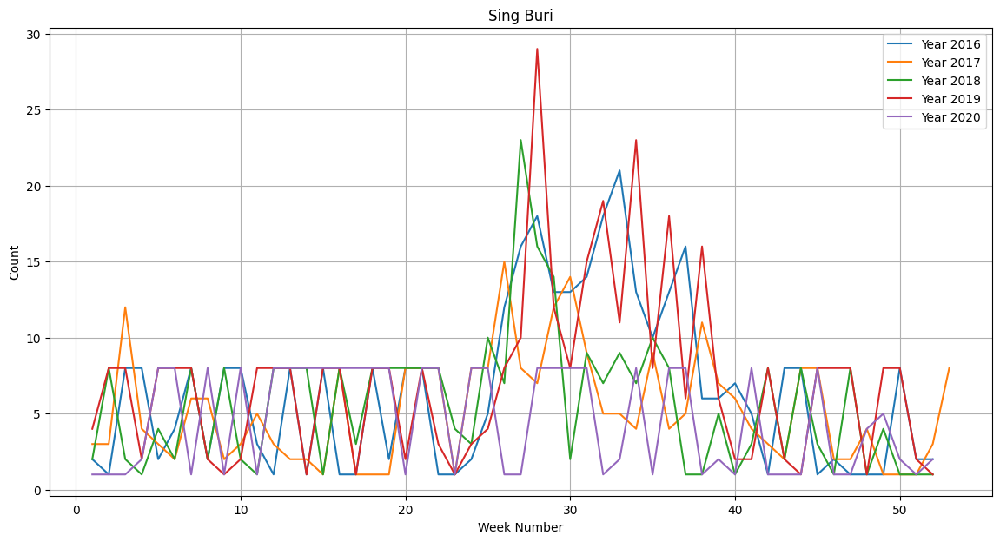

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154751"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   47.04 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 3.90063


	-3.7155	 = Validation score   (-root_mean_squared_error)
	0.23s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.0042	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.8973	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-3.9333	 = Validation score   (-root_mean_squared_error)
	1.37s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.9139	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.978	 = Validation score   (-root_mean_squared_error)
	1.59s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.6102	 = Validation score   (-root_mean_squared_error)
	0.29s	 = Training   r


RMSE: 3.871741006042545


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.785236,-3.785236,-3.897268,root_mean_squared_error,0.058487,0.050832,0.490991,0.058487,0.050832,0.490991,1,True,6
1,WeightedEnsemble_L2,-3.871741,-3.871741,-3.587866,root_mean_squared_error,0.047181,0.025198,2.128712,0.002589,0.000398,0.014027,2,True,11
2,LightGBMLarge,-3.910642,-3.910642,-3.610248,root_mean_squared_error,0.017141,0.010514,0.294914,0.017141,0.010514,0.294914,1,True,10
3,LightGBMXT,-3.915908,-3.915908,-3.893937,root_mean_squared_error,0.018221,0.015221,0.287291,0.018221,0.015221,0.287291,1,True,3
4,LightGBM,-3.934251,-3.934251,-3.715499,root_mean_squared_error,0.021737,0.010512,0.233482,0.021737,0.010512,0.233482,1,True,4
5,KNeighborsDist,-4.003926,-4.003926,-4.106345,root_mean_squared_error,0.014348,0.013807,0.004461,0.014348,0.013807,0.004461,1,True,2
6,NeuralNetFastAI,-4.030767,-4.030767,-3.933330,root_mean_squared_error,0.015416,0.009318,1.370867,0.015416,0.009318,1.370867,1,True,7
7,KNeighborsUnif,-4.055465,-4.055465,-4.156349,root_mean_squared_error,0.014368,0.014254,0.004604,0.014368,0.014254,0.004604,1,True,1
8,RandomForestMSE,-4.119179,-4.119179,-4.004186,root_mean_squared_error,0.061901,0.046675,0.499868,0.061901,0.046675,0.499868,1,True,5
9,NeuralNetTorch,-4.157351,-4.157351,-3.978050,root_mean_squared_error,0.005714,0.003774,1.586289,0.005714,0.003774,1.586289,1,True,9


In [13]:
province = "Sing Buri" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Sing_Buri = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Sing_Buri.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Sing_Buri.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Chainat

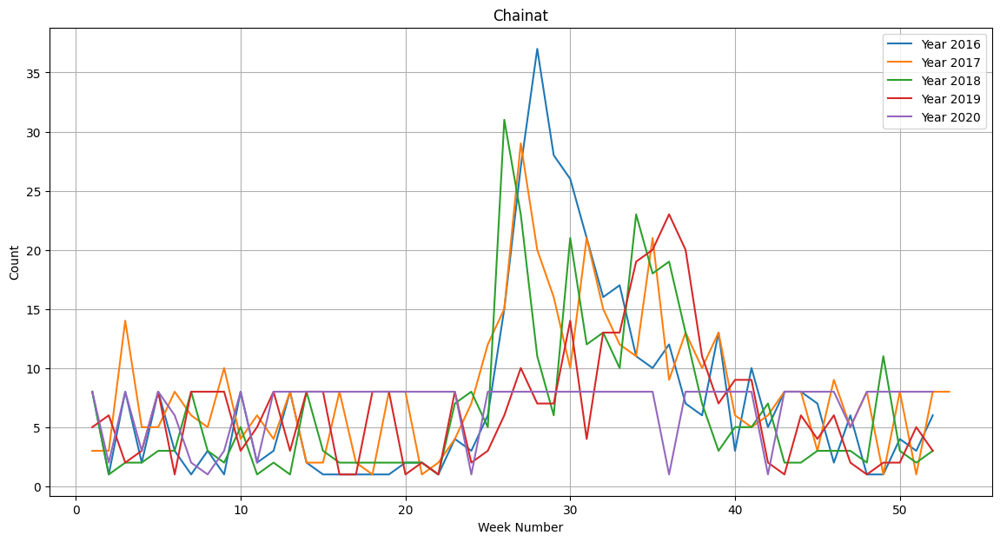

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154758"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.30 GB / 52.96 GB (95.0%)
Disk Space Avail:   47.03 GB / 78.19 GB (60.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.40576
[2000]	valid_set's rmse: 4.33883


	-4.231	 = Validation score   (-root_mean_squared_error)
	0.26s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.6895	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.4793	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.7238	 = Validation score   (-root_mean_squared_error)
	1.33s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.6559	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.3857	 = Validation score   (-root_mean_squared_error)
	3.5s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.2322	 = Validation score   (-root_mean_squared_error)
	0.29s	 = Training   ru


RMSE: 3.814785125760958


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.604281,-3.604281,-4.479298,root_mean_squared_error,0.056849,0.048776,0.489986,0.056849,0.048776,0.489986,1,True,6
1,KNeighborsDist,-3.615483,-3.615483,-5.198560,root_mean_squared_error,0.013788,0.013587,0.004058,0.013788,0.013587,0.004058,1,True,2
2,KNeighborsUnif,-3.622779,-3.622779,-5.164900,root_mean_squared_error,0.014295,0.013805,0.006022,0.014295,0.013805,0.006022,1,True,1
3,LightGBMXT,-3.657152,-3.657152,-4.351243,root_mean_squared_error,0.020105,0.008479,0.408718,0.020105,0.008479,0.408718,1,True,3
4,NeuralNetTorch,-3.711973,-3.711973,-4.385676,root_mean_squared_error,0.007661,0.004097,3.497797,0.007661,0.004097,3.497797,1,True,9
5,WeightedEnsemble_L2,-3.814785,-3.814785,-4.158823,root_mean_squared_error,0.050234,0.031994,4.071729,0.003675,0.000469,0.015046,2,True,11
6,NeuralNetFastAI,-3.972748,-3.972748,-4.723766,root_mean_squared_error,0.021142,0.008296,1.329327,0.021142,0.008296,1.329327,1,True,7
7,LightGBMLarge,-3.986852,-3.986852,-4.232219,root_mean_squared_error,0.016912,0.015781,0.294037,0.016912,0.015781,0.294037,1,True,10
8,XGBoost,-4.123220,-4.123220,-4.655949,root_mean_squared_error,0.012113,0.002479,0.127033,0.012113,0.002479,0.127033,1,True,8
9,LightGBM,-4.295592,-4.295592,-4.231012,root_mean_squared_error,0.021986,0.011647,0.264849,0.021986,0.011647,0.264849,1,True,4


In [14]:
province = "Chainat" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chainat = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chainat.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chainat.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Saraburi

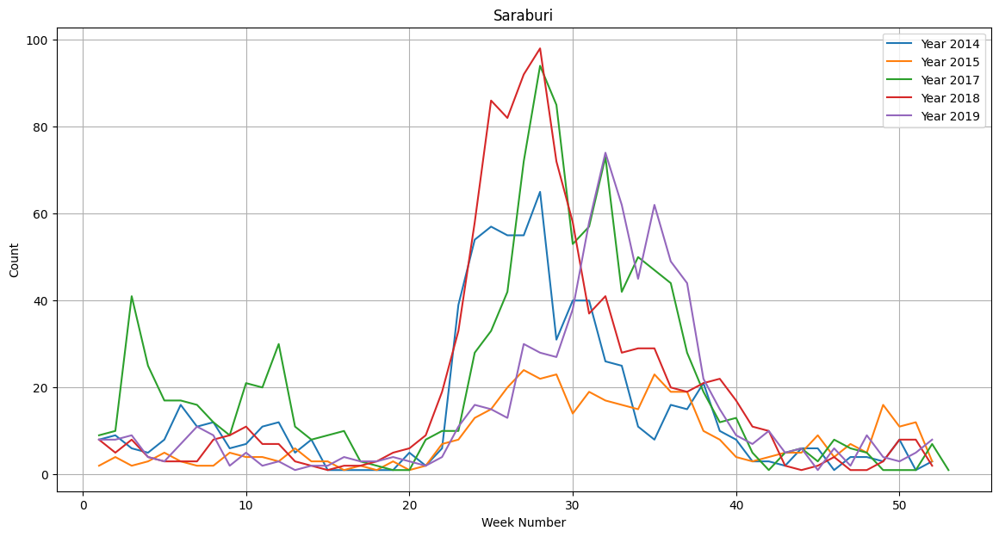

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154806"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   47.02 GB / 78.19 GB (60.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 12.2451
[1000]	valid_set's rmse: 9.63713
[2000]	valid_set's rmse: 8.96561
[3000]	valid_set's rmse: 8.70432
[4000]	valid_set's rmse: 8.19673
[5000]	valid_set's rmse: 8.02338
[6000]	valid_set's rmse: 7.885
[7000]	valid_set's rmse: 7.69012
[8000]	valid_set's rmse: 7.55674
[9000]	valid_set's rmse: 7.4491
[10000]	valid_set's rmse: 7.33011


	-7.3301	 = Validation score   (-root_mean_squared_error)
	1.38s	 = Training   runtime
	0.02s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-10.0611	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-7.8411	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-11.8828	 = Validation score   (-root_mean_squared_error)
	1.47s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-7.6542	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-8.0781	 = Validation score   (-root_mean_squared_error)
	2.51s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...


[1000]	valid_set's rmse: 6.19133


	-6.091	 = Validation score   (-root_mean_squared_error)
	0.77s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 0.895, 'ExtraTreesMSE': 0.105}
	-6.0639	 = Validation score   (-root_mean_squared_error)
	0.01s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 8.39s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 722.4 rows/s (42 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20240803_154806")



RMSE: 7.342297229416183


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.078087,-6.078087,-7.841098,root_mean_squared_error,0.058509,0.048975,0.499151,0.058509,0.048975,0.499151,1,True,6
1,XGBoost,-6.488013,-6.488013,-7.654213,root_mean_squared_error,0.008111,0.002948,0.164481,0.008111,0.002948,0.164481,1,True,8
2,WeightedEnsemble_L2,-7.342297,-7.342297,-6.063913,root_mean_squared_error,0.088998,0.058140,1.281443,0.004389,0.000441,0.013793,2,True,11
3,RandomForestMSE,-7.632056,-7.632056,-10.061069,root_mean_squared_error,0.061799,0.047347,0.508228,0.061799,0.047347,0.508228,1,True,5
4,LightGBM,-7.681545,-7.681545,-7.330105,root_mean_squared_error,0.051281,0.016335,1.382457,0.051281,0.016335,1.382457,1,True,4
5,LightGBMLarge,-7.793642,-7.793642,-6.091004,root_mean_squared_error,0.026100,0.008725,0.768499,0.026100,0.008725,0.768499,1,True,10
6,NeuralNetTorch,-8.130356,-8.130356,-8.078077,root_mean_squared_error,0.005170,0.003331,2.513489,0.005170,0.003331,2.513489,1,True,9
7,LightGBMXT,-10.109353,-10.109353,-12.127671,root_mean_squared_error,0.013244,0.009980,0.299798,0.013244,0.009980,0.299798,1,True,3
8,NeuralNetFastAI,-10.180454,-10.180454,-11.882824,root_mean_squared_error,0.014864,0.009378,1.469338,0.014864,0.009378,1.469338,1,True,7
9,KNeighborsDist,-10.709403,-10.709403,-12.761842,root_mean_squared_error,0.013852,0.013635,0.004111,0.013852,0.013635,0.004111,1,True,2


In [15]:
province = "Saraburi" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Saraburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Saraburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Saraburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Chonburi

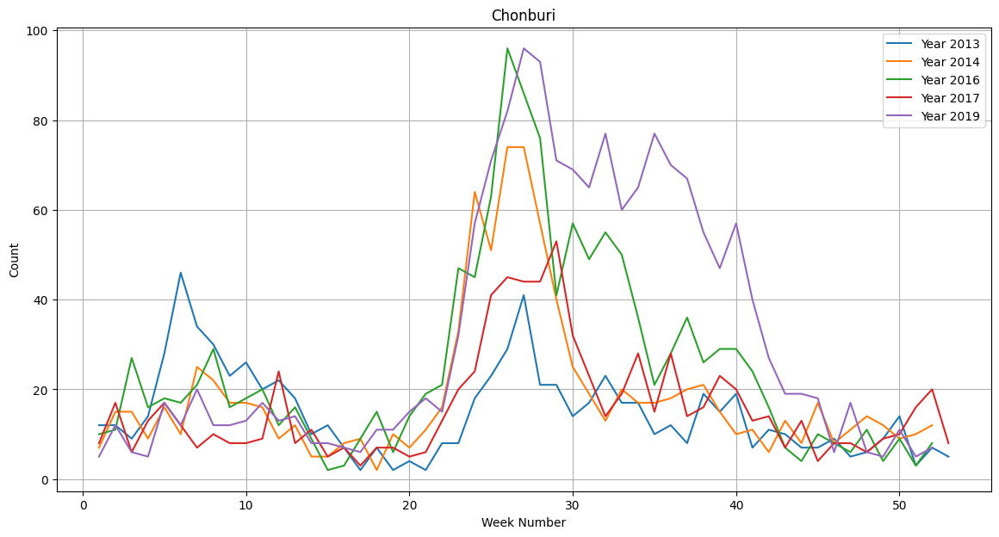

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154815"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   47.00 GB / 78.19 GB (60.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 14.2338
[2000]	valid_set's rmse: 13.8553
[3000]	valid_set's rmse: 13.7558


	-13.7445	 = Validation score   (-root_mean_squared_error)
	0.58s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-10.476	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 10.5699


	-10.0946	 = Validation score   (-root_mean_squared_error)
	0.53s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-9.4811	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.4517	 = Validation score   (-root_mean_squared_error)
	1.35s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-11.6608	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-22.5851	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-10.1413	 = Validation score   (-root_mean_squared_error)
	0.34s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.667, 'RandomForestMSE': 0.167, 


RMSE: 7.737617588243486


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-6.729199,-6.729199,-10.141349,root_mean_squared_error,0.011575,0.001029,0.343338,0.011575,0.001029,0.343338,1,True,10
1,WeightedEnsemble_L2,-7.737618,-7.737618,-9.350838,root_mean_squared_error,0.130332,0.098892,1.376597,0.002882,0.000391,0.014382,2,True,11
2,RandomForestMSE,-7.766942,-7.766942,-10.094643,root_mean_squared_error,0.057674,0.048899,0.531359,0.057674,0.048899,0.531359,1,True,5
3,LightGBM,-7.845236,-7.845236,-10.476039,root_mean_squared_error,0.006514,0.014278,0.382310,0.006514,0.014278,0.382310,1,True,4
4,ExtraTreesMSE,-8.501413,-8.501413,-9.481147,root_mean_squared_error,0.058202,0.048573,0.487517,0.058202,0.048573,0.487517,1,True,6
5,XGBoost,-8.608715,-8.608715,-11.660774,root_mean_squared_error,0.008137,0.002501,0.138247,0.008137,0.002501,0.138247,1,True,8
6,KNeighborsDist,-8.613452,-8.613452,-12.586343,root_mean_squared_error,0.013804,0.014707,0.005271,0.013804,0.014707,0.005271,1,True,2
7,KNeighborsUnif,-9.214345,-9.214345,-13.660719,root_mean_squared_error,0.014482,0.014917,0.005542,0.014482,0.014917,0.005542,1,True,1
8,LightGBMXT,-10.959350,-10.959350,-13.744459,root_mean_squared_error,0.011549,0.007634,0.578108,0.011549,0.007634,0.578108,1,True,3
9,NeuralNetFastAI,-12.231436,-12.231436,-13.451723,root_mean_squared_error,0.014609,0.008514,1.348583,0.014609,0.008514,1.348583,1,True,7


In [16]:
province = "Chonburi" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2016,2017,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chonburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chonburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chonburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Rayong

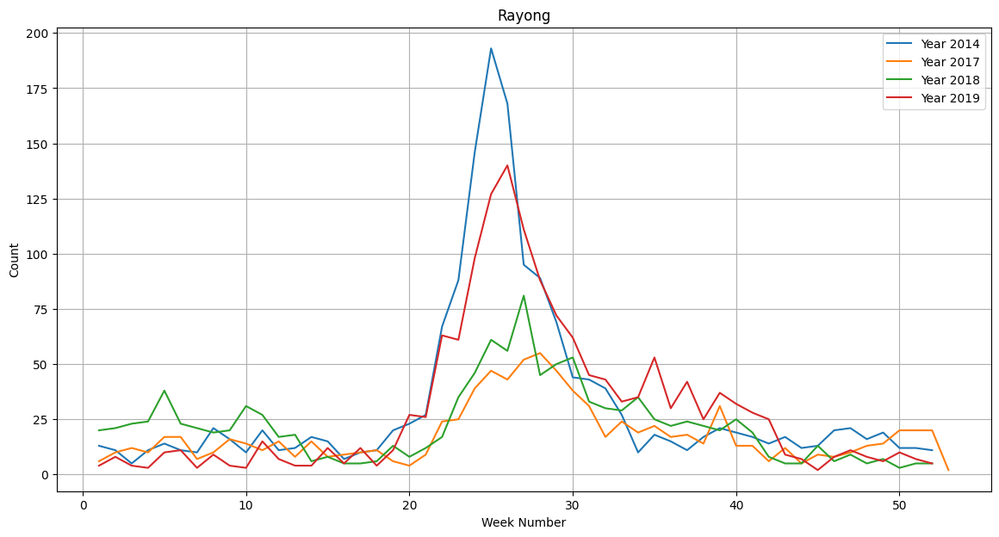

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154821"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.29 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.99 GB / 78.19 GB (60.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 22.3421
[2000]	valid_set's rmse: 21.6947
[3000]	valid_set's rmse: 21.2417
[4000]	valid_set's rmse: 21.0766
[5000]	valid_set's rmse: 20.924
[6000]	valid_set's rmse: 20.8886
[7000]	valid_set's rmse: 20.8887
[8000]	valid_set's rmse: 20.8704


	-20.8748	 = Validation score   (-root_mean_squared_error)
	0.98s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-20.5882	 = Validation score   (-root_mean_squared_error)
	0.42s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 20.9305
[2000]	valid_set's rmse: 20.7733


	-15.2524	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-16.2262	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-22.4795	 = Validation score   (-root_mean_squared_error)
	1.15s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-19.5776	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-17.0997	 = Validation score   (-root_mean_squared_error)
	2.43s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-18.5369	 = Validation score   (-root_mean_squared_error)
	0.32s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'RandomForestMSE': 0.833, 'KNeighborsDist': 0.111


RMSE: 13.218722445420894


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-12.253086,-12.253086,-18.536872,root_mean_squared_error,0.009914,0.001029,0.321636,0.009914,0.001029,0.321636,1,True,10
1,RandomForestMSE,-13.022540,-13.022540,-15.252435,root_mean_squared_error,0.059232,0.048140,0.457418,0.059232,0.048140,0.457418,1,True,5
2,WeightedEnsemble_L2,-13.218722,-13.218722,-15.174224,root_mean_squared_error,0.082026,0.065429,2.903871,0.002822,0.000384,0.014023,2,True,11
3,ExtraTreesMSE,-13.352977,-13.352977,-16.226169,root_mean_squared_error,0.057694,0.047501,0.461692,0.057694,0.047501,0.461692,1,True,6
4,NeuralNetTorch,-13.751112,-13.751112,-17.099714,root_mean_squared_error,0.005708,0.003298,2.428221,0.005708,0.003298,2.428221,1,True,9
5,XGBoost,-14.863844,-14.863844,-19.577622,root_mean_squared_error,0.008970,0.002319,0.134774,0.008970,0.002319,0.134774,1,True,8
6,KNeighborsDist,-15.924641,-15.924641,-17.495113,root_mean_squared_error,0.014263,0.013607,0.004209,0.014263,0.013607,0.004209,1,True,2
7,KNeighborsUnif,-17.058750,-17.058750,-21.244016,root_mean_squared_error,0.014256,0.013877,0.004621,0.014256,0.013877,0.004621,1,True,1
8,LightGBM,-19.189379,-19.189379,-20.588216,root_mean_squared_error,0.009748,0.008605,0.423277,0.009748,0.008605,0.423277,1,True,4
9,LightGBMXT,-20.341455,-20.341455,-20.874782,root_mean_squared_error,0.018746,0.010816,0.977307,0.018746,0.010816,0.977307,1,True,3


In [17]:
province = "Rayong" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Rayong = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Rayong.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Rayong.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Chanthaburi

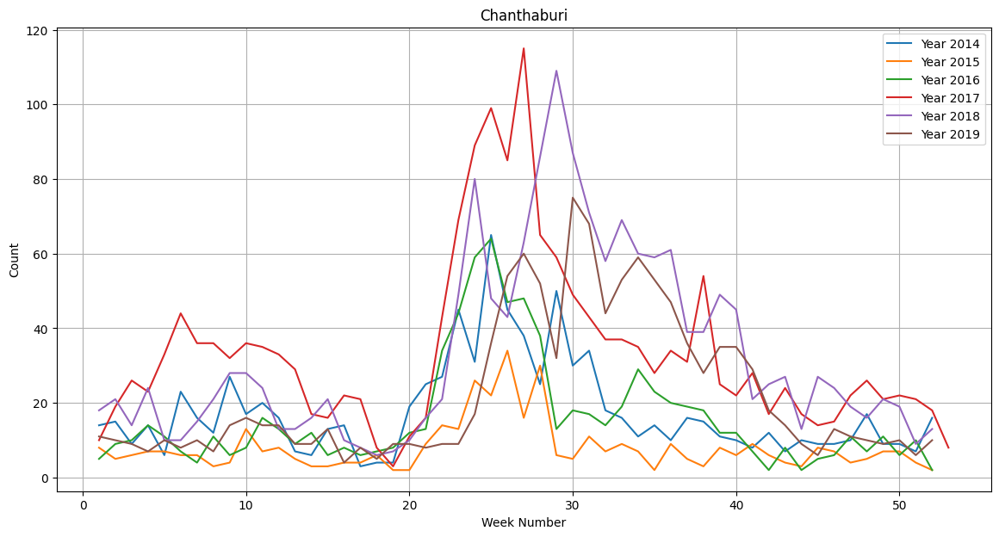

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154828"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.30 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.98 GB / 78.19 GB (60.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 12.8769
[2000]	valid_set's rmse: 12.5744
[3000]	valid_set's rmse: 12.5445


	-12.4902	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-11.1863	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 11.2057


	-11.8061	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-10.6883	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.8701	 = Validation score   (-root_mean_squared_error)
	1.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-10.9735	 = Validation score   (-root_mean_squared_error)
	0.19s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-9.7149	 = Validation score   (-root_mean_squared_error)
	4.99s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-13.19	 = Validation score   (-root_mean_squared_error)
	0.35s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'NeuralNetTorch': 0.727, 'KNeighborsDist': 0.136, 'X


RMSE: 6.719756876386463


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-6.719757,-6.719757,-9.475413,root_mean_squared_error,0.032451,0.020792,5.198957,0.002852,0.000613,0.014775,2,True,11
1,NeuralNetTorch,-7.510492,-7.510492,-9.714884,root_mean_squared_error,0.005500,0.003389,4.992205,0.005500,0.003389,4.992205,1,True,9
2,LightGBMXT,-7.838890,-7.838890,-12.490236,root_mean_squared_error,0.009505,0.001869,0.509635,0.009505,0.001869,0.509635,1,True,3
3,LightGBMLarge,-7.844779,-7.844779,-13.190012,root_mean_squared_error,0.011300,0.001007,0.346018,0.011300,0.001007,0.346018,1,True,10
4,ExtraTreesMSE,-8.221628,-8.221628,-10.688275,root_mean_squared_error,0.056933,0.046971,0.457668,0.056933,0.046971,0.457668,1,True,6
5,KNeighborsDist,-8.639414,-8.639414,-12.701295,root_mean_squared_error,0.014134,0.014161,0.004281,0.014134,0.014161,0.004281,1,True,2
6,KNeighborsUnif,-8.876185,-8.876185,-12.788901,root_mean_squared_error,0.014384,0.013944,0.005254,0.014384,0.013944,0.005254,1,True,1
7,RandomForestMSE,-9.035252,-9.035252,-11.806052,root_mean_squared_error,0.057633,0.047359,0.463511,0.057633,0.047359,0.463511,1,True,5
8,LightGBM,-9.110508,-9.110508,-11.186350,root_mean_squared_error,0.007139,0.001464,0.387320,0.007139,0.001464,0.387320,1,True,4
9,XGBoost,-9.358737,-9.358737,-10.973545,root_mean_squared_error,0.009965,0.002630,0.187697,0.009965,0.002630,0.187697,1,True,8


In [18]:
province = "Chanthaburi" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chanthaburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chanthaburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chanthaburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Trat

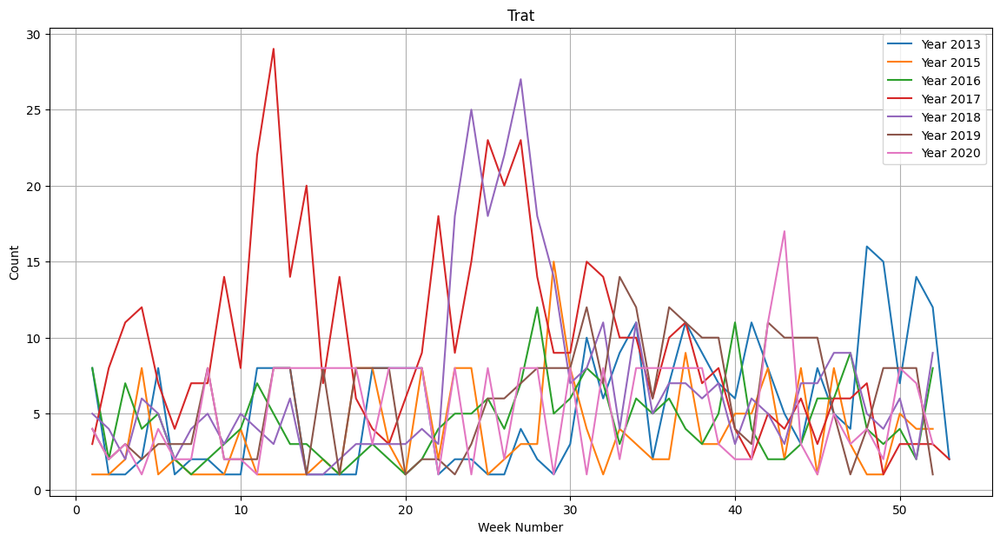

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154838"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.97 GB / 78.19 GB (60.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.30351
[2000]	valid_set's rmse: 4.20671
[3000]	valid_set's rmse: 4.20037


	-4.1881	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-4.3363	 = Validation score   (-root_mean_squared_error)
	0.27s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.1564	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.2415	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.04s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
No improvement since epoch 6: early stopping
	-4.4878	 = Validation score   (-root_mean_squared_error)
	1.55s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.4648	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.0983	 = Validation score   (-root_m


RMSE: 3.7734066171864917


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.554336,-3.554336,-4.241497,root_mean_squared_error,0.057205,0.039582,0.458557,0.057205,0.039582,0.458557,1,True,6
1,WeightedEnsemble_L2,-3.773407,-3.773407,-4.083858,root_mean_squared_error,0.072949,0.050483,0.957370,0.002227,0.000394,0.013853,2,True,11
2,LightGBMXT,-3.883512,-3.883512,-4.188147,root_mean_squared_error,0.012514,0.001820,0.481138,0.012514,0.001820,0.481138,1,True,3
3,RandomForestMSE,-3.892896,-3.892896,-4.156364,root_mean_squared_error,0.058207,0.048268,0.462380,0.058207,0.048268,0.462380,1,True,5
4,LightGBMLarge,-3.915031,-3.915031,-4.404518,root_mean_squared_error,0.015670,0.000898,0.336195,0.015670,0.000898,0.336195,1,True,10
5,LightGBM,-3.955423,-3.955423,-4.336344,root_mean_squared_error,0.007983,0.000969,0.268293,0.007983,0.000969,0.268293,1,True,4
6,KNeighborsDist,-4.012598,-4.012598,-4.852103,root_mean_squared_error,0.014022,0.014170,0.003939,0.014022,0.014170,0.003939,1,True,2
7,KNeighborsUnif,-4.016116,-4.016116,-4.914662,root_mean_squared_error,0.014313,0.014017,0.004760,0.014313,0.014017,0.004760,1,True,1
8,XGBoost,-4.031546,-4.031546,-4.464773,root_mean_squared_error,0.007312,0.002491,0.130271,0.007312,0.002491,0.130271,1,True,8
9,NeuralNetFastAI,-4.153006,-4.153006,-4.487829,root_mean_squared_error,0.016858,0.008322,1.545782,0.016858,0.008322,1.545782,1,True,7


In [19]:
province = "Trat" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Trat = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Trat.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Trat.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Chachoengsao

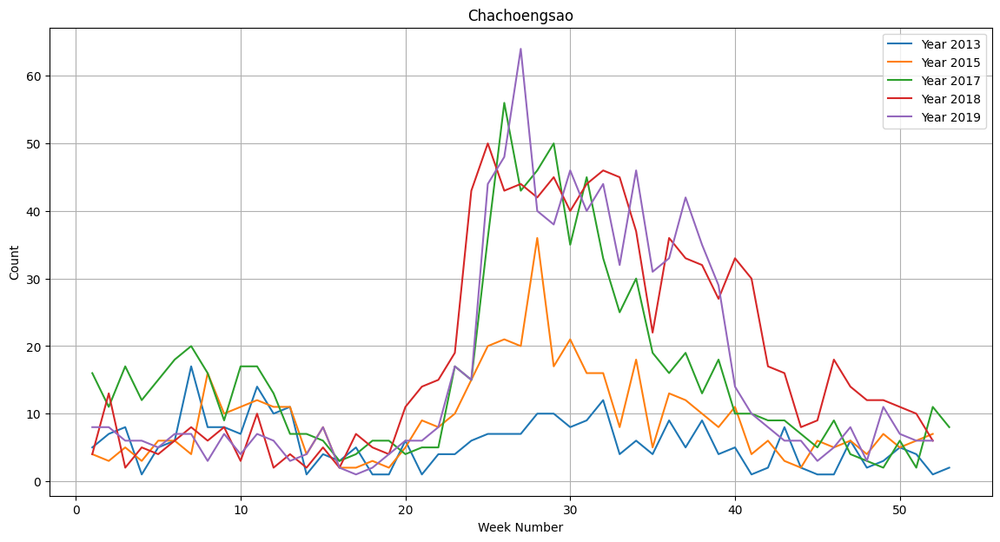

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154844"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.46 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.95 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.0208
[2000]	valid_set's rmse: 4.65464
[3000]	valid_set's rmse: 4.63626


	-4.6442	 = Validation score   (-root_mean_squared_error)
	0.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-5.7043	 = Validation score   (-root_mean_squared_error)
	0.24s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.8694	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.1435	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.8841	 = Validation score   (-root_mean_squared_error)
	1.34s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.7168	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.8137	 = Validation score   (-root_mean_squared_error)
	2.1s	 = Training   runti


RMSE: 4.652566579209719


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.540613,-4.540613,-4.143485,root_mean_squared_error,0.055389,0.051912,0.489734,0.055389,0.051912,0.489734,1,True,6
1,WeightedEnsemble_L2,-4.652567,-4.652567,-3.439632,root_mean_squared_error,0.080013,0.065538,3.275939,0.003213,0.000377,0.013934,2,True,11
2,RandomForestMSE,-4.817381,-4.817381,-5.869411,root_mean_squared_error,0.056630,0.047152,0.470405,0.056630,0.047152,0.470405,1,True,5
3,LightGBMLarge,-5.099690,-5.099690,-5.604783,root_mean_squared_error,0.015051,0.000993,0.305942,0.015051,0.000993,0.305942,1,True,10
4,NeuralNetTorch,-5.253387,-5.253387,-3.813672,root_mean_squared_error,0.004928,0.003323,2.102073,0.004928,0.003323,2.102073,1,True,9
5,LightGBMXT,-5.374702,-5.374702,-4.644242,root_mean_squared_error,0.009163,0.007602,0.540822,0.009163,0.007602,0.540822,1,True,3
6,LightGBM,-5.400270,-5.400270,-5.704281,root_mean_squared_error,0.002523,0.003188,0.241652,0.002523,0.003188,0.241652,1,True,4
7,XGBoost,-5.437140,-5.437140,-5.716810,root_mean_squared_error,0.007320,0.002323,0.129375,0.007320,0.002323,0.129375,1,True,8
8,KNeighborsDist,-5.540736,-5.540736,-5.780625,root_mean_squared_error,0.014159,0.013898,0.004831,0.014159,0.013898,0.004831,1,True,2
9,KNeighborsUnif,-5.774440,-5.774440,-5.856620,root_mean_squared_error,0.014362,0.014456,0.004530,0.014362,0.014456,0.004530,1,True,1


In [20]:
province = "Chachoengsao" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chachoengsao = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chachoengsao.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chachoengsao.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Prachinburi

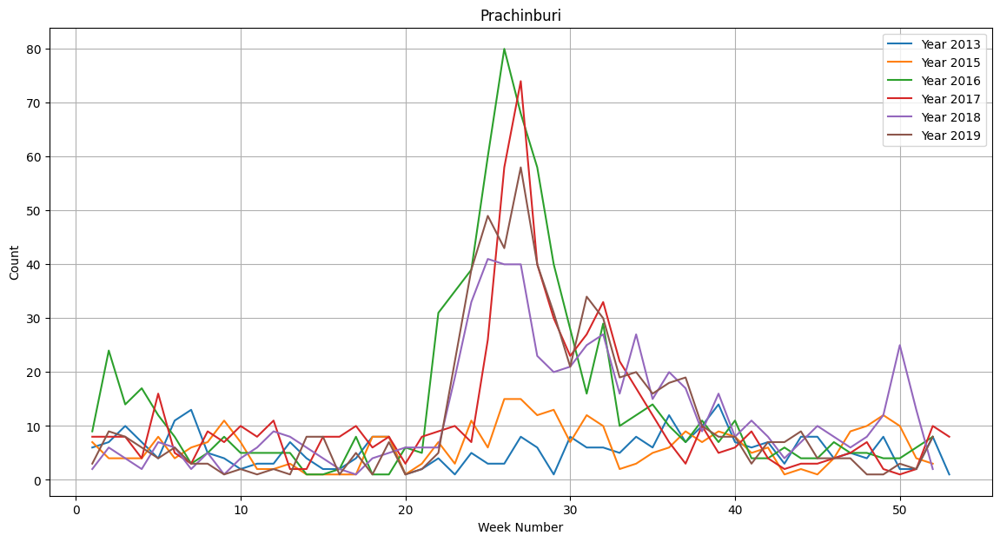

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154851"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.46 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.94 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.67916
[2000]	valid_set's rmse: 7.99764
[3000]	valid_set's rmse: 7.63757
[4000]	valid_set's rmse: 7.41625
[5000]	valid_set's rmse: 7.29139
[6000]	valid_set's rmse: 7.23996
[7000]	valid_set's rmse: 7.20848
[8000]	valid_set's rmse: 7.188
[9000]	valid_set's rmse: 7.17887


	-7.1663	 = Validation score   (-root_mean_squared_error)
	1.16s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[10000]	valid_set's rmse: 7.17125
[1000]	valid_set's rmse: 7.22528
[2000]	valid_set's rmse: 6.95505


	-6.9526	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-6.0517	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.1579	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.3863	 = Validation score   (-root_mean_squared_error)
	1.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-6.2684	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-14.0262	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-6.5169	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   


RMSE: 6.6056278793465


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-6.460268,-6.460268,-6.516945,root_mean_squared_error,0.019413,0.010008,0.392025,0.019413,0.010008,0.392025,1,True,10
1,XGBoost,-6.502008,-6.502008,-6.268371,root_mean_squared_error,0.010095,0.002577,0.154802,0.010095,0.002577,0.154802,1,True,8
2,WeightedEnsemble_L2,-6.605628,-6.605628,-5.934860,root_mean_squared_error,0.132005,0.099368,1.089947,0.003007,0.000407,0.014188,2,True,11
3,LightGBM,-6.657865,-6.657865,-6.952586,root_mean_squared_error,0.029172,0.001918,0.501474,0.029172,0.001918,0.501474,1,True,4
4,ExtraTreesMSE,-6.701605,-6.701605,-6.157906,root_mean_squared_error,0.058128,0.047291,0.454169,0.058128,0.047291,0.454169,1,True,6
5,LightGBMXT,-6.977624,-6.977624,-7.166257,root_mean_squared_error,0.044909,0.005809,1.158005,0.044909,0.005809,1.158005,1,True,3
6,RandomForestMSE,-7.045733,-7.045733,-6.051748,root_mean_squared_error,0.060775,0.049093,0.466788,0.060775,0.049093,0.466788,1,True,5
7,NeuralNetFastAI,-9.144718,-9.144718,-9.386322,root_mean_squared_error,0.015595,0.008387,1.544788,0.015595,0.008387,1.544788,1,True,7
8,KNeighborsDist,-9.781805,-9.781805,-7.479804,root_mean_squared_error,0.014171,0.013757,0.003799,0.014171,0.013757,0.003799,1,True,2
9,KNeighborsUnif,-9.908502,-9.908502,-7.829056,root_mean_squared_error,0.014086,0.014024,0.004515,0.014086,0.014024,0.004515,1,True,1


In [21]:
province = "Prachinburi" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Prachinburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Prachinburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Prachinburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Nayok

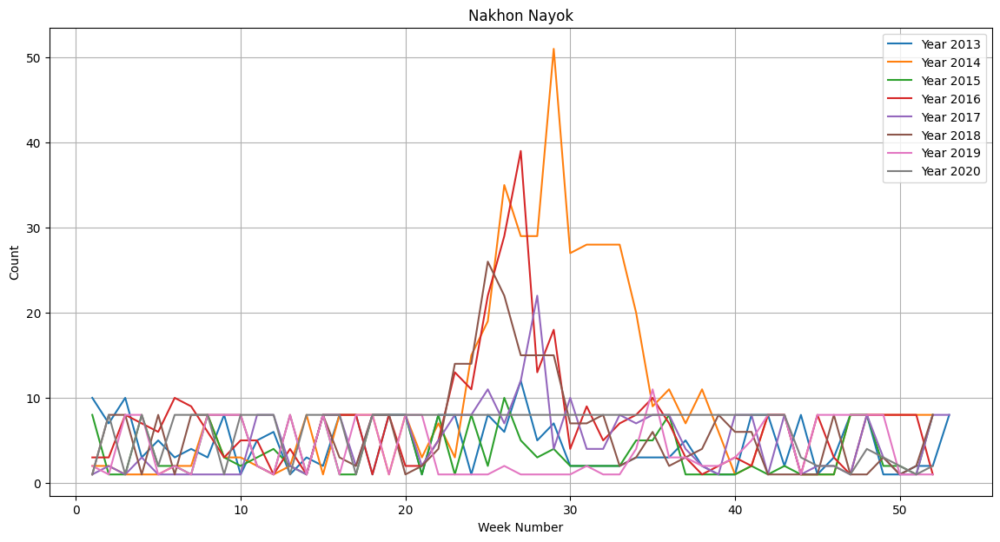

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154857"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.92 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.04377
[2000]	valid_set's rmse: 3.92337
[3000]	valid_set's rmse: 3.81008
[4000]	valid_set's rmse: 3.74325
[5000]	valid_set's rmse: 3.68679
[6000]	valid_set's rmse: 3.63506
[7000]	valid_set's rmse: 3.60682
[8000]	valid_set's rmse: 3.5773
[9000]	valid_set's rmse: 3.55549
[10000]	valid_set's rmse: 3.52774


	-3.5277	 = Validation score   (-root_mean_squared_error)
	1.28s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 3.48532
[2000]	valid_set's rmse: 3.33794


	-3.2845	 = Validation score   (-root_mean_squared_error)
	0.73s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 3.28821


	-3.4697	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.2685	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.5327	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.3164	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.106	 = Validation score   (-root_mean_squared_error)
	0.75s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.1259	 = Validation score   (-root_mean_squared_error)
	0.37s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 0.533, 'LightGBM': 0.2, 'XGBoost': 0.2,


RMSE: 3.6528602519031965


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-3.373876,-3.373876,-3.316410,root_mean_squared_error,0.007967,0.002418,0.147535,0.007967,0.002418,0.147535,1,True,8
1,RandomForestMSE,-3.598304,-3.598304,-3.469675,root_mean_squared_error,0.059657,0.048111,0.474037,0.059657,0.048111,0.474037,1,True,5
2,ExtraTreesMSE,-3.602583,-3.602583,-3.268485,root_mean_squared_error,0.058369,0.048555,0.468577,0.058369,0.048555,0.468577,1,True,6
3,WeightedEnsemble_L2,-3.652860,-3.652860,-3.029720,root_mean_squared_error,0.051331,0.012667,1.714768,0.003115,0.000385,0.013953,2,True,11
4,LightGBMXT,-3.746398,-3.746398,-3.527737,root_mean_squared_error,0.032669,0.005446,1.281537,0.032669,0.005446,1.281537,1,True,3
5,LightGBM,-3.752432,-3.752432,-3.284535,root_mean_squared_error,0.018672,0.002729,0.730666,0.018672,0.002729,0.730666,1,True,4
6,LightGBMLarge,-3.931167,-3.931167,-3.125916,root_mean_squared_error,0.010172,0.001009,0.373523,0.010172,0.001009,0.373523,1,True,10
7,KNeighborsDist,-5.607928,-5.607928,-5.523163,root_mean_squared_error,0.014322,0.015058,0.004541,0.014322,0.015058,0.004541,1,True,2
8,KNeighborsUnif,-5.639444,-5.639444,-5.647454,root_mean_squared_error,0.014410,0.014182,0.005028,0.014410,0.014182,0.005028,1,True,1
9,NeuralNetFastAI,-5.731465,-5.731465,-4.532657,root_mean_squared_error,0.011405,0.006126,0.449090,0.011405,0.006126,0.449090,1,True,7


In [22]:
province = "Nakhon Nayok" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Nayok = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Nayok.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Nayok.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Sa Kaeo

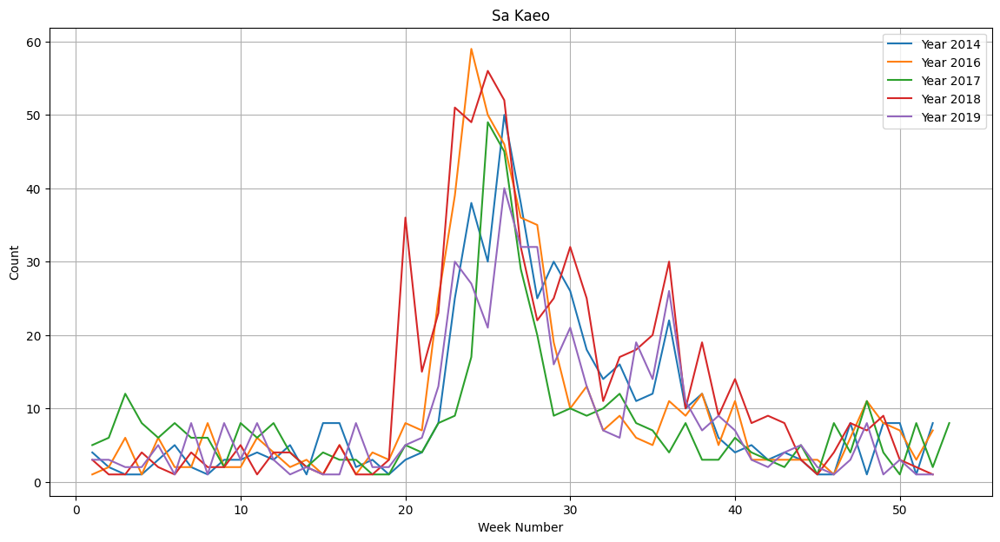

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154903"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.90 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 7.62666
[2000]	valid_set's rmse: 7.41474
[3000]	valid_set's rmse: 7.27966
[4000]	valid_set's rmse: 7.21719
[5000]	valid_set's rmse: 7.19004
[6000]	valid_set's rmse: 7.18212


	-7.1687	 = Validation score   (-root_mean_squared_error)
	0.84s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[7000]	valid_set's rmse: 7.16548


	-6.5402	 = Validation score   (-root_mean_squared_error)
	0.24s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-7.2227	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.6861	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-8.3536	 = Validation score   (-root_mean_squared_error)
	1.32s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-6.9413	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-11.3633	 = Validation score   (-root_mean_squared_error)
	0.43s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-6.8417	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   


RMSE: 5.575370759440385


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMXT,-5.418208,-5.418208,-7.168687,root_mean_squared_error,0.025196,0.002737,0.841314,0.025196,0.002737,0.841314,1,True,3
1,XGBoost,-5.428285,-5.428285,-6.941291,root_mean_squared_error,0.008824,0.002541,0.157102,0.008824,0.002541,0.157102,1,True,8
2,WeightedEnsemble_L2,-5.575371,-5.575371,-6.389351,root_mean_squared_error,0.098378,0.064690,1.159435,0.002994,0.000410,0.013688,2,True,11
3,ExtraTreesMSE,-5.767432,-5.767432,-6.686065,root_mean_squared_error,0.055312,0.048361,0.510449,0.055312,0.048361,0.510449,1,True,6
4,LightGBMLarge,-5.833691,-5.833691,-6.841658,root_mean_squared_error,0.018344,0.015081,0.395840,0.018344,0.015081,0.395840,1,True,10
5,RandomForestMSE,-6.029343,-6.029343,-7.222682,root_mean_squared_error,0.058624,0.047497,0.467477,0.058624,0.047497,0.467477,1,True,5
6,KNeighborsUnif,-6.050916,-6.050916,-8.430331,root_mean_squared_error,0.015709,0.013957,0.005076,0.015709,0.013957,0.005076,1,True,1
7,KNeighborsDist,-6.172809,-6.172809,-7.869762,root_mean_squared_error,0.014879,0.013763,0.003737,0.014879,0.013763,0.003737,1,True,2
8,LightGBM,-6.335502,-6.335502,-6.540201,root_mean_squared_error,0.021727,0.000838,0.239458,0.021727,0.000838,0.239458,1,True,4
9,NeuralNetFastAI,-7.512058,-7.512058,-8.353563,root_mean_squared_error,0.014707,0.008946,1.315594,0.014707,0.008946,1.315594,1,True,7


In [23]:
province = "Sa Kaeo" #*
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Sa_Kaeo = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Sa_Kaeo.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Sa_Kaeo.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Ratchasima

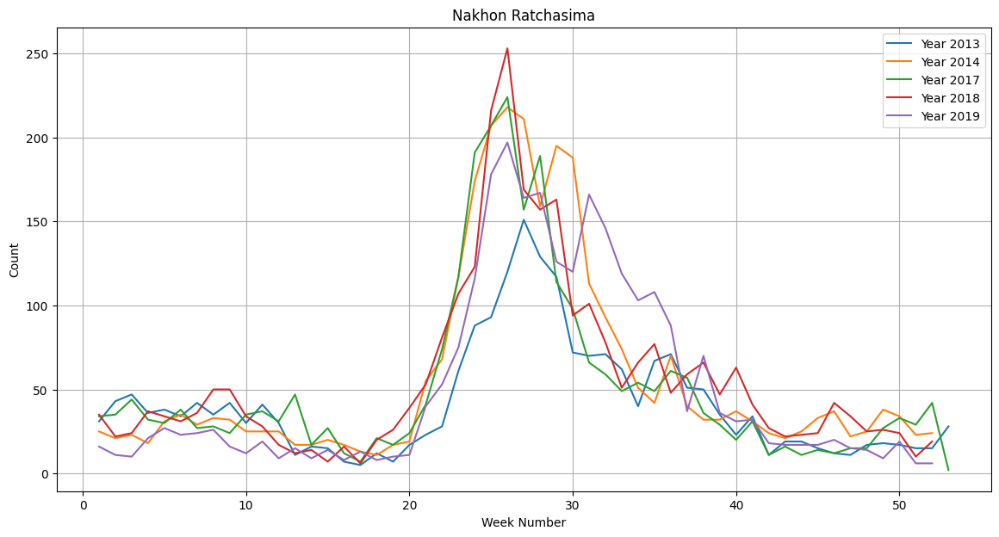

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154909"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.89 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 24.169
[2000]	valid_set's rmse: 22.0958
[3000]	valid_set's rmse: 21.5462


	-21.5527	 = Validation score   (-root_mean_squared_error)
	0.63s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[4000]	valid_set's rmse: 21.5824


	-21.9898	 = Validation score   (-root_mean_squared_error)
	0.26s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-23.0774	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-25.7829	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-32.3834	 = Validation score   (-root_mean_squared_error)
	1.29s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-21.8899	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-62.0114	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-19.2916	 = Validation score   (-root_mean_squared_error)
	0.31s	 = Train


RMSE: 18.058206829415482


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-18.038895,-18.038895,-19.291599,root_mean_squared_error,0.011027,0.000886,0.314783,0.011027,0.000886,0.314783,1,True,10
1,WeightedEnsemble_L2,-18.058207,-18.058207,-19.266018,root_mean_squared_error,0.074505,0.050688,1.039551,0.002741,0.000382,0.014068,2,True,11
2,ExtraTreesMSE,-18.284724,-18.284724,-25.782898,root_mean_squared_error,0.054281,0.047880,0.459926,0.054281,0.047880,0.459926,1,True,6
3,XGBoost,-18.391858,-18.391858,-21.889914,root_mean_squared_error,0.007482,0.002487,0.132719,0.007482,0.002487,0.132719,1,True,8
4,LightGBMXT,-19.871421,-19.871421,-21.552690,root_mean_squared_error,0.012069,0.004114,0.629100,0.012069,0.004114,0.629100,1,True,3
5,KNeighborsDist,-20.685739,-20.685739,-32.464377,root_mean_squared_error,0.014103,0.013979,0.004309,0.014103,0.013979,0.004309,1,True,2
6,LightGBM,-20.774218,-20.774218,-21.989807,root_mean_squared_error,0.003248,0.000847,0.260398,0.003248,0.000847,0.260398,1,True,4
7,KNeighborsUnif,-20.915771,-20.915771,-31.201999,root_mean_squared_error,0.014607,0.014489,0.004912,0.014607,0.014489,0.004912,1,True,1
8,RandomForestMSE,-21.713887,-21.713887,-23.077391,root_mean_squared_error,0.057488,0.048573,0.450302,0.057488,0.048573,0.450302,1,True,5
9,NeuralNetFastAI,-25.908213,-25.908213,-32.383417,root_mean_squared_error,0.013498,0.008255,1.293901,0.013498,0.008255,1.293901,1,True,7


In [24]:
#*
province = "Nakhon Ratchasima"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Ratchasima = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Ratchasima.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Ratchasima.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Buriram

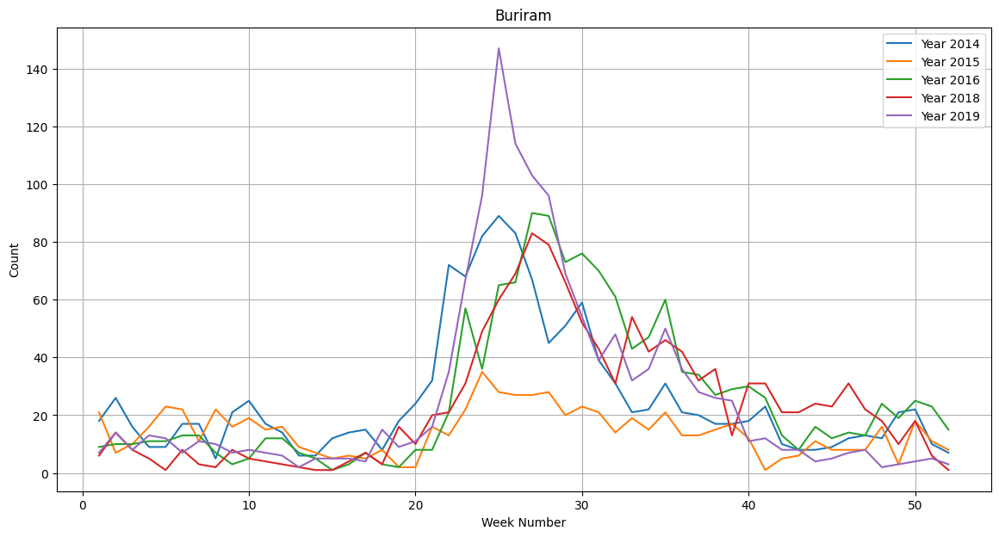

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154914"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.88 GB / 78.19 GB (60.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 11.605
[2000]	valid_set's rmse: 10.8697
[3000]	valid_set's rmse: 10.6399
[4000]	valid_set's rmse: 10.5518
[5000]	valid_set's rmse: 10.5298
[6000]	valid_set's rmse: 10.6047


	-10.545	 = Validation score   (-root_mean_squared_error)
	0.79s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-11.041	 = Validation score   (-root_mean_squared_error)
	0.25s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-10.6754	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-8.744	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.2932	 = Validation score   (-root_mean_squared_error)
	1.3s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-7.7053	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.3026	 = Validation score   (-root_mean_squared_error)
	3.56s	 = Training   runti


RMSE: 6.09719570249447


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-6.097196,-6.097196,-5.284260,root_mean_squared_error,0.015550,0.006321,3.717788,0.002330,0.000393,0.014027,2,True,11
1,NeuralNetTorch,-6.228330,-6.228330,-5.302644,root_mean_squared_error,0.005291,0.003679,3.564814,0.005291,0.003679,3.564814,1,True,9
2,ExtraTreesMSE,-7.601636,-7.601636,-8.744002,root_mean_squared_error,0.054720,0.047631,0.453710,0.054720,0.047631,0.453710,1,True,6
3,LightGBMLarge,-8.995332,-8.995332,-9.549483,root_mean_squared_error,0.011155,0.001016,0.343124,0.011155,0.001016,0.343124,1,True,10
4,LightGBMXT,-9.732277,-9.732277,-10.544954,root_mean_squared_error,0.015719,0.002512,0.785377,0.015719,0.002512,0.785377,1,True,3
5,LightGBM,-10.112692,-10.112692,-11.041012,root_mean_squared_error,0.003669,0.000799,0.246757,0.003669,0.000799,0.246757,1,True,4
6,XGBoost,-11.196342,-11.196342,-7.705337,root_mean_squared_error,0.007929,0.002249,0.138947,0.007929,0.002249,0.138947,1,True,8
7,KNeighborsDist,-11.694371,-11.694371,-14.969821,root_mean_squared_error,0.013836,0.014107,0.005008,0.013836,0.014107,0.005008,1,True,2
8,KNeighborsUnif,-11.755686,-11.755686,-14.516854,root_mean_squared_error,0.014165,0.014217,0.005483,0.014165,0.014217,0.005483,1,True,1
9,RandomForestMSE,-12.499615,-12.499615,-10.675408,root_mean_squared_error,0.056415,0.047633,0.458070,0.056415,0.047633,0.458070,1,True,5


In [25]:
#*
province = "Buriram"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2016,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Buriram = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Buriram.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Buriram.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Surin

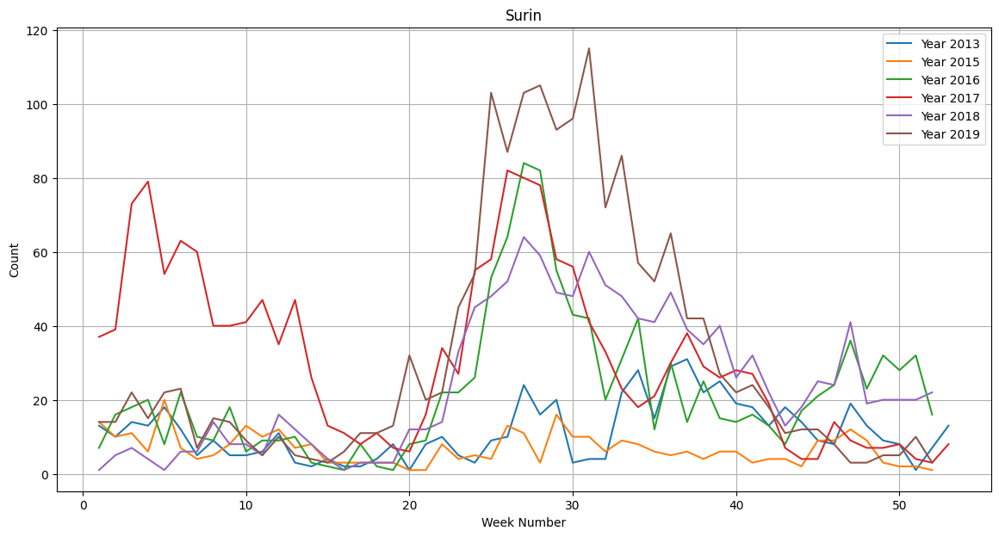

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154922"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.87 GB / 78.19 GB (59.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 10.0476


	-8.6964	 = Validation score   (-root_mean_squared_error)
	0.27s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-7.5112	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-8.0221	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-11.3126	 = Validation score   (-root_mean_squared_error)
	1.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-8.0676	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-10.6015	 = Validation score   (-root_mean_squared_error)
	2.46s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...


[1000]	valid_set's rmse: 8.66174


	-8.6264	 = Validation score   (-root_mean_squared_error)
	0.75s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'RandomForestMSE': 0.636, 'ExtraTreesMSE': 0.227, 'LightGBM': 0.091, 'NeuralNetTorch': 0.045}
	-7.3853	 = Validation score   (-root_mean_squared_error)
	0.01s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 7.04s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 508.0 rows/s (51 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20240803_154922")



RMSE: 9.651037522096336


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-9.186135,-9.186135,-8.022091,root_mean_squared_error,0.057038,0.046934,0.453189,0.057038,0.046934,0.453189,1,True,6
1,LightGBMLarge,-9.476087,-9.476087,-8.626412,root_mean_squared_error,0.015173,0.001958,0.748611,0.015173,0.001958,0.748611,1,True,10
2,WeightedEnsemble_L2,-9.651038,-9.651038,-7.385290,root_mean_squared_error,0.127707,0.100384,3.664540,0.004275,0.000389,0.014095,2,True,11
3,RandomForestMSE,-9.804972,-9.804972,-7.511232,root_mean_squared_error,0.057716,0.048975,0.467345,0.057716,0.048975,0.467345,1,True,5
4,NeuralNetTorch,-11.564988,-11.564988,-10.601491,root_mean_squared_error,0.005569,0.003239,2.456993,0.005569,0.003239,2.456993,1,True,9
5,XGBoost,-12.026089,-12.026089,-8.067558,root_mean_squared_error,0.009053,0.002682,0.134342,0.009053,0.002682,0.134342,1,True,8
6,LightGBM,-12.413858,-12.413858,-8.696407,root_mean_squared_error,0.003108,0.000847,0.272918,0.003108,0.000847,0.272918,1,True,4
7,NeuralNetFastAI,-14.289182,-14.289182,-11.312620,root_mean_squared_error,0.014338,0.008511,1.539806,0.014338,0.008511,1.539806,1,True,7
8,LightGBMXT,-14.475896,-14.475896,-10.014368,root_mean_squared_error,0.005506,0.001290,0.352284,0.005506,0.001290,0.352284,1,True,3
9,KNeighborsDist,-15.670857,-15.670857,-11.419601,root_mean_squared_error,0.014120,0.013724,0.004472,0.014120,0.013724,0.004472,1,True,2


In [26]:
#*
province = "Surin"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Surin = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Surin.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Surin.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<hr>

<br>

## Sisaket

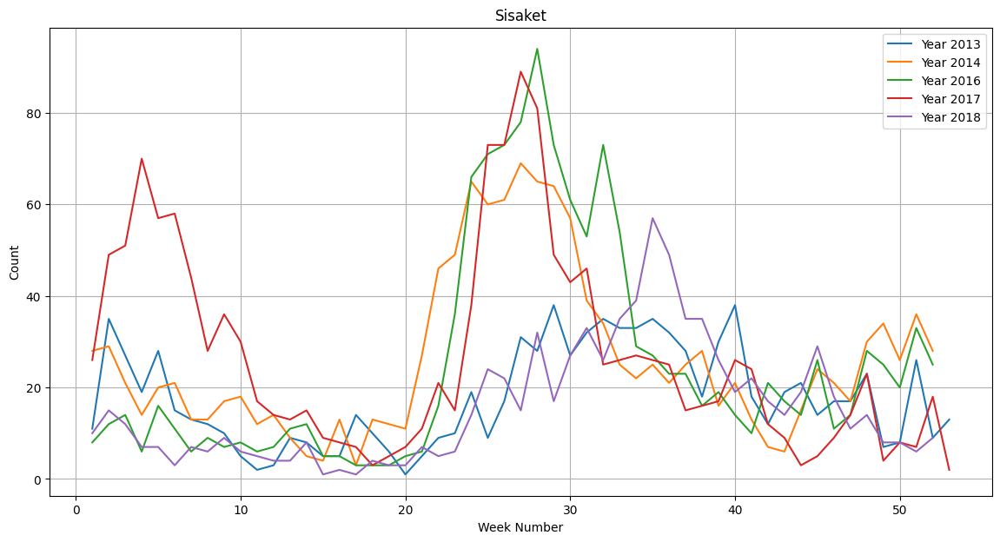

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154930"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.85 GB / 78.19 GB (59.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 16.2786
[2000]	valid_set's rmse: 16.2214
[3000]	valid_set's rmse: 16.1551


	-16.155	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-12.6989	 = Validation score   (-root_mean_squared_error)
	0.29s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-11.7904	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-9.4977	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.3996	 = Validation score   (-root_mean_squared_error)
	1.36s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-10.762	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-20.0685	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   r


RMSE: 7.1902850356626775


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-7.190285,-7.190285,-9.494163,root_mean_squared_error,0.068865,0.050441,0.642772,0.002612,0.000437,0.013844,2,True,11
1,ExtraTreesMSE,-7.223827,-7.223827,-9.497672,root_mean_squared_error,0.058231,0.047602,0.472767,0.058231,0.047602,0.472767,1,True,6
2,XGBoost,-7.954474,-7.954474,-10.761990,root_mean_squared_error,0.008021,0.002401,0.156161,0.008021,0.002401,0.156161,1,True,8
3,LightGBMLarge,-9.081270,-9.081270,-11.701320,root_mean_squared_error,0.008674,0.001158,0.409738,0.008674,0.001158,0.409738,1,True,10
4,RandomForestMSE,-9.101176,-9.101176,-11.790420,root_mean_squared_error,0.057464,0.049304,0.472739,0.057464,0.049304,0.472739,1,True,5
5,LightGBM,-9.743139,-9.743139,-12.698927,root_mean_squared_error,0.004461,0.001108,0.294858,0.004461,0.001108,0.294858,1,True,4
6,NeuralNetFastAI,-10.087986,-10.087986,-13.399637,root_mean_squared_error,0.013756,0.008359,1.359208,0.013756,0.008359,1.359208,1,True,7
7,KNeighborsDist,-12.072508,-12.072508,-15.305027,root_mean_squared_error,0.014015,0.013447,0.003798,0.014015,0.013447,0.003798,1,True,2
8,LightGBMXT,-12.484939,-12.484939,-16.155011,root_mean_squared_error,0.009763,0.001854,0.518042,0.009763,0.001854,0.518042,1,True,3
9,KNeighborsUnif,-12.555567,-12.555567,-15.357486,root_mean_squared_error,0.014846,0.014230,0.005038,0.014846,0.014230,0.005038,1,True,1


In [27]:
#*
province = "Sisaket"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2016,2017,2018] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Sisaket = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Sisaket.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Sisaket.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")

pvrecord[province] = rmse_value
leaderboard

<br>

## Ubon Ratchathani

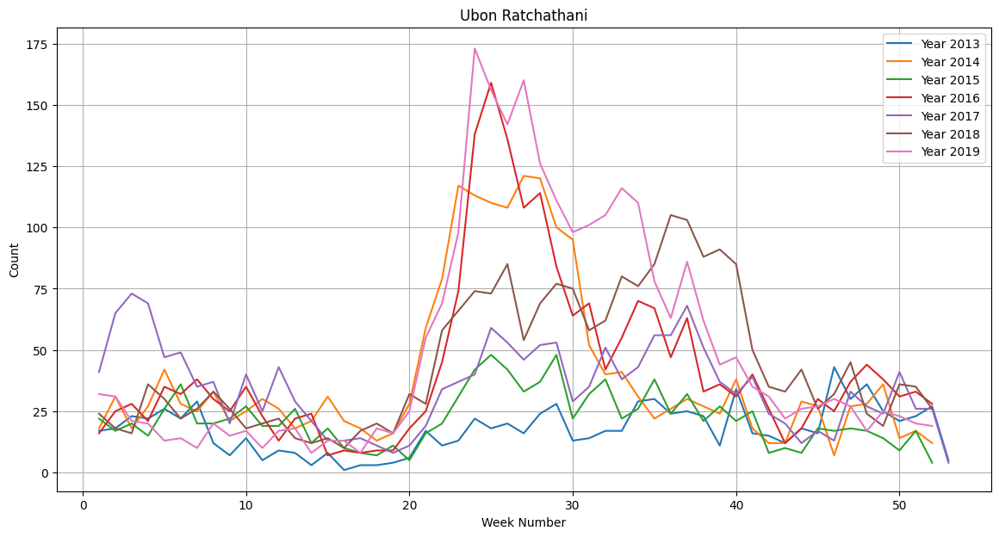

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154935"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.84 GB / 78.19 GB (59.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 10.9947399822635


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-10.518444,-10.518444,-7.711774,root_mean_squared_error,0.056625,0.048824,0.461681,0.056625,0.048824,0.461681,1,True,6
1,WeightedEnsemble_L2,-10.994740,-10.994740,-7.606074,root_mean_squared_error,0.068977,0.052499,0.860799,0.002697,0.000401,0.014979,2,True,11
2,RandomForestMSE,-11.522391,-11.522391,-8.979509,root_mean_squared_error,0.058914,0.047181,0.465209,0.058914,0.047181,0.465209,1,True,5
3,XGBoost,-13.929653,-13.929653,-8.787755,root_mean_squared_error,0.007976,0.002485,0.138261,0.007976,0.002485,0.138261,1,True,8
4,LightGBMLarge,-14.858801,-14.858801,-11.427091,root_mean_squared_error,0.010983,0.000991,0.344216,0.010983,0.000991,0.344216,1,True,10
5,LightGBM,-17.776773,-17.776773,-11.169340,root_mean_squared_error,0.001678,0.000790,0.245877,0.001678,0.000790,0.245877,1,True,4
6,LightGBMXT,-20.907788,-20.907788,-12.136399,root_mean_squared_error,0.002794,0.000934,0.277445,0.002794,0.000934,0.277445,1,True,3
7,NeuralNetTorch,-22.376516,-22.376516,-11.721009,root_mean_squared_error,0.005291,0.003388,2.879986,0.005291,0.003388,2.879986,1,True,9
8,KNeighborsDist,-22.430205,-22.430205,-12.313769,root_mean_squared_error,0.013876,0.013605,0.003968,0.013876,0.013605,0.003968,1,True,2
9,KNeighborsUnif,-23.003760,-23.003760,-12.727789,root_mean_squared_error,0.014709,0.013952,0.004900,0.014709,0.013952,0.004900,1,True,1


In [28]:
#*
province = "Ubon Ratchathani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Ubon_Ratchathani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Ubon_Ratchathani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Ubon_Ratchathani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Yasothon

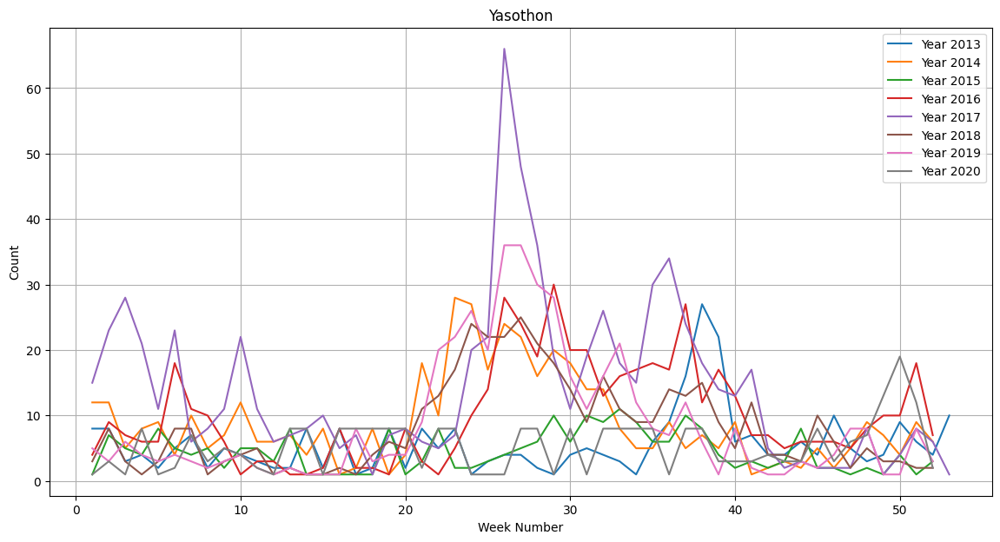

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154943"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.83 GB / 78.19 GB (59.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.83333
[2000]	valid_set's rmse: 5.6666
[3000]	valid_set's rmse: 5.59569
[4000]	valid_set's rmse: 5.58215
[5000]	valid_set's rmse: 5.57125


	-5.5656	 = Validation score   (-root_mean_squared_error)
	0.86s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 5.0906
[2000]	valid_set's rmse: 4.70465
[3000]	valid_set's rmse: 4.68136


	-4.6541	 = Validation score   (-root_mean_squared_error)
	0.78s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.4076	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.2426	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.8303	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.79	 = Validation score   (-root_mean_squared_error)
	0.22s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.0568	 = Validation score   (-root_mean_squared_error)
	2.99s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.1729	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   r


RMSE: 5.259409681477039


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.938344,-4.938344,-4.242585,root_mean_squared_error,0.058766,0.050455,0.462581,0.058766,0.050455,0.462581,1,True,6
1,WeightedEnsemble_L2,-5.259410,-5.259410,-4.069707,root_mean_squared_error,0.073652,0.052050,0.941025,0.002700,0.000435,0.014017,2,True,11
2,LightGBM,-5.370648,-5.370648,-4.654102,root_mean_squared_error,0.016386,0.006221,0.778549,0.016386,0.006221,0.778549,1,True,4
3,XGBoost,-5.448975,-5.448975,-4.790025,root_mean_squared_error,0.011040,0.002582,0.220307,0.011040,0.002582,0.220307,1,True,8
4,LightGBMLarge,-5.657774,-5.657774,-4.172875,root_mean_squared_error,0.012186,0.001160,0.464427,0.012186,0.001160,0.464427,1,True,10
5,RandomForestMSE,-5.920277,-5.920277,-4.407587,root_mean_squared_error,0.063028,0.045844,0.478928,0.063028,0.045844,0.478928,1,True,5
6,LightGBMXT,-6.529163,-6.529163,-5.565599,root_mean_squared_error,0.016259,0.009815,0.862681,0.016259,0.009815,0.862681,1,True,3
7,NeuralNetTorch,-6.546027,-6.546027,-6.056812,root_mean_squared_error,0.005592,0.003345,2.987242,0.005592,0.003345,2.987242,1,True,9
8,KNeighborsDist,-6.615198,-6.615198,-5.627407,root_mean_squared_error,0.014858,0.014760,0.005189,0.014858,0.014760,0.005189,1,True,2
9,KNeighborsUnif,-6.698969,-6.698969,-5.949338,root_mean_squared_error,0.014279,0.013798,0.004403,0.014279,0.013798,0.004403,1,True,1


In [29]:
#*
province = "Yasothon"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Yasothon = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Yasothon.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Yasothon.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Chaiyaphum

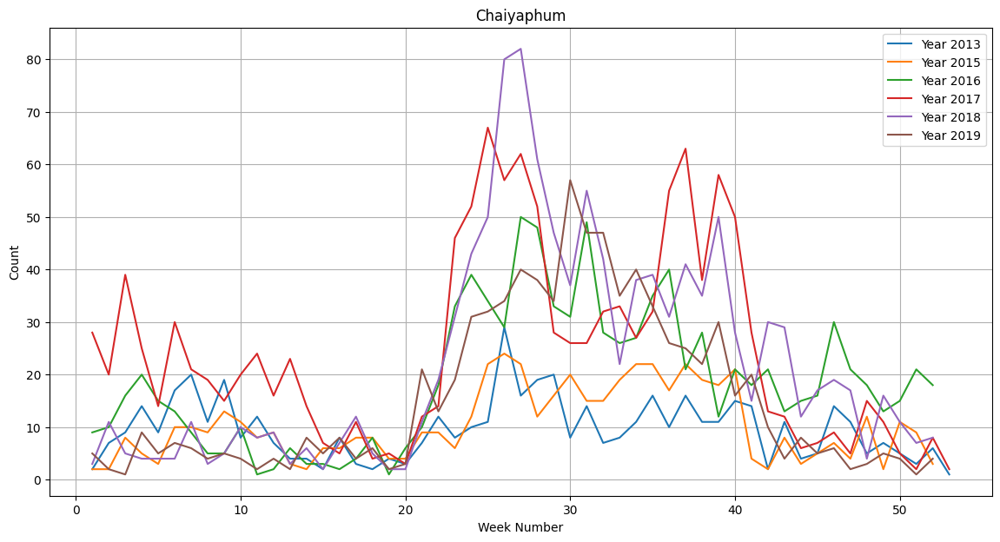

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154951"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.80 GB / 78.19 GB (59.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 9.23994
[2000]	valid_set's rmse: 8.98479


	-7.9511	 = Validation score   (-root_mean_squared_error)
	0.28s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-8.0913	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-8.4082	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.7884	 = Validation score   (-root_mean_squared_error)
	1.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-9.0249	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-10.3241	 = Validation score   (-root_mean_squared_error)
	2.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-8.3692	 = Validation score   (-root_mean_squared_error)
	0.35s	 = Training   


RMSE: 6.986343350571975


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.328898,-6.328898,-8.408175,root_mean_squared_error,0.057224,0.047399,0.450310,0.057224,0.047399,0.450310,1,True,6
1,WeightedEnsemble_L2,-6.986343,-6.986343,-7.625466,root_mean_squared_error,0.077985,0.056438,2.255032,0.002869,0.000385,0.014175,2,True,11
2,LightGBMXT,-7.189929,-7.189929,-8.988954,root_mean_squared_error,0.010052,0.001745,0.450294,0.010052,0.001745,0.450294,1,True,3
3,RandomForestMSE,-7.321717,-7.321717,-8.091291,root_mean_squared_error,0.056279,0.046786,0.458915,0.056279,0.046786,0.458915,1,True,5
4,LightGBMLarge,-7.475851,-7.475851,-8.369214,root_mean_squared_error,0.012522,0.001038,0.347647,0.012522,0.001038,0.347647,1,True,10
5,XGBoost,-7.482164,-7.482164,-9.024866,root_mean_squared_error,0.009660,0.002503,0.146313,0.009660,0.002503,0.146313,1,True,8
6,LightGBM,-7.640383,-7.640383,-7.951061,root_mean_squared_error,0.003195,0.001032,0.279304,0.003195,0.001032,0.279304,1,True,4
7,KNeighborsDist,-8.214345,-8.214345,-8.996030,root_mean_squared_error,0.014344,0.013841,0.003955,0.014344,0.013841,0.003955,1,True,2
8,KNeighborsUnif,-8.595643,-8.595643,-9.214864,root_mean_squared_error,0.014215,0.014979,0.004562,0.014215,0.014979,0.004562,1,True,1
9,NeuralNetFastAI,-8.782511,-8.782511,-9.788376,root_mean_squared_error,0.015642,0.008234,1.502637,0.015642,0.008234,1.502637,1,True,7


In [30]:
#*
province = "Chaiyaphum"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chaiyaphum = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chaiyaphum.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chaiyaphum.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Amnat Charoen

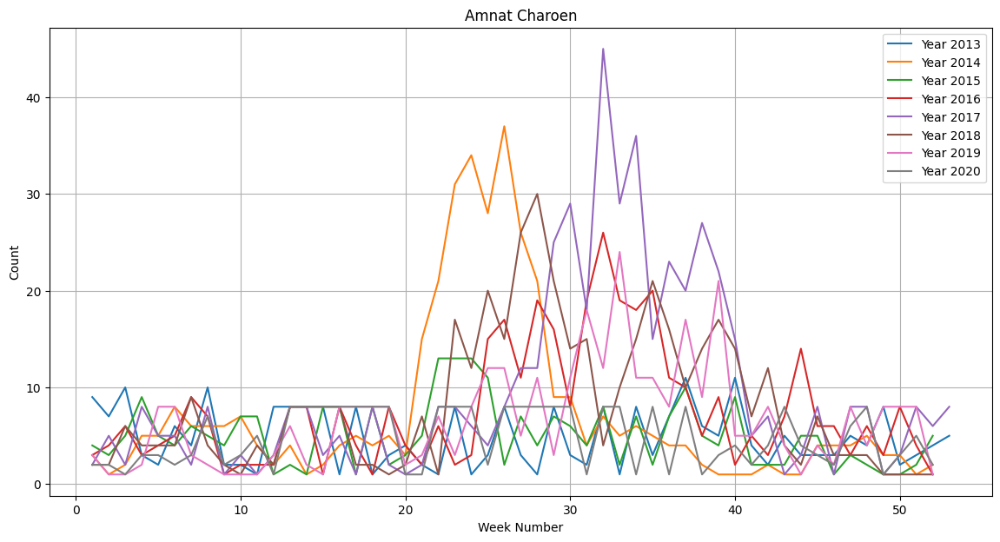

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_154958"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.79 GB / 78.19 GB (59.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 5.965155752019958


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-5.312824,-5.312824,-3.165856,root_mean_squared_error,0.056654,0.049486,0.469257,0.056654,0.049486,0.469257,1,True,6
1,RandomForestMSE,-5.759169,-5.759169,-3.485253,root_mean_squared_error,0.057816,0.047940,0.482399,0.057816,0.047940,0.482399,1,True,5
2,WeightedEnsemble_L2,-5.965156,-5.965156,-3.071590,root_mean_squared_error,0.065601,0.054113,3.335843,0.002597,0.000427,0.014384,2,True,11
3,XGBoost,-6.043448,-6.043448,-3.303509,root_mean_squared_error,0.007763,0.002811,0.152793,0.007763,0.002811,0.152793,1,True,8
4,LightGBMLarge,-6.257134,-6.257134,-3.459784,root_mean_squared_error,0.006455,0.000936,0.338681,0.006455,0.000936,0.338681,1,True,10
5,KNeighborsDist,-6.537578,-6.537578,-4.016016,root_mean_squared_error,0.014484,0.014019,0.004668,0.014484,0.014019,0.004668,1,True,2
6,KNeighborsUnif,-6.576401,-6.576401,-4.093752,root_mean_squared_error,0.014742,0.013821,0.005214,0.014742,0.013821,0.005214,1,True,1
7,NeuralNetFastAI,-6.925391,-6.925391,-3.413399,root_mean_squared_error,0.012208,0.005939,0.493978,0.012208,0.005939,0.493978,1,True,7
8,LightGBMXT,-6.942082,-6.942082,-3.559922,root_mean_squared_error,0.003384,0.001143,0.329712,0.003384,0.001143,0.329712,1,True,3
9,LightGBM,-7.004257,-7.004257,-3.336344,root_mean_squared_error,0.001348,0.000885,0.257156,0.001348,0.000885,0.257156,1,True,4


In [31]:
#*
province = "Amnat Charoen"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Amnat_Charoen = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Amnat_Charoen.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Amnat_Charoen.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Bueng Kan

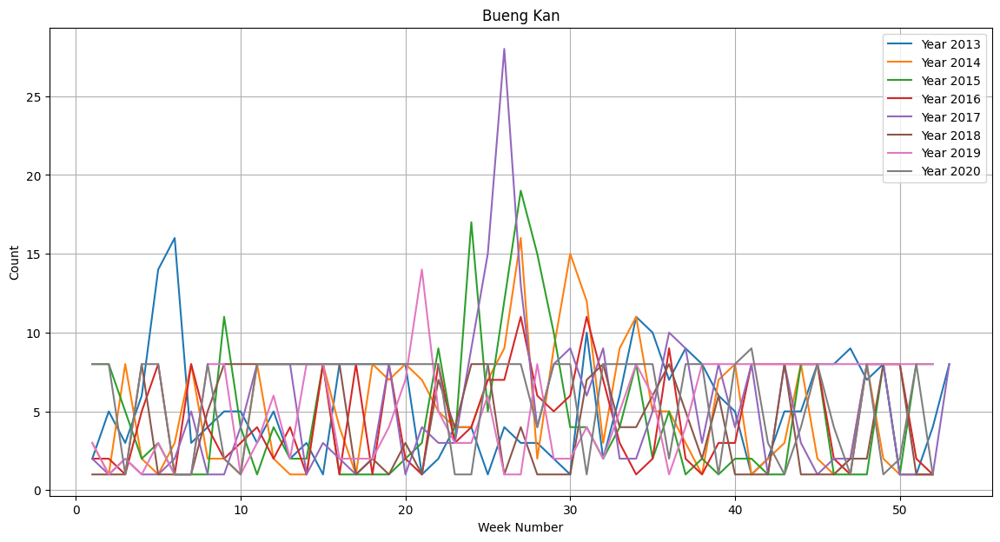

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155004"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.78 GB / 78.19 GB (59.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 3.795099026970346


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-3.615491,-3.615491,-3.448901,root_mean_squared_error,0.008805,0.003635,0.212253,0.008805,0.003635,0.212253,1,True,8
1,LightGBMXT,-3.648320,-3.648320,-3.458219,root_mean_squared_error,0.017909,0.010368,0.282891,0.017909,0.010368,0.282891,1,True,3
2,LightGBM,-3.689065,-3.689065,-3.500789,root_mean_squared_error,0.021461,0.000809,0.256984,0.021461,0.000809,0.256984,1,True,4
3,NeuralNetFastAI,-3.734030,-3.734030,-3.435681,root_mean_squared_error,0.015081,0.006423,0.451145,0.015081,0.006423,0.451145,1,True,7
4,WeightedEnsemble_L2,-3.795099,-3.795099,-3.136385,root_mean_squared_error,0.088788,0.070652,0.955068,0.002415,0.000391,0.014276,2,True,11
5,ExtraTreesMSE,-3.878643,-3.878643,-3.168999,root_mean_squared_error,0.057257,0.050257,0.485852,0.057257,0.050257,0.485852,1,True,6
6,NeuralNetTorch,-3.978636,-3.978636,-3.750059,root_mean_squared_error,0.006248,0.003800,0.791797,0.006248,0.003800,0.791797,1,True,9
7,KNeighborsDist,-4.017651,-4.017651,-3.286507,root_mean_squared_error,0.014036,0.013580,0.003795,0.014036,0.013580,0.003795,1,True,2
8,KNeighborsUnif,-4.042100,-4.042100,-3.324536,root_mean_squared_error,0.014489,0.014211,0.005113,0.014489,0.014211,0.005113,1,True,1
9,RandomForestMSE,-4.053215,-4.053215,-3.396693,root_mean_squared_error,0.058223,0.049868,0.488304,0.058223,0.049868,0.488304,1,True,5


In [32]:
#*
province = "Bueng Kan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Bueng_Kan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Bueng_Kan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Bueng_Kan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nong Bua Lamphu

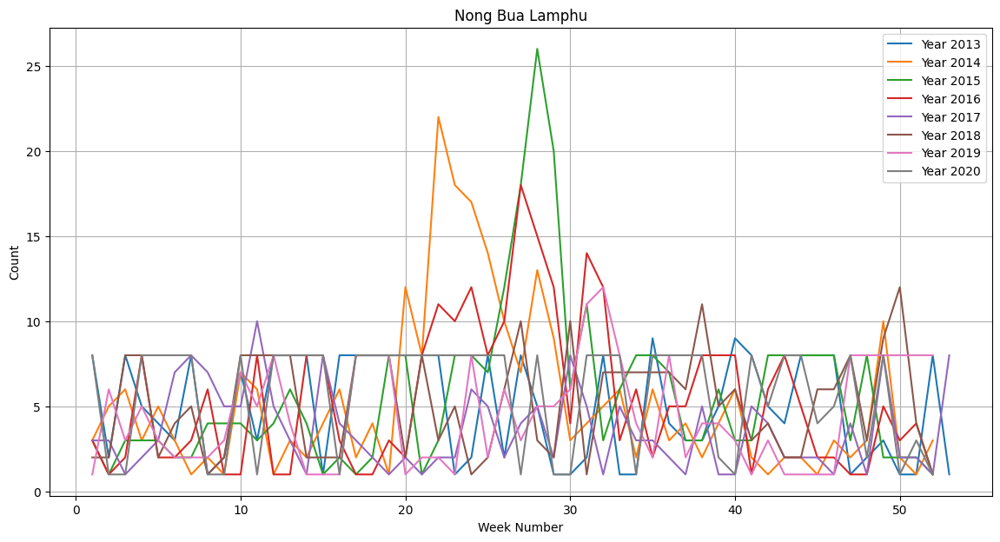

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155009"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.76 GB / 78.19 GB (59.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 3.67159
[2000]	valid_set's rmse: 3.63311
[3000]	valid_set's rmse: 3.63235


	-3.6257	 = Validation score   (-root_mean_squared_error)
	0.74s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[4000]	valid_set's rmse: 3.62701
[5000]	valid_set's rmse: 3.62718


	-3.6172	 = Validation score   (-root_mean_squared_error)
	0.3s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-3.3984	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.4052	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-3.8902	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.5078	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.0324	 = Validation score   (-root_mean_squared_error)
	0.56s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.479	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   ru


RMSE: 3.327853211591088


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.150246,-3.150246,-3.405235,root_mean_squared_error,0.058725,0.046962,0.468619,0.058725,0.046962,0.468619,1,True,6
1,LightGBM,-3.252673,-3.252673,-3.617162,root_mean_squared_error,0.010168,0.001016,0.296499,0.010168,0.001016,0.296499,1,True,4
2,LightGBMXT,-3.285481,-3.285481,-3.625672,root_mean_squared_error,0.020165,0.002838,0.743197,0.020165,0.002838,0.743197,1,True,3
3,NeuralNetFastAI,-3.307649,-3.307649,-3.890159,root_mean_squared_error,0.012302,0.006026,0.478432,0.012302,0.006026,0.478432,1,True,7
4,WeightedEnsemble_L2,-3.327853,-3.327853,-3.376304,root_mean_squared_error,0.136254,0.096760,1.418243,0.003032,0.000428,0.013972,2,True,11
5,RandomForestMSE,-3.472255,-3.472255,-3.398359,root_mean_squared_error,0.062478,0.048211,0.480989,0.062478,0.048211,0.480989,1,True,5
6,XGBoost,-3.480548,-3.480548,-3.507833,root_mean_squared_error,0.008571,0.002501,0.158141,0.008571,0.002501,0.158141,1,True,8
7,KNeighborsUnif,-3.536881,-3.536881,-3.576791,root_mean_squared_error,0.014499,0.014028,0.005188,0.014499,0.014028,0.005188,1,True,1
8,KNeighborsDist,-3.593223,-3.593223,-3.553304,root_mean_squared_error,0.014091,0.013806,0.004041,0.014091,0.013806,0.004041,1,True,2
9,LightGBMLarge,-3.602868,-3.602868,-3.479027,root_mean_squared_error,0.012018,0.001159,0.454663,0.012018,0.001159,0.454663,1,True,10


In [33]:
#*
province = "Nong Bua Lamphu"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nong_Bua_Lamphu = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nong_Bua_Lamphu.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nong_Bua_Lamphu.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

## Khon Kaen

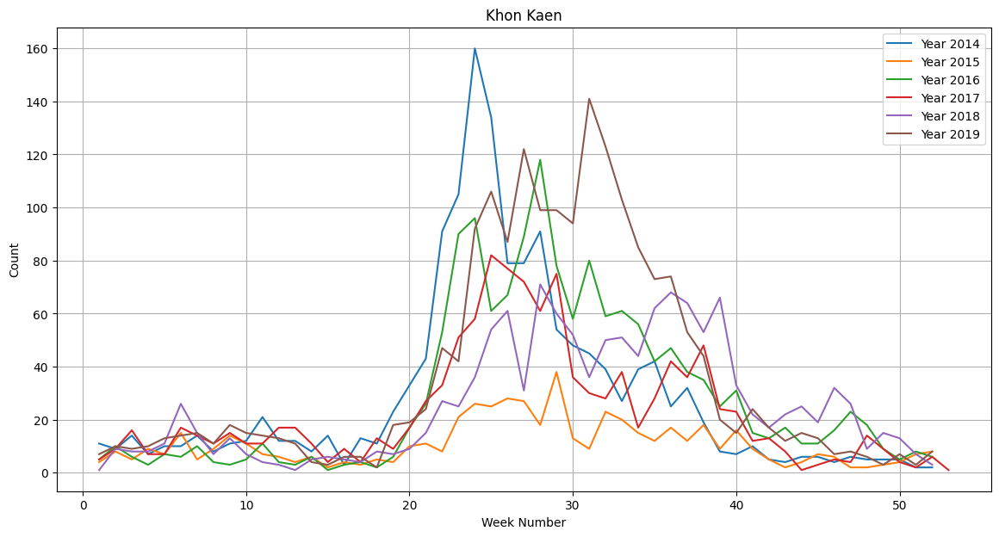

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155014"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.47 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.75 GB / 78.19 GB (59.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 18.1605
[1000]	valid_set's rmse: 16.6155
[2000]	valid_set's rmse: 16.2511
[3000]	valid_set's rmse: 15.8629
[4000]	valid_set's rmse: 15.71
[5000]	valid_set's rmse: 15.4126
[6000]	valid_set's rmse: 15.3546
[7000]	valid_set's rmse: 15.2581
[8000]	valid_set's rmse: 15.2842
[9000]	valid_set's rmse: 15.3239


	-15.2333	 = Validation score   (-root_mean_squared_error)
	1.41s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-14.7086	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-13.506	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-17.8914	 = Validation score   (-root_mean_squared_error)
	1.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-14.1905	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-13.5202	 = Validation score   (-root_mean_squared_error)
	3.29s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-13.4365	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Traini


RMSE: 9.085570610846142


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-9.085571,-9.085571,-12.963750,root_mean_squared_error,0.080974,0.052033,4.236998,0.003046,0.000399,0.014152,2,True,11
1,ExtraTreesMSE,-9.739806,-9.739806,-13.506000,root_mean_squared_error,0.060935,0.047157,0.459809,0.060935,0.047157,0.459809,1,True,6
2,NeuralNetTorch,-10.285534,-10.285534,-13.520211,root_mean_squared_error,0.004907,0.003310,3.292903,0.004907,0.003310,3.292903,1,True,9
3,RandomForestMSE,-10.888784,-10.888784,-14.708585,root_mean_squared_error,0.060190,0.048863,0.464639,0.060190,0.048863,0.464639,1,True,5
4,XGBoost,-11.359318,-11.359318,-14.190485,root_mean_squared_error,0.008293,0.002527,0.156265,0.008293,0.002527,0.156265,1,True,8
5,LightGBMLarge,-11.518754,-11.518754,-13.436481,root_mean_squared_error,0.012086,0.001167,0.470134,0.012086,0.001167,0.470134,1,True,10
6,LightGBM,-14.452258,-14.452258,-15.233337,root_mean_squared_error,0.027585,0.004021,1.408515,0.027585,0.004021,1.408515,1,True,4
7,LightGBMXT,-15.170516,-15.170516,-18.156002,root_mean_squared_error,0.003898,0.001079,0.329311,0.003898,0.001079,0.329311,1,True,3
8,NeuralNetFastAI,-16.441259,-16.441259,-17.891397,root_mean_squared_error,0.014483,0.008284,1.501335,0.014483,0.008284,1.501335,1,True,7
9,KNeighborsDist,-18.419700,-18.419700,-18.657433,root_mean_squared_error,0.013816,0.013882,0.004162,0.013816,0.013882,0.004162,1,True,2


In [34]:
## Khon Kaen

#*
province = "Khon Kaen"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Khon_Kaen = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Khon_Kaen.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Khon_Kaen.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Udon Thani

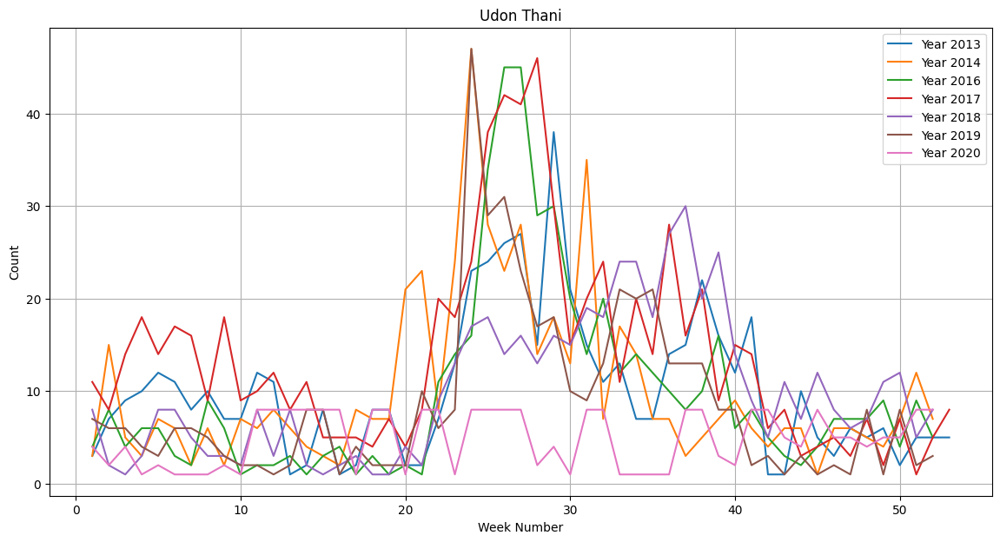

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155023"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.73 GB / 78.19 GB (59.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.53478
[2000]	valid_set's rmse: 5.31435
[3000]	valid_set's rmse: 5.16872
[4000]	valid_set's rmse: 5.1227
[5000]	valid_set's rmse: 5.09238
[6000]	valid_set's rmse: 5.04801
[7000]	valid_set's rmse: 5.05645
[8000]	valid_set's rmse: 5.07594


	-5.0561	 = Validation score   (-root_mean_squared_error)
	1.03s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-4.5095	 = Validation score   (-root_mean_squared_error)
	0.31s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.606	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.6573	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.0955	 = Validation score   (-root_mean_squared_error)
	1.7s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.9286	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.8229	 = Validation score   (-root_mean_squared_error)
	2.09s	 = Training   runtime


RMSE: 5.506419662001304


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-5.434509,-5.434509,-4.657280,root_mean_squared_error,0.056926,0.046529,0.462276,0.056926,0.046529,0.462276,1,True,6
1,WeightedEnsemble_L2,-5.506420,-5.506420,-4.423631,root_mean_squared_error,0.036676,0.002807,0.686825,0.002303,0.000468,0.015454,2,True,11
2,LightGBM,-5.579922,-5.579922,-4.509465,root_mean_squared_error,0.016841,0.001055,0.310908,0.016841,0.001055,0.310908,1,True,4
3,LightGBMLarge,-5.583479,-5.583479,-4.445379,root_mean_squared_error,0.017532,0.001284,0.360463,0.017532,0.001284,0.360463,1,True,10
4,NeuralNetTorch,-5.734270,-5.734270,-5.822888,root_mean_squared_error,0.005109,0.003309,2.085141,0.005109,0.003309,2.085141,1,True,9
5,RandomForestMSE,-5.851805,-5.851805,-4.605968,root_mean_squared_error,0.058411,0.048535,0.469270,0.058411,0.048535,0.469270,1,True,5
6,XGBoost,-5.953644,-5.953644,-4.928564,root_mean_squared_error,0.008100,0.002182,0.133987,0.008100,0.002182,0.133987,1,True,8
7,LightGBMXT,-6.181519,-6.181519,-5.056107,root_mean_squared_error,0.033619,0.003457,1.025131,0.033619,0.003457,1.025131,1,True,3
8,KNeighborsUnif,-6.339793,-6.339793,-5.422302,root_mean_squared_error,0.014506,0.014804,0.005323,0.014506,0.014804,0.005323,1,True,1
9,KNeighborsDist,-6.470171,-6.470171,-5.495873,root_mean_squared_error,0.015268,0.013613,0.004227,0.015268,0.013613,0.004227,1,True,2


In [35]:
#*
province = "Udon Thani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Udon_Thani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Udon_Thani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Udon_Thani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Loei

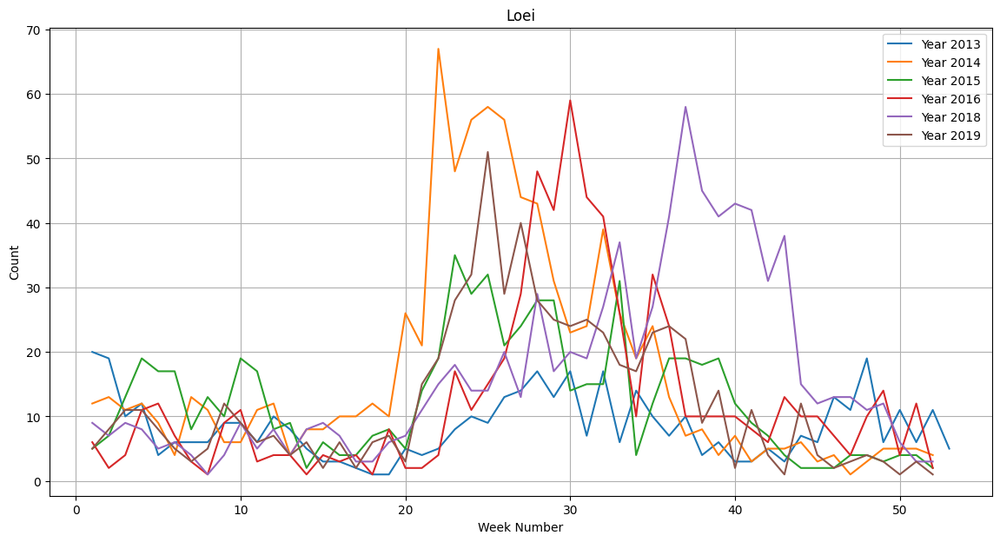

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155031"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.49 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.71 GB / 78.19 GB (59.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 6.69834


	-6.243	 = Validation score   (-root_mean_squared_error)
	0.28s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.2824	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.3794	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
No improvement since epoch 9: early stopping
	-6.35	 = Validation score   (-root_mean_squared_error)
	1.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.1788	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.0288	 = Validation score   (-root_mean_squared_error)
	2.22s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.3441	 = Validation score   (-root


RMSE: 5.68791236110198


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-5.463859,-5.463859,-4.344094,root_mean_squared_error,0.013076,0.001066,0.380087,0.013076,0.001066,0.380087,1,True,10
1,WeightedEnsemble_L2,-5.687912,-5.687912,-4.310990,root_mean_squared_error,0.038873,0.012343,2.028313,0.002962,0.000421,0.014220,2,True,11
2,RandomForestMSE,-6.327856,-6.327856,-5.282404,root_mean_squared_error,0.057754,0.046618,0.479496,0.057754,0.046618,0.479496,1,True,5
3,ExtraTreesMSE,-6.365564,-6.365564,-5.379360,root_mean_squared_error,0.051114,0.047864,0.462330,0.051114,0.047864,0.462330,1,True,6
4,XGBoost,-7.201204,-7.201204,-5.178820,root_mean_squared_error,0.007945,0.002437,0.135441,0.007945,0.002437,0.135441,1,True,8
5,LightGBM,-8.969374,-8.969374,-6.242980,root_mean_squared_error,0.002688,0.010153,0.283215,0.002688,0.010153,0.283215,1,True,4
6,LightGBMXT,-9.970866,-9.970866,-6.666954,root_mean_squared_error,0.010818,0.003905,0.350837,0.010818,0.003905,0.350837,1,True,3
7,KNeighborsDist,-10.088123,-10.088123,-7.270618,root_mean_squared_error,0.014046,0.013899,0.004377,0.014046,0.013899,0.004377,1,True,2
8,NeuralNetTorch,-10.341241,-10.341241,-6.028776,root_mean_squared_error,0.005010,0.003293,2.217324,0.005010,0.003293,2.217324,1,True,9
9,KNeighborsUnif,-10.679873,-10.679873,-7.319781,root_mean_squared_error,0.014621,0.014316,0.004633,0.014621,0.014316,0.004633,1,True,1


In [36]:
#*
province = "Loei"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Loei = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Loei.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Loei.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nong Khai

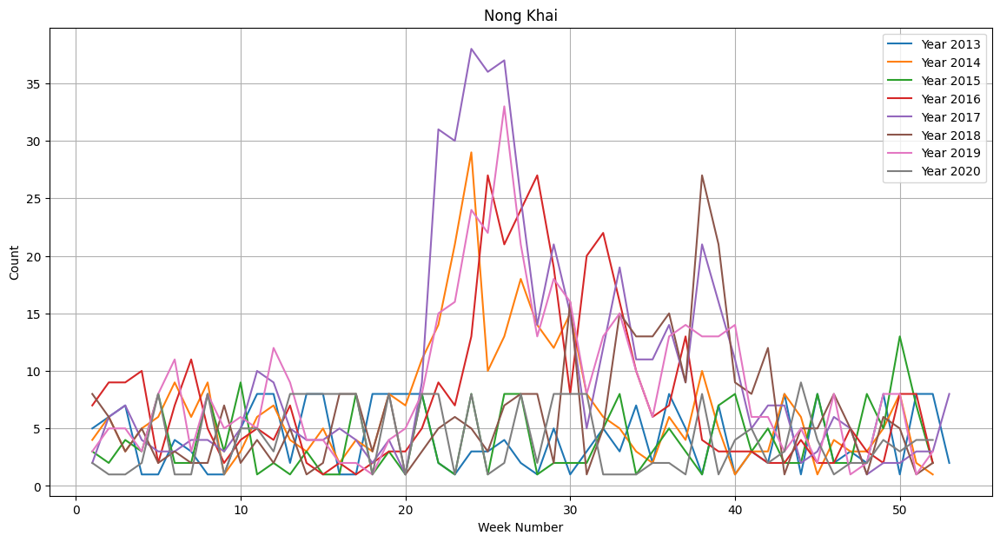

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155038"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.49 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.70 GB / 78.19 GB (59.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.52056
[2000]	valid_set's rmse: 4.35899
[3000]	valid_set's rmse: 4.27462
[4000]	valid_set's rmse: 4.2249
[5000]	valid_set's rmse: 4.20282
[6000]	valid_set's rmse: 4.23797


	-4.2057	 = Validation score   (-root_mean_squared_error)
	0.87s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-3.8166	 = Validation score   (-root_mean_squared_error)
	0.37s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 3.82596


	-3.6448	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.3044	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.8277	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.5691	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.3079	 = Validation score   (-root_mean_squared_error)
	7.02s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.582	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'NeuralNetTorch': 0.524, 'XGBoost': 0.286, 'ExtraTreesMS


RMSE: 4.221642355429842


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.981217,-3.981217,-3.304442,root_mean_squared_error,0.058289,0.046073,0.467042,0.058289,0.046073,0.467042,1,True,6
1,WeightedEnsemble_L2,-4.221642,-4.221642,-3.097319,root_mean_squared_error,0.076756,0.052411,7.646458,0.002703,0.000381,0.014279,2,True,11
2,RandomForestMSE,-4.290057,-4.290057,-3.644782,root_mean_squared_error,0.058652,0.050551,0.466208,0.058652,0.050551,0.466208,1,True,5
3,XGBoost,-4.296394,-4.296394,-3.569052,root_mean_squared_error,0.009804,0.002566,0.148178,0.009804,0.002566,0.148178,1,True,8
4,NeuralNetTorch,-4.558800,-4.558800,-3.307911,root_mean_squared_error,0.005959,0.003391,7.016959,0.005959,0.003391,7.016959,1,True,9
5,LightGBMLarge,-4.574273,-4.574273,-3.582047,root_mean_squared_error,0.007343,0.001045,0.384445,0.007343,0.001045,0.384445,1,True,10
6,LightGBM,-4.831486,-4.831486,-3.816578,root_mean_squared_error,0.006956,0.001391,0.368218,0.006956,0.001391,0.368218,1,True,4
7,LightGBMXT,-5.088345,-5.088345,-4.205671,root_mean_squared_error,0.017722,0.003206,0.874732,0.017722,0.003206,0.874732,1,True,3
8,NeuralNetFastAI,-5.304318,-5.304318,-4.827728,root_mean_squared_error,0.011855,0.006197,0.486476,0.011855,0.006197,0.486476,1,True,7
9,KNeighborsUnif,-5.320714,-5.320714,-4.370252,root_mean_squared_error,0.014749,0.014107,0.004727,0.014749,0.014107,0.004727,1,True,1


In [37]:
#*
province = "Nong Khai"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nong_Khai = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nong_Khai.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nong_Khai.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Maha Sarakham

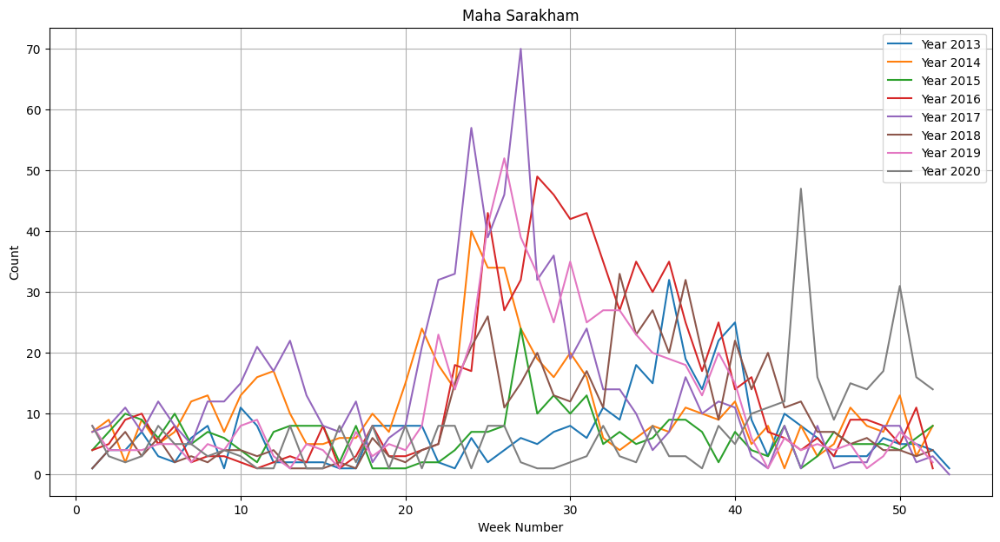

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155050"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.49 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.68 GB / 78.19 GB (59.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.80234
[2000]	valid_set's rmse: 8.61069


	-6.55	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 6.58109


	-5.9642	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.5832	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.665	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-6.8202	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.8289	 = Validation score   (-root_mean_squared_error)
	4.35s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-6.5442	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'RandomForestMSE': 0.96, 'NeuralNetTorch': 0.04}
	-5.962


RMSE: 7.971294758469244


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-7.087458,-7.087458,-6.583184,root_mean_squared_error,0.057495,0.046910,0.473375,0.057495,0.046910,0.473375,1,True,6
1,LightGBMLarge,-7.922302,-7.922302,-6.544223,root_mean_squared_error,0.011390,0.006388,0.400429,0.011390,0.006388,0.400429,1,True,10
2,WeightedEnsemble_L2,-7.971295,-7.971295,-5.962683,root_mean_squared_error,0.068008,0.049960,4.826821,0.002393,0.000479,0.014549,2,True,11
3,RandomForestMSE,-7.996666,-7.996666,-5.964168,root_mean_squared_error,0.060553,0.046263,0.463783,0.060553,0.046263,0.463783,1,True,5
4,LightGBM,-8.026756,-8.026756,-6.550035,root_mean_squared_error,0.005532,0.001369,0.384160,0.005532,0.001369,0.384160,1,True,4
5,NeuralNetTorch,-8.617503,-8.617503,-6.828859,root_mean_squared_error,0.005063,0.003217,4.348490,0.005063,0.003217,4.348490,1,True,9
6,XGBoost,-8.630674,-8.630674,-6.820174,root_mean_squared_error,0.007895,0.002395,0.140954,0.007895,0.002395,0.140954,1,True,8
7,LightGBMXT,-8.836634,-8.836634,-8.610556,root_mean_squared_error,0.007508,0.001962,0.464741,0.007508,0.001962,0.464741,1,True,3
8,KNeighborsDist,-9.085073,-9.085073,-9.226187,root_mean_squared_error,0.014049,0.014081,0.004118,0.014049,0.014081,0.004118,1,True,2
9,KNeighborsUnif,-9.117670,-9.117670,-9.491331,root_mean_squared_error,0.014235,0.014004,0.004200,0.014235,0.014004,0.004200,1,True,1


In [38]:
#*
province = "Maha Sarakham"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Maha_Sarakham = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Maha_Sarakham.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Maha_Sarakham.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Roi Et

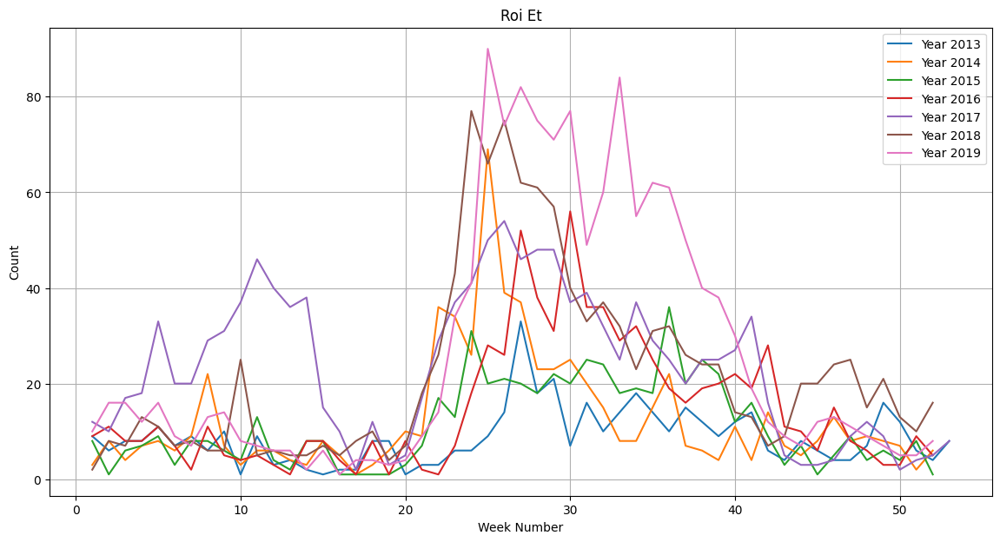

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155058"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.48 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.67 GB / 78.19 GB (59.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 7.77593
[2000]	valid_set's rmse: 7.53231
[3000]	valid_set's rmse: 7.4117
[4000]	valid_set's rmse: 7.38274
[5000]	valid_set's rmse: 7.39501


	-7.394	 = Validation score   (-root_mean_squared_error)
	0.85s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 6.5981
[2000]	valid_set's rmse: 6.37433


	-6.2969	 = Validation score   (-root_mean_squared_error)
	0.68s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 6.36885


	-6.4212	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.0187	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.2776	 = Validation score   (-root_mean_squared_error)
	1.72s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-6.7026	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.4216	 = Validation score   (-root_mean_squared_error)
	3.88s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-6.3133	 = Validation score   (-root_mean_squared_error)
	0.41s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.292, 'NeuralNetTorch': 0.292, 'Ligh


RMSE: 8.705422231574858


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-8.604535,-8.604535,-6.018709,root_mean_squared_error,0.060248,0.046440,0.481664,0.060248,0.046440,0.481664,1,True,6
1,LightGBMLarge,-8.610122,-8.610122,-6.313252,root_mean_squared_error,0.020738,0.010301,0.406660,0.020738,0.010301,0.406660,1,True,10
2,WeightedEnsemble_L2,-8.705422,-8.705422,-5.772476,root_mean_squared_error,0.130962,0.071303,5.609308,0.003592,0.000443,0.014575,2,True,11
3,XGBoost,-8.821230,-8.821230,-6.702581,root_mean_squared_error,0.009819,0.002513,0.144405,0.009819,0.002513,0.144405,1,True,8
4,RandomForestMSE,-9.060862,-9.060862,-6.421197,root_mean_squared_error,0.057585,0.048254,0.476898,0.057585,0.048254,0.476898,1,True,5
5,NeuralNetTorch,-9.531320,-9.531320,-6.421558,root_mean_squared_error,0.005804,0.003422,3.881737,0.005804,0.003422,3.881737,1,True,9
6,LightGBM,-9.839230,-9.839230,-6.296866,root_mean_squared_error,0.030760,0.008184,0.680267,0.030760,0.008184,0.680267,1,True,4
7,KNeighborsDist,-10.965016,-10.965016,-7.446525,root_mean_squared_error,0.014693,0.014033,0.004855,0.014693,0.014033,0.004855,1,True,2
8,LightGBMXT,-10.973559,-10.973559,-7.393954,root_mean_squared_error,0.030746,0.008909,0.850259,0.030746,0.008909,0.850259,1,True,3
9,KNeighborsUnif,-11.014855,-11.014855,-7.860694,root_mean_squared_error,0.014000,0.013936,0.004714,0.014000,0.013936,0.004714,1,True,1


In [39]:
#*
province = "Roi Et"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Roi_Et = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Roi_Et.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Roi_Et.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Kalasin

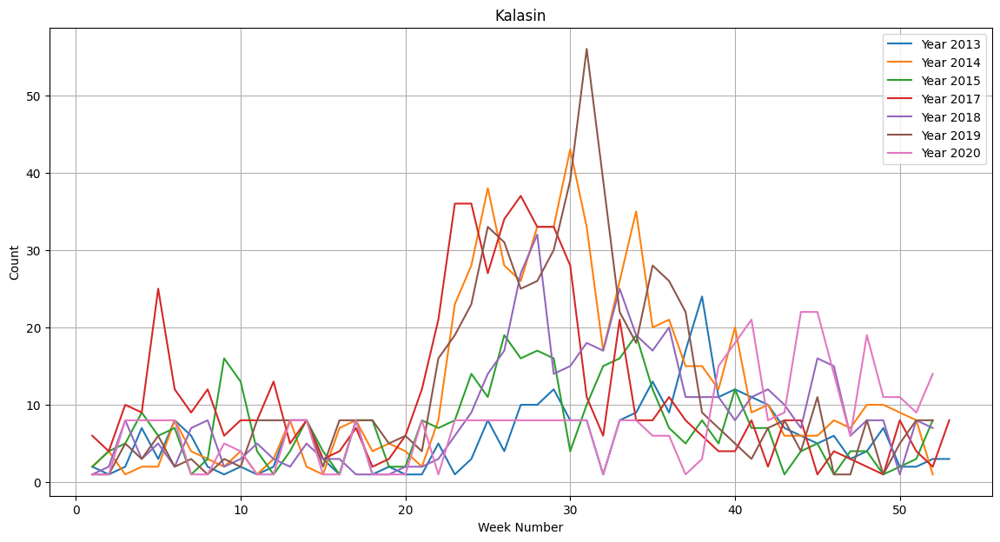

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155108"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.65 GB / 78.19 GB (59.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.67692
[2000]	valid_set's rmse: 4.6588


	-3.915	 = Validation score   (-root_mean_squared_error)
	0.32s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-3.8085	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.7907	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.9988	 = Validation score   (-root_mean_squared_error)
	1.71s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.642	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.9734	 = Validation score   (-root_mean_squared_error)
	4.29s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.8582	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   ru


RMSE: 5.883256080259316


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForestMSE,-5.089222,-5.089222,-3.808512,root_mean_squared_error,0.060325,0.046227,0.454136,0.060325,0.046227,0.454136,1,True,5
1,LightGBMLarge,-5.813234,-5.813234,-3.858233,root_mean_squared_error,0.007058,0.000971,0.378788,0.007058,0.000971,0.378788,1,True,10
2,ExtraTreesMSE,-5.833797,-5.833797,-3.790670,root_mean_squared_error,0.056969,0.047437,0.454351,0.056969,0.047437,0.454351,1,True,6
3,WeightedEnsemble_L2,-5.883256,-5.883256,-3.442980,root_mean_squared_error,0.096022,0.068398,5.223440,0.003543,0.000403,0.014769,2,True,11
4,XGBoost,-5.914271,-5.914271,-3.641983,root_mean_squared_error,0.008153,0.002426,0.142600,0.008153,0.002426,0.142600,1,True,8
5,LightGBM,-6.669061,-6.669061,-3.914978,root_mean_squared_error,0.004300,0.001075,0.318257,0.004300,0.001075,0.318257,1,True,4
6,NeuralNetTorch,-6.679138,-6.679138,-3.973367,root_mean_squared_error,0.005277,0.003303,4.289837,0.005277,0.003303,4.289837,1,True,9
7,LightGBMXT,-7.952091,-7.952091,-4.652545,root_mean_squared_error,0.010936,0.001617,0.477022,0.010936,0.001617,0.477022,1,True,3
8,KNeighborsDist,-8.217684,-8.217684,-4.828608,root_mean_squared_error,0.013956,0.014494,0.004636,0.013956,0.014494,0.004636,1,True,2
9,KNeighborsUnif,-8.432306,-8.432306,-4.851769,root_mean_squared_error,0.014423,0.014964,0.003842,0.014423,0.014964,0.003842,1,True,1


In [40]:
#*
province = "Kalasin"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Kalasin = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Kalasin.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Kalasin.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Sakon Nakhon

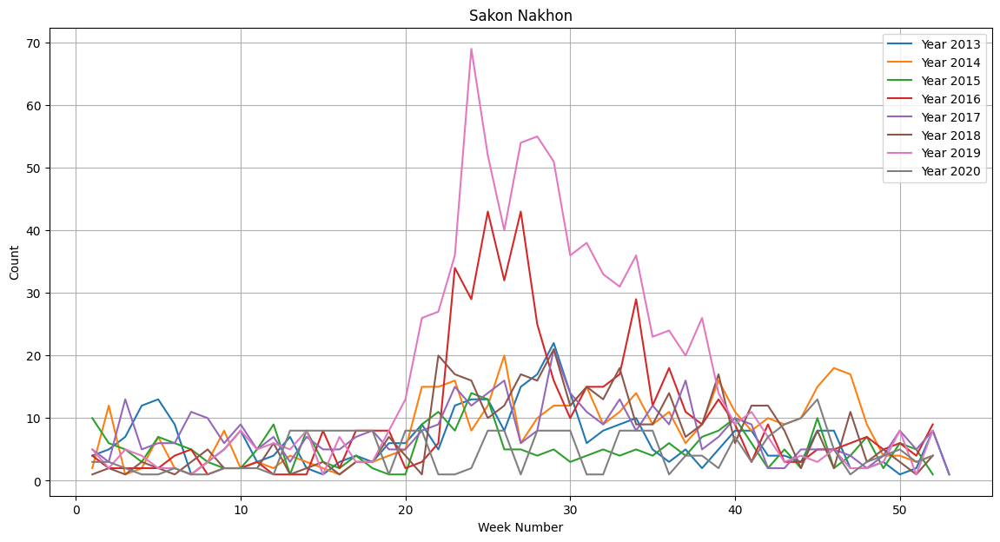

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155118"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.63 GB / 78.19 GB (59.6%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.20779
[2000]	valid_set's rmse: 8.15939
[1000]	valid_set's rmse: 6.00088
[2000]	valid_set's rmse: 5.59406


	-5.5474	 = Validation score   (-root_mean_squared_error)
	0.77s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 5.54765


	-4.322	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.0103	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.1867	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.3248	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.1562	 = Validation score   (-root_mean_squared_error)
	9.91s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.5421	 = Validation score   (-root_mean_squared_error)
	0.42s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'NeuralNetTorch': 0.591, 'XGBoost': 0.364, 'RandomForest


RMSE: 5.173248790364447


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForestMSE,-5.154405,-5.154405,-4.321960,root_mean_squared_error,0.058698,0.048194,0.494152,0.058698,0.048194,0.494152,1,True,5
1,WeightedEnsemble_L2,-5.173249,-5.173249,-4.023904,root_mean_squared_error,0.075271,0.054780,10.564831,0.002767,0.000416,0.014243,2,True,11
2,XGBoost,-5.249799,-5.249799,-4.324790,root_mean_squared_error,0.008494,0.002358,0.149436,0.008494,0.002358,0.149436,1,True,8
3,NeuralNetTorch,-5.364287,-5.364287,-4.156208,root_mean_squared_error,0.005313,0.003812,9.907000,0.005313,0.003812,9.907000,1,True,9
4,LightGBMLarge,-5.490241,-5.490241,-4.542129,root_mean_squared_error,0.010101,0.000988,0.415616,0.010101,0.000988,0.415616,1,True,10
5,ExtraTreesMSE,-5.843880,-5.843880,-5.010342,root_mean_squared_error,0.061536,0.047258,0.458478,0.061536,0.047258,0.458478,1,True,6
6,LightGBM,-6.017789,-6.017789,-5.547411,root_mean_squared_error,0.014126,0.006364,0.770733,0.014126,0.006364,0.770733,1,True,4
7,KNeighborsDist,-8.424447,-8.424447,-8.993069,root_mean_squared_error,0.013942,0.013800,0.003724,0.013942,0.013800,0.003724,1,True,2
8,KNeighborsUnif,-8.530171,-8.530171,-9.022360,root_mean_squared_error,0.014287,0.014232,0.004143,0.014287,0.014232,0.004143,1,True,1
9,LightGBMXT,-8.542480,-8.542480,-8.161613,root_mean_squared_error,0.006630,0.014605,0.425325,0.006630,0.014605,0.425325,1,True,3


In [41]:

#*
province = "Sakon Nakhon"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Sakon_Nakhon = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Sakon_Nakhon.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Sakon_Nakhon.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Phanom

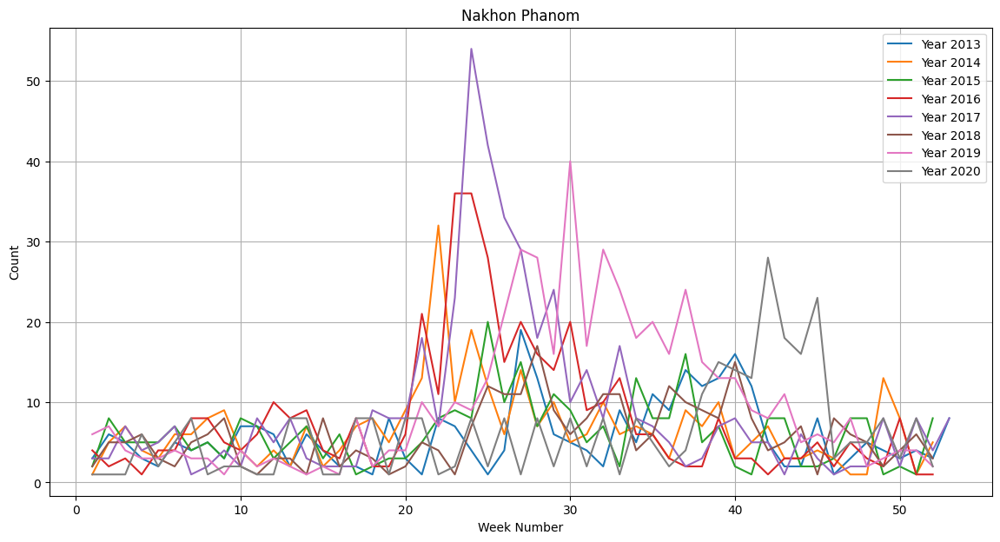

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155132"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.51 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.62 GB / 78.19 GB (59.6%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.61863
[2000]	valid_set's rmse: 4.59525


	-3.8851	 = Validation score   (-root_mean_squared_error)
	0.34s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.3786	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.1233	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.8166	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.3983	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.659	 = Validation score   (-root_mean_squared_error)
	8.01s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.1169	 = Validation score   (-root_mean_squared_error)
	0.42s	 = Training   r


RMSE: 4.029618858229757


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-4.029619,-4.029619,-3.615766,root_mean_squared_error,0.012277,0.005443,8.369200,0.002449,0.000387,0.013958,2,True,11
1,NeuralNetTorch,-4.137705,-4.137705,-3.659022,root_mean_squared_error,0.005224,0.003865,8.010281,0.005224,0.003865,8.010281,1,True,9
2,ExtraTreesMSE,-4.194274,-4.194274,-4.123256,root_mean_squared_error,0.058557,0.047326,0.455388,0.058557,0.047326,0.455388,1,True,6
3,LightGBMLarge,-4.291763,-4.291763,-4.116908,root_mean_squared_error,0.013214,0.000997,0.417043,0.013214,0.000997,0.417043,1,True,10
4,RandomForestMSE,-4.338695,-4.338695,-4.378556,root_mean_squared_error,0.059376,0.048281,0.460103,0.059376,0.048281,0.460103,1,True,5
5,XGBoost,-4.452295,-4.452295,-4.398311,root_mean_squared_error,0.008281,0.002287,0.142158,0.008281,0.002287,0.142158,1,True,8
6,LightGBM,-4.760537,-4.760537,-3.885113,root_mean_squared_error,0.004604,0.001192,0.344961,0.004604,0.001192,0.344961,1,True,4
7,KNeighborsDist,-4.906768,-4.906768,-4.967393,root_mean_squared_error,0.013851,0.013888,0.003976,0.013851,0.013888,0.003976,1,True,2
8,NeuralNetFastAI,-4.929713,-4.929713,-4.816560,root_mean_squared_error,0.011606,0.006218,0.483521,0.011606,0.006218,0.483521,1,True,7
9,LightGBMXT,-4.931431,-4.931431,-4.592312,root_mean_squared_error,0.013995,0.001673,0.429301,0.013995,0.001673,0.429301,1,True,3


In [42]:
#*
province = "Nakhon Phanom"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Phanom = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Phanom.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Phanom.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Mukdahan

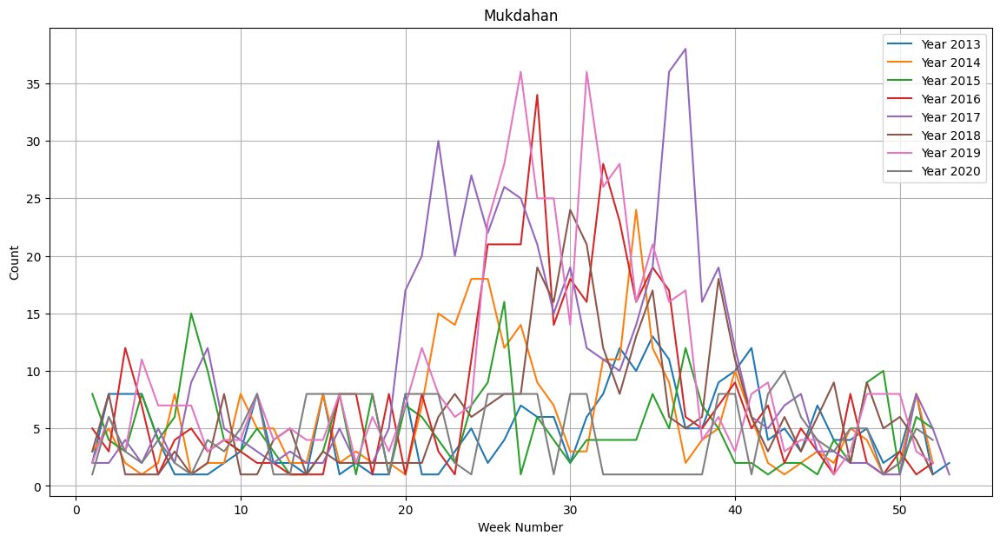

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155144"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.60 GB / 78.19 GB (59.6%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 6.65376


	-6.0168	 = Validation score   (-root_mean_squared_error)
	0.28s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.3196	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.4458	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.8815	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.3634	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.5298	 = Validation score   (-root_mean_squared_error)
	7.17s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-5.2525	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   r


RMSE: 4.433071167366718


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-4.433071,-4.433071,-4.529800,root_mean_squared_error,0.012768,0.004396,7.171673,0.012768,0.004396,7.171673,1,True,9
1,WeightedEnsemble_L2,-4.433071,-4.433071,-4.529800,root_mean_squared_error,0.014637,0.004811,7.185882,0.001869,0.000415,0.014209,2,True,11
2,ExtraTreesMSE,-4.469961,-4.469961,-5.445833,root_mean_squared_error,0.060883,0.045696,0.461108,0.060883,0.045696,0.461108,1,True,6
3,LightGBMLarge,-4.676145,-4.676145,-5.252511,root_mean_squared_error,0.012614,0.007999,0.378779,0.012614,0.007999,0.378779,1,True,10
4,RandomForestMSE,-4.789844,-4.789844,-5.319581,root_mean_squared_error,0.067037,0.047292,0.457254,0.067037,0.047292,0.457254,1,True,5
5,LightGBMXT,-4.858230,-4.858230,-6.655946,root_mean_squared_error,0.014873,0.001302,0.352731,0.014873,0.001302,0.352731,1,True,3
6,NeuralNetFastAI,-4.927029,-4.927029,-6.881502,root_mean_squared_error,0.012894,0.005989,0.504813,0.012894,0.005989,0.504813,1,True,7
7,LightGBM,-4.977648,-4.977648,-6.016814,root_mean_squared_error,0.015282,0.000846,0.277219,0.015282,0.000846,0.277219,1,True,4
8,KNeighborsDist,-5.011547,-5.011547,-6.714126,root_mean_squared_error,0.014089,0.014002,0.004050,0.014089,0.014002,0.004050,1,True,2
9,KNeighborsUnif,-5.027022,-5.027022,-6.799034,root_mean_squared_error,0.014260,0.014028,0.004670,0.014260,0.014028,0.004670,1,True,1


In [43]:
#*
province = "Mukdahan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Mukdahan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Mukdahan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Mukdahan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Chiang Mai

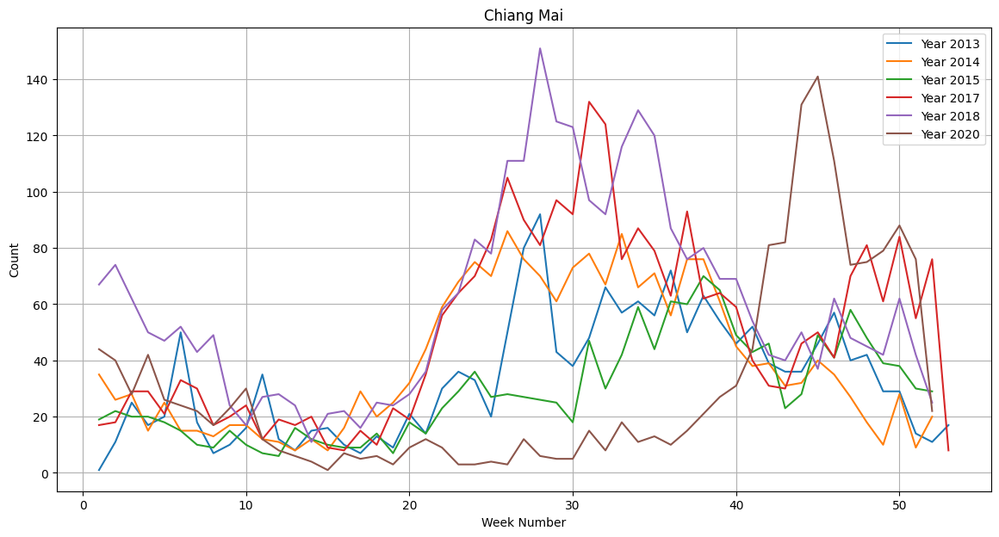

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155155"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.51 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.59 GB / 78.19 GB (59.6%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 13.7146
[2000]	valid_set's rmse: 13.5382
[3000]	valid_set's rmse: 13.2447
[4000]	valid_set's rmse: 13.1159
[5000]	valid_set's rmse: 12.9363
[6000]	valid_set's rmse: 12.8595
[7000]	valid_set's rmse: 12.8473
[8000]	valid_set's rmse: 12.8138
[9000]	valid_set's rmse: 12.8448
[10000]	valid_set's rmse: 12.9358


	-12.8124	 = Validation score   (-root_mean_squared_error)
	1.45s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-12.5892	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-10.957	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-14.4951	 = Validation score   (-root_mean_squared_error)
	1.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-14.2499	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-11.3672	 = Validation score   (-root_mean_squared_error)
	2.94s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-10.3697	 = Validation score   (-root_mean_squared_error)
	0.36s	 = Traini


RMSE: 11.168174967712858


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-10.669573,-10.669573,-10.369679,root_mean_squared_error,0.007417,0.001017,0.364630,0.007417,0.001017,0.364630,1,True,10
1,ExtraTreesMSE,-11.091323,-11.091323,-10.957016,root_mean_squared_error,0.056264,0.047457,0.450176,0.056264,0.047457,0.450176,1,True,6
2,WeightedEnsemble_L2,-11.168175,-11.168175,-10.073597,root_mean_squared_error,0.088064,0.060638,5.273388,0.003204,0.000420,0.014185,2,True,11
3,RandomForestMSE,-12.126116,-12.126116,-12.589167,root_mean_squared_error,0.063945,0.045645,0.463105,0.063945,0.045645,0.463105,1,True,5
4,LightGBM,-13.036510,-13.036510,-12.812386,root_mean_squared_error,0.036547,0.004781,1.448590,0.036547,0.004781,1.448590,1,True,4
5,XGBoost,-14.943210,-14.943210,-14.249946,root_mean_squared_error,0.009542,0.002266,0.133930,0.009542,0.002266,0.133930,1,True,8
6,NeuralNetTorch,-15.228618,-15.228618,-11.367242,root_mean_squared_error,0.005781,0.003330,2.943016,0.005781,0.003330,2.943016,1,True,9
7,KNeighborsDist,-17.608941,-17.608941,-15.945453,root_mean_squared_error,0.013897,0.013698,0.004404,0.013897,0.013698,0.004404,1,True,2
8,NeuralNetFastAI,-18.931126,-18.931126,-14.495141,root_mean_squared_error,0.015398,0.008414,1.501379,0.015398,0.008414,1.501379,1,True,7
9,KNeighborsUnif,-21.221029,-21.221029,-18.470241,root_mean_squared_error,0.014348,0.014033,0.004895,0.014348,0.014033,0.004895,1,True,1


In [44]:
#*
province = "Chiang Mai"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chiang_Mai = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chiang_Mai.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chiang_Mai.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Lamphun

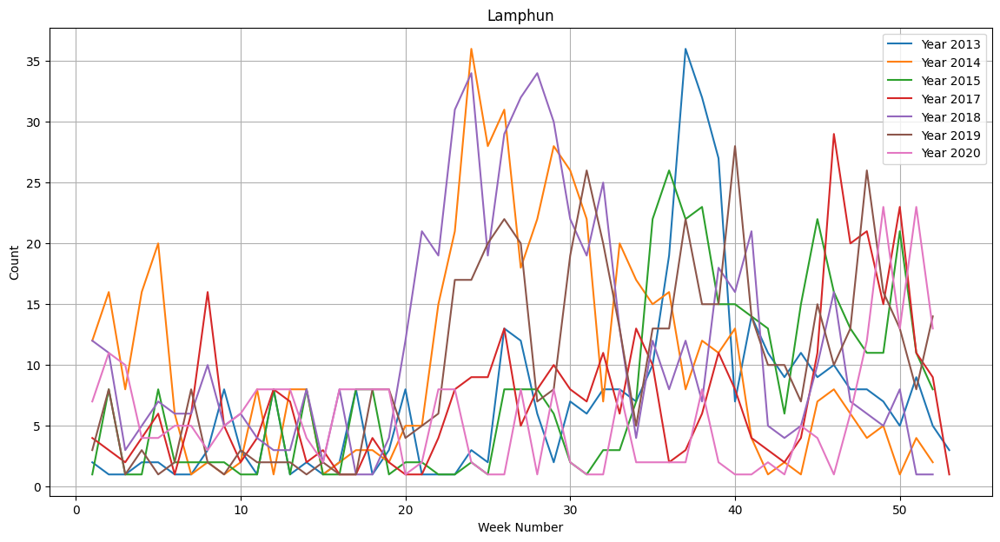

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155204"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.51 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.57 GB / 78.19 GB (59.6%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.45801
[2000]	valid_set's rmse: 5.35099


	-5.3352	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-5.3118	 = Validation score   (-root_mean_squared_error)
	0.3s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.1734	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.153	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.4049	 = Validation score   (-root_mean_squared_error)
	1.76s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.7619	 = Validation score   (-root_mean_squared_error)
	0.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.1237	 = Validation score   (-root_mean_squared_error)
	2.1s	 = Training   runtime


RMSE: 6.613175825838823


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.518562,-6.518562,-4.153019,root_mean_squared_error,0.055892,0.049022,0.476681,0.055892,0.049022,0.476681,1,True,6
1,WeightedEnsemble_L2,-6.613176,-6.613176,-4.044017,root_mean_squared_error,0.127144,0.100509,1.324045,0.002716,0.000429,0.014369,2,True,11
2,RandomForestMSE,-6.700605,-6.700605,-4.173385,root_mean_squared_error,0.057434,0.050130,0.475500,0.057434,0.050130,0.475500,1,True,5
3,LightGBMLarge,-6.862195,-6.862195,-4.179813,root_mean_squared_error,0.011101,0.000929,0.357496,0.011101,0.000929,0.357496,1,True,10
4,XGBoost,-7.050669,-7.050669,-4.761901,root_mean_squared_error,0.008004,0.002236,0.134917,0.008004,0.002236,0.134917,1,True,8
5,LightGBM,-7.571178,-7.571178,-5.311809,root_mean_squared_error,0.003389,0.001076,0.296345,0.003389,0.001076,0.296345,1,True,4
6,LightGBMXT,-7.927618,-7.927618,-5.335238,root_mean_squared_error,0.008570,0.008980,0.521523,0.008570,0.008980,0.521523,1,True,3
7,KNeighborsDist,-8.617004,-8.617004,-5.304194,root_mean_squared_error,0.013911,0.014191,0.003829,0.013911,0.014191,0.003829,1,True,2
8,KNeighborsUnif,-8.735606,-8.735606,-5.285221,root_mean_squared_error,0.015515,0.014400,0.004404,0.015515,0.014400,0.004404,1,True,1
9,NeuralNetFastAI,-8.920590,-8.920590,-5.404883,root_mean_squared_error,0.017317,0.008258,1.761085,0.017317,0.008258,1.761085,1,True,7


In [45]:
#*
province = "Lamphun"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Lamphun = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Lamphun.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Lamphun.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Lampang

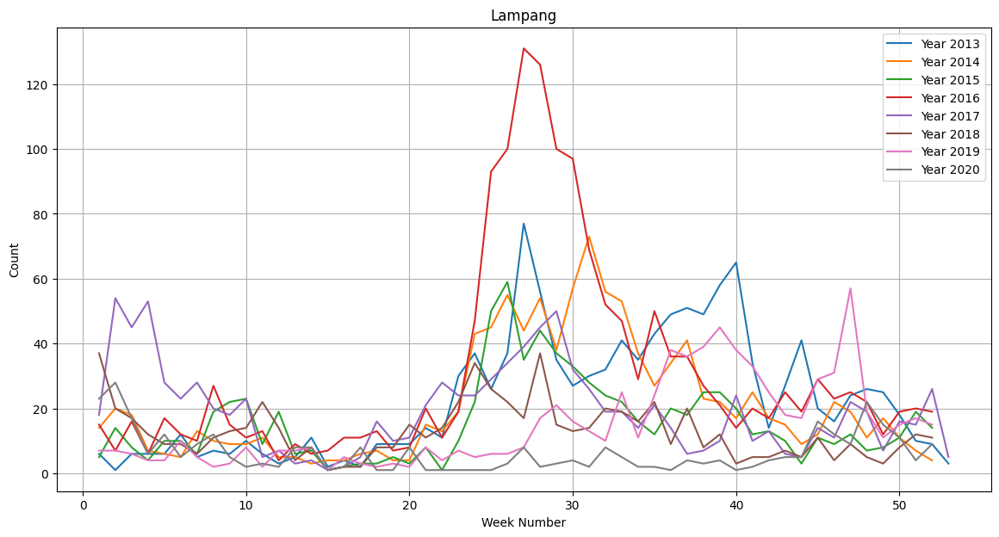

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155211"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.51 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.55 GB / 78.19 GB (59.5%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 10.2858
[2000]	valid_set's rmse: 10.0345
[3000]	valid_set's rmse: 9.93628
[4000]	valid_set's rmse: 9.87878
[5000]	valid_set's rmse: 9.72885
[6000]	valid_set's rmse: 9.69917
[7000]	valid_set's rmse: 9.67719
[8000]	valid_set's rmse: 9.65019
[9000]	valid_set's rmse: 9.6048


	-9.6197	 = Validation score   (-root_mean_squared_error)
	1.22s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[10000]	valid_set's rmse: 9.62526
[1000]	valid_set's rmse: 10.1245
[2000]	valid_set's rmse: 9.60609
[3000]	valid_set's rmse: 9.08205
[4000]	valid_set's rmse: 8.92724
[5000]	valid_set's rmse: 8.87165
[6000]	valid_set's rmse: 8.8538
[7000]	valid_set's rmse: 8.87281


	-8.8296	 = Validation score   (-root_mean_squared_error)
	1.32s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-8.5562	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-7.4057	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-11.8479	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-8.7799	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-7.5544	 = Validation score   (-root_mean_squared_error)
	7.54s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-8.0388	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   


RMSE: 7.8257110785908806


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-7.825711,-7.825711,-7.129709,root_mean_squared_error,0.075048,0.053828,8.182190,0.003072,0.000404,0.014336,2,True,11
1,ExtraTreesMSE,-7.941651,-7.941651,-7.405708,root_mean_squared_error,0.058556,0.047405,0.467698,0.058556,0.047405,0.467698,1,True,6
2,NeuralNetTorch,-8.308493,-8.308493,-7.554412,root_mean_squared_error,0.005025,0.003410,7.542809,0.005025,0.003410,7.542809,1,True,9
3,RandomForestMSE,-9.701093,-9.701093,-8.556179,root_mean_squared_error,0.064421,0.046674,0.472233,0.064421,0.046674,0.472233,1,True,5
4,LightGBMLarge,-9.745871,-9.745871,-8.038821,root_mean_squared_error,0.010973,0.001203,0.498611,0.010973,0.001203,0.498611,1,True,10
5,LightGBMXT,-10.012133,-10.012133,-9.619722,root_mean_squared_error,0.031255,0.006378,1.222530,0.031255,0.006378,1.222530,1,True,3
6,LightGBM,-10.643931,-10.643931,-8.829604,root_mean_squared_error,0.036311,0.005588,1.319515,0.036311,0.005588,1.319515,1,True,4
7,NeuralNetFastAI,-10.712346,-10.712346,-11.847937,root_mean_squared_error,0.011794,0.006112,0.497273,0.011794,0.006112,0.497273,1,True,7
8,XGBoost,-10.794684,-10.794684,-8.779909,root_mean_squared_error,0.008396,0.002609,0.157347,0.008396,0.002609,0.157347,1,True,8
9,KNeighborsDist,-11.176801,-11.176801,-12.382493,root_mean_squared_error,0.013957,0.015840,0.004796,0.013957,0.015840,0.004796,1,True,2


In [46]:

#*
province = "Lampang"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Lampang = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Lampang.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Lampang.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Uttaradit

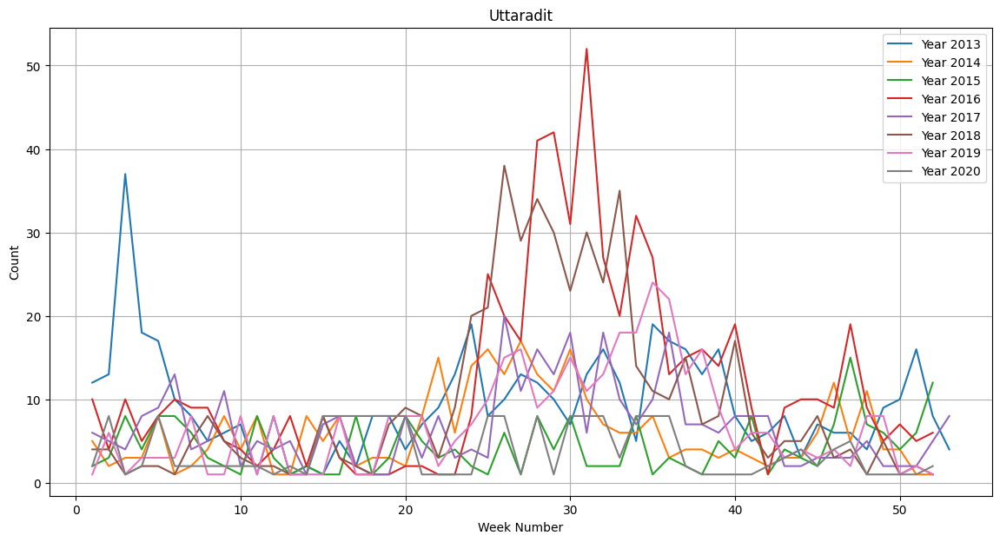

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155225"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.53 GB / 78.19 GB (59.5%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.99395
[2000]	valid_set's rmse: 5.78312
[3000]	valid_set's rmse: 5.638
[4000]	valid_set's rmse: 5.53891
[5000]	valid_set's rmse: 5.49467
[6000]	valid_set's rmse: 5.47183
[7000]	valid_set's rmse: 5.46646
[8000]	valid_set's rmse: 5.45259
[9000]	valid_set's rmse: 5.46781


	-5.4493	 = Validation score   (-root_mean_squared_error)
	1.21s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-5.6833	 = Validation score   (-root_mean_squared_error)
	0.3s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.2448	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.3311	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.3899	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.7807	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.9923	 = Validation score   (-root_mean_squared_error)
	5.9s	 = Training   runtim


RMSE: 3.407559889807749


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-3.370075,-3.370075,-4.992252,root_mean_squared_error,0.005650,0.004251,5.902496,0.005650,0.004251,5.902496,1,True,9
1,WeightedEnsemble_L2,-3.407560,-3.407560,-4.810496,root_mean_squared_error,0.075642,0.056853,6.747817,0.002638,0.000419,0.014179,2,True,11
2,ExtraTreesMSE,-3.729526,-3.729526,-5.331066,root_mean_squared_error,0.056716,0.046084,0.475318,0.056716,0.046084,0.475318,1,True,6
3,LightGBMXT,-3.976118,-3.976118,-5.449296,root_mean_squared_error,0.033226,0.007459,1.213189,0.033226,0.007459,1.213189,1,True,3
4,LightGBMLarge,-3.995754,-3.995754,-5.081566,root_mean_squared_error,0.010195,0.000978,0.361825,0.010195,0.000978,0.361825,1,True,10
5,LightGBM,-4.127389,-4.127389,-5.683323,root_mean_squared_error,0.005855,0.000906,0.303347,0.005855,0.000906,0.303347,1,True,4
6,XGBoost,-4.132190,-4.132190,-5.780675,root_mean_squared_error,0.009606,0.002486,0.141273,0.009606,0.002486,0.141273,1,True,8
7,RandomForestMSE,-4.199892,-4.199892,-5.244764,root_mean_squared_error,0.057159,0.051205,0.469317,0.057159,0.051205,0.469317,1,True,5
8,NeuralNetFastAI,-4.320832,-4.320832,-6.389943,root_mean_squared_error,0.012178,0.006233,0.462667,0.012178,0.006233,0.462667,1,True,7
9,KNeighborsDist,-4.729535,-4.729535,-6.905459,root_mean_squared_error,0.014027,0.013842,0.003788,0.014027,0.013842,0.003788,1,True,2


In [47]:
#*
province = "Uttaradit"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Uttaradit = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Uttaradit.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Uttaradit.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phrae

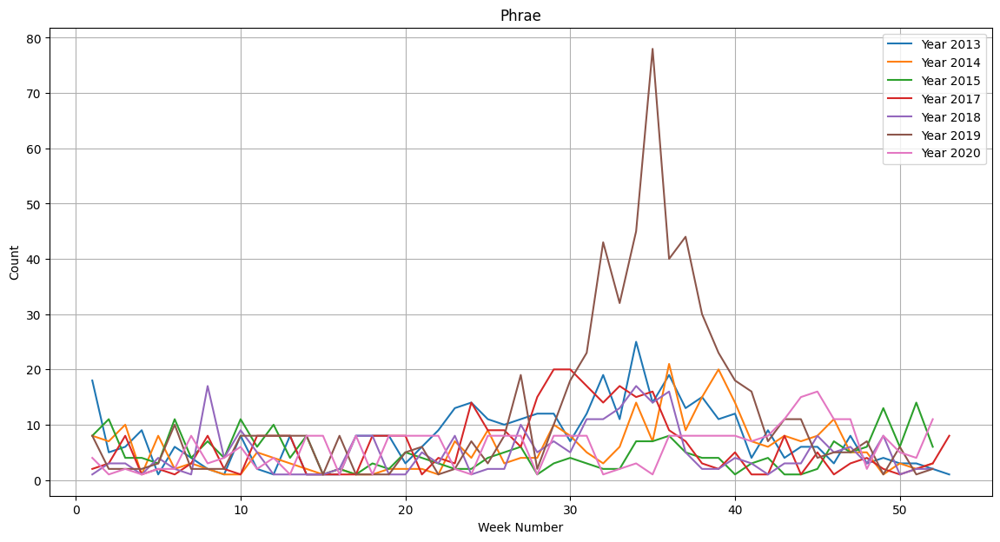

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155235"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.51 GB / 78.19 GB (59.5%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.06782


	-4.3822	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.8616	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.0108	 = Validation score   (-root_mean_squared_error)
	1.69s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.6536	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.0848	 = Validation score   (-root_mean_squared_error)
	2.9s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.1145	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'NeuralNetFastAI': 0.375, 'LightGBMLarge': 0.25, 'LightG


RMSE: 4.554907928774935


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.850671,-3.850671,-3.861647,root_mean_squared_error,0.060099,0.046500,0.461977,0.060099,0.046500,0.461977,1,True,6
1,LightGBMLarge,-4.230009,-4.230009,-4.114453,root_mean_squared_error,0.017513,0.001078,0.386920,0.017513,0.001078,0.386920,1,True,10
2,RandomForestMSE,-4.272920,-4.272920,-4.382230,root_mean_squared_error,0.061056,0.047237,0.469031,0.061056,0.047237,0.469031,1,True,5
3,LightGBM,-4.290943,-4.290943,-4.038452,root_mean_squared_error,0.007616,0.001782,0.477956,0.007616,0.001782,0.477956,1,True,4
4,WeightedEnsemble_L2,-4.554908,-4.554908,-3.672402,root_mean_squared_error,0.113216,0.062501,5.930833,0.003530,0.000417,0.014118,2,True,11
5,NeuralNetTorch,-5.107435,-5.107435,-4.084756,root_mean_squared_error,0.005871,0.004350,2.898405,0.005871,0.004350,2.898405,1,True,9
6,XGBoost,-5.270143,-5.270143,-4.653565,root_mean_squared_error,0.010257,0.002483,0.148287,0.010257,0.002483,0.148287,1,True,8
7,LightGBMXT,-5.926386,-5.926386,-4.217811,root_mean_squared_error,0.013522,0.000892,0.271236,0.013522,0.000892,0.271236,1,True,3
8,NeuralNetFastAI,-5.986562,-5.986562,-4.010761,root_mean_squared_error,0.018587,0.008374,1.691457,0.018587,0.008374,1.691457,1,True,7
9,KNeighborsDist,-6.983484,-6.983484,-5.053070,root_mean_squared_error,0.013861,0.014028,0.003846,0.013861,0.014028,0.003846,1,True,2


In [48]:
#*
province = "Phrae"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phrae = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phrae.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phrae.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nan

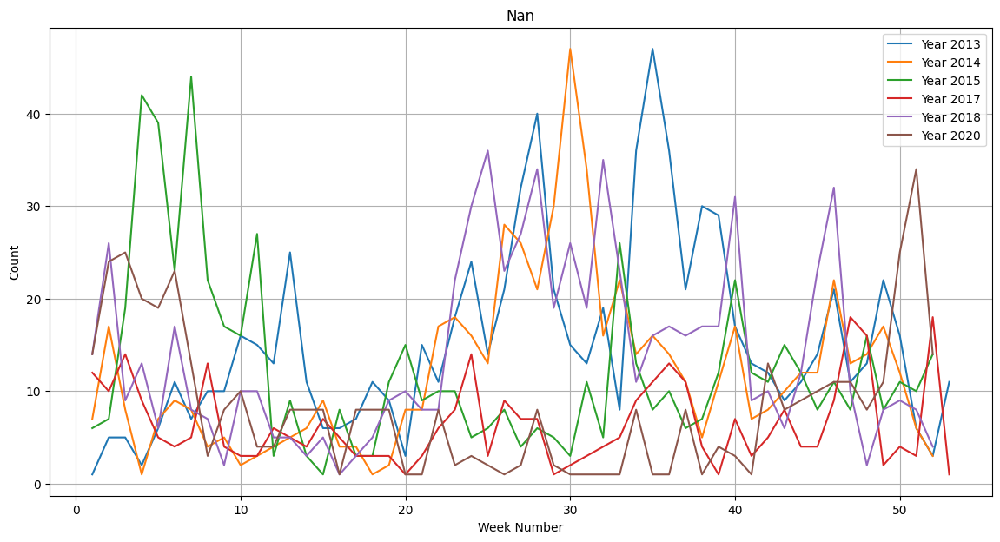

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155244"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.50 GB / 78.19 GB (59.5%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 6.6971402509959965


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.354204,-6.354204,-4.815810,root_mean_squared_error,0.057874,0.046212,0.462196,0.057874,0.046212,0.462196,1,True,6
1,RandomForestMSE,-6.653656,-6.653656,-4.882151,root_mean_squared_error,0.061164,0.048009,0.471433,0.061164,0.048009,0.471433,1,True,5
2,WeightedEnsemble_L2,-6.697140,-6.697140,-4.357771,root_mean_squared_error,0.128207,0.098730,2.238703,0.002954,0.000382,0.013896,2,True,11
3,XGBoost,-7.069618,-7.069618,-5.845379,root_mean_squared_error,0.008090,0.002491,0.145175,0.008090,0.002491,0.145175,1,True,8
4,LightGBMLarge,-7.678268,-7.678268,-5.083130,root_mean_squared_error,0.011010,0.000787,0.319687,0.011010,0.000787,0.319687,1,True,10
5,KNeighborsDist,-8.204317,-8.204317,-6.004163,root_mean_squared_error,0.014229,0.014431,0.003481,0.014229,0.014431,0.003481,1,True,2
6,LightGBM,-8.302758,-8.302758,-5.515991,root_mean_squared_error,0.001290,0.000823,0.253251,0.001290,0.000823,0.253251,1,True,4
7,NeuralNetFastAI,-8.323584,-8.323584,-5.812927,root_mean_squared_error,0.014375,0.008368,1.499530,0.014375,0.008368,1.499530,1,True,7
8,LightGBMXT,-8.634897,-8.634897,-6.041601,root_mean_squared_error,0.003622,0.000983,0.292150,0.003622,0.000983,0.292150,1,True,3
9,KNeighborsUnif,-8.653433,-8.653433,-6.259863,root_mean_squared_error,0.014223,0.014274,0.004464,0.014223,0.014274,0.004464,1,True,1


In [49]:
#*
province = "Nan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phayao

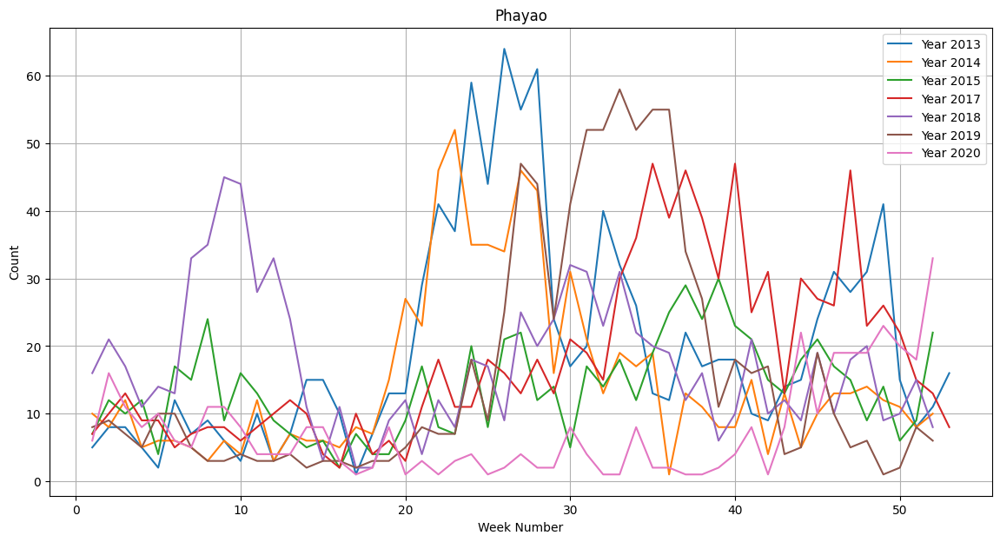

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155249"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.48 GB / 78.19 GB (59.4%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 9.27961
[2000]	valid_set's rmse: 8.86798
[3000]	valid_set's rmse: 8.76897


	-8.7613	 = Validation score   (-root_mean_squared_error)
	0.67s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[4000]	valid_set's rmse: 8.78008
[1000]	valid_set's rmse: 7.26624
[2000]	valid_set's rmse: 7.24557


	-7.2119	 = Validation score   (-root_mean_squared_error)
	0.54s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-7.7467	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.5367	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.5992	 = Validation score   (-root_mean_squared_error)
	1.71s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-7.2521	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-11.4241	 = Validation score   (-root_mean_squared_error)
	0.57s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-7.0721	 = Validation score   (-root_mean_squared_error)
	0.44s	 = Training  


RMSE: 6.503879832812334


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.256344,-6.256344,-6.536736,root_mean_squared_error,0.059628,0.046436,0.467063,0.059628,0.046436,0.467063,1,True,6
1,WeightedEnsemble_L2,-6.503880,-6.503880,-6.265496,root_mean_squared_error,0.090928,0.063354,1.649190,0.003365,0.000399,0.014607,2,True,11
2,RandomForestMSE,-6.788911,-6.788911,-7.746702,root_mean_squared_error,0.060180,0.047484,0.469806,0.060180,0.047484,0.469806,1,True,5
3,LightGBMLarge,-7.261795,-7.261795,-7.072122,root_mean_squared_error,0.013783,0.010112,0.437870,0.013783,0.010112,0.437870,1,True,10
4,LightGBM,-7.670198,-7.670198,-7.211894,root_mean_squared_error,0.011921,0.001776,0.535558,0.011921,0.001776,0.535558,1,True,4
5,XGBoost,-7.786427,-7.786427,-7.252138,root_mean_squared_error,0.008903,0.002521,0.161605,0.008903,0.002521,0.161605,1,True,8
6,LightGBMXT,-10.170415,-10.170415,-8.761267,root_mean_squared_error,0.021601,0.002297,0.672917,0.021601,0.002297,0.672917,1,True,3
7,KNeighborsDist,-10.495104,-10.495104,-9.865115,root_mean_squared_error,0.013984,0.016720,0.004092,0.013984,0.016720,0.004092,1,True,2
8,KNeighborsUnif,-10.609786,-10.609786,-10.075848,root_mean_squared_error,0.014457,0.014019,0.005177,0.014457,0.014019,0.005177,1,True,1
9,NeuralNetFastAI,-10.679471,-10.679471,-9.599248,root_mean_squared_error,0.017426,0.008492,1.711696,0.017426,0.008492,1.711696,1,True,7


In [50]:
#*
province = "Phayao"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phayao = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phayao.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phayao.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Chiang Rai

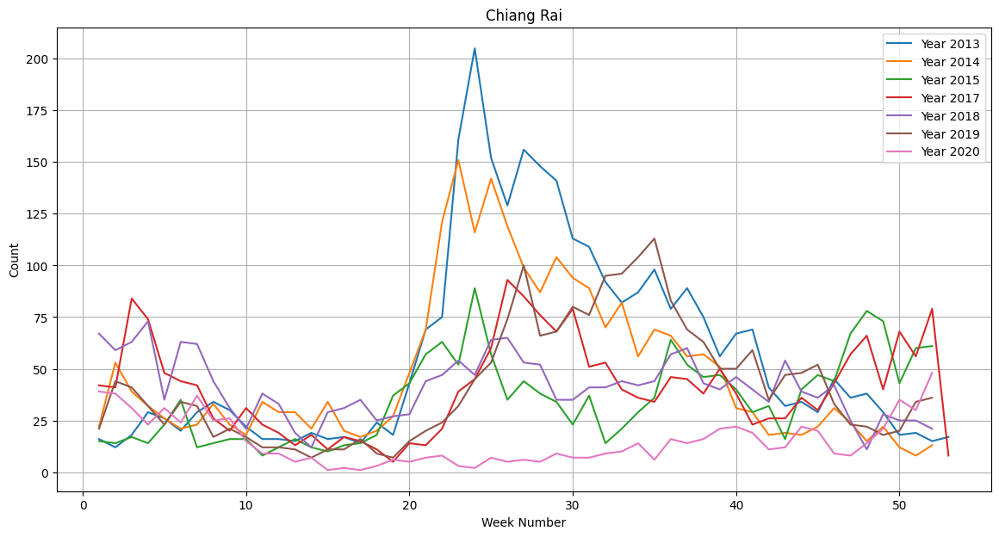

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155256"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.49 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.47 GB / 78.19 GB (59.4%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 18.2483


	-15.5787	 = Validation score   (-root_mean_squared_error)
	0.28s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-15.1519	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-12.8654	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-17.8692	 = Validation score   (-root_mean_squared_error)
	1.7s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-14.5568	 = Validation score   (-root_mean_squared_error)
	0.2s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-14.8932	 = Validation score   (-root_mean_squared_error)
	3.03s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-16.5073	 = Validation score   (-root_mean_squared_error)
	0.36s	 = Traini


RMSE: 8.292998313562533


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-8.292998,-8.292998,-12.507324,root_mean_squared_error,0.149100,0.118710,1.421919,0.003763,0.000376,0.013860,2,True,11
1,ExtraTreesMSE,-8.608743,-8.608743,-12.865431,root_mean_squared_error,0.059930,0.052641,0.455571,0.059930,0.052641,0.455571,1,True,6
2,RandomForestMSE,-9.755551,-9.755551,-15.151886,root_mean_squared_error,0.056304,0.047853,0.463301,0.056304,0.047853,0.463301,1,True,5
3,LightGBMLarge,-11.607983,-11.607983,-16.507320,root_mean_squared_error,0.006959,0.001015,0.356639,0.006959,0.001015,0.356639,1,True,10
4,XGBoost,-12.043609,-12.043609,-14.556807,root_mean_squared_error,0.012854,0.002584,0.202094,0.012854,0.002584,0.202094,1,True,8
5,NeuralNetTorch,-12.334813,-12.334813,-14.893215,root_mean_squared_error,0.006555,0.003772,3.033257,0.006555,0.003772,3.033257,1,True,9
6,LightGBM,-14.325486,-14.325486,-15.578653,root_mean_squared_error,0.001855,0.000902,0.282477,0.001855,0.000902,0.282477,1,True,4
7,KNeighborsDist,-16.917402,-16.917402,-17.260720,root_mean_squared_error,0.013899,0.013791,0.003793,0.013899,0.013791,0.003793,1,True,2
8,KNeighborsUnif,-17.637644,-17.637644,-17.468946,root_mean_squared_error,0.014393,0.014354,0.004616,0.014393,0.014354,0.004616,1,True,1
9,LightGBMXT,-17.850344,-17.850344,-18.236417,root_mean_squared_error,0.009140,0.001129,0.328331,0.009140,0.001129,0.328331,1,True,3


In [51]:
#*
province = "Chiang Rai"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chiang_Rai = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chiang_Rai.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chiang_Rai.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Mae Hong Son

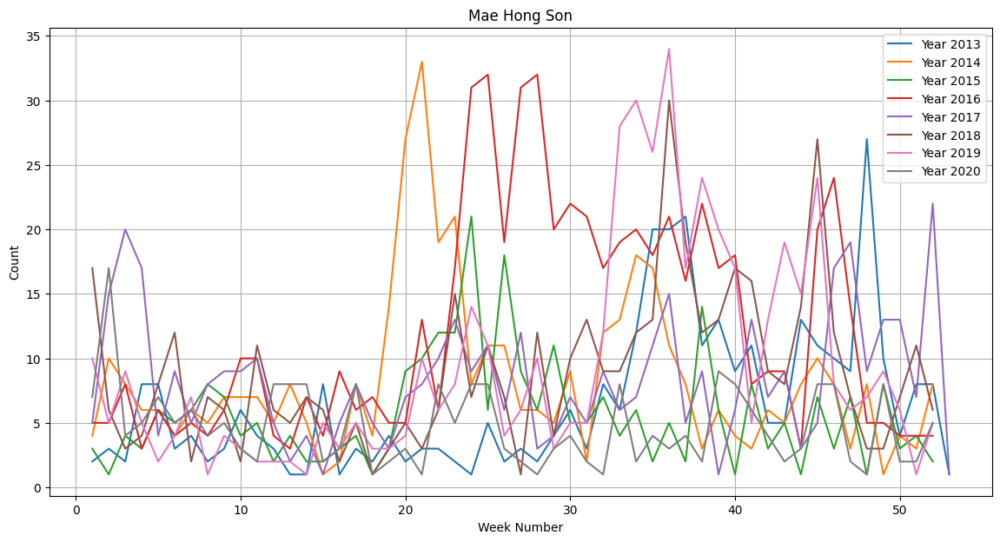

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155304"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.45 GB / 78.19 GB (59.4%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.87421
[2000]	valid_set's rmse: 4.81877


	-4.4218	 = Validation score   (-root_mean_squared_error)
	0.28s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.0586	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.3963	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.2023	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.4813	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.6583	 = Validation score   (-root_mean_squared_error)
	3.77s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.1693	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   


RMSE: 5.356883066846493


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-5.092911,-5.092911,-4.481308,root_mean_squared_error,0.009972,0.002436,0.154924,0.009972,0.002436,0.154924,1,True,8
1,LightGBMLarge,-5.102740,-5.102740,-4.169324,root_mean_squared_error,0.007096,0.000929,0.387144,0.007096,0.000929,0.387144,1,True,10
2,ExtraTreesMSE,-5.155998,-5.155998,-4.396299,root_mean_squared_error,0.057360,0.049170,0.470160,0.057360,0.049170,0.470160,1,True,6
3,LightGBM,-5.348937,-5.348937,-4.421823,root_mean_squared_error,0.002588,0.000864,0.283339,0.002588,0.000864,0.283339,1,True,4
4,WeightedEnsemble_L2,-5.356883,-5.356883,-4.032762,root_mean_squared_error,0.072523,0.052754,4.629759,0.002693,0.000382,0.015212,2,True,11
5,RandomForestMSE,-5.424038,-5.424038,-4.058611,root_mean_squared_error,0.056659,0.048167,0.459455,0.056659,0.048167,0.459455,1,True,5
6,LightGBMXT,-5.680310,-5.680310,-4.801158,root_mean_squared_error,0.008364,0.003877,0.469500,0.008364,0.003877,0.469500,1,True,3
7,KNeighborsDist,-6.012389,-6.012389,-5.453400,root_mean_squared_error,0.013928,0.013696,0.004132,0.013928,0.013696,0.004132,1,True,2
8,KNeighborsUnif,-6.100312,-6.100312,-5.584894,root_mean_squared_error,0.014211,0.014246,0.005233,0.014211,0.014246,0.005233,1,True,1
9,NeuralNetTorch,-6.198497,-6.198497,-4.658318,root_mean_squared_error,0.006076,0.003276,3.767948,0.006076,0.003276,3.767948,1,True,9


In [52]:
#*
province = "Mae Hong Son"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Mae_Hong_Son = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Mae_Hong_Son.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Mae_Hong_Son.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Sawan

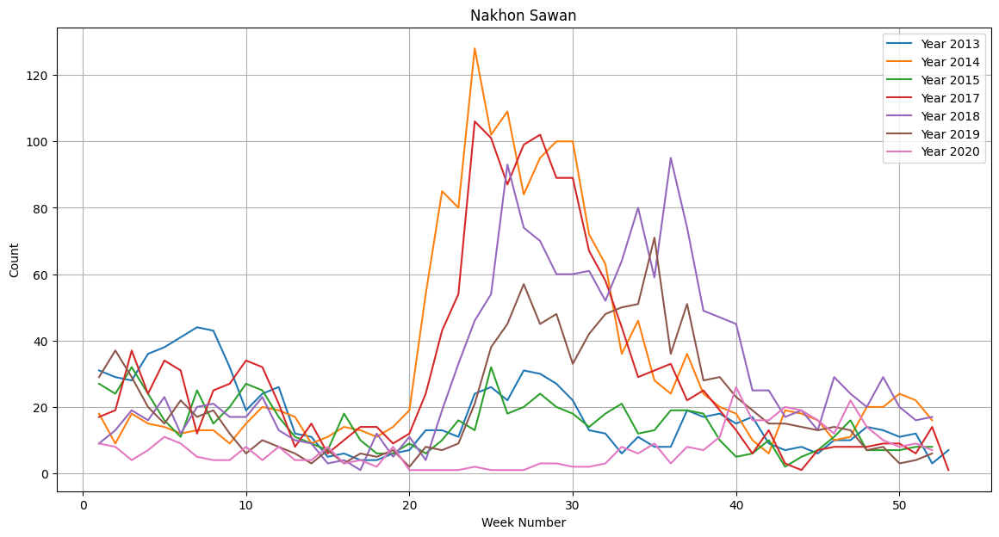

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155312"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.44 GB / 78.19 GB (59.4%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 11.6623
[2000]	valid_set's rmse: 11.1834
[3000]	valid_set's rmse: 10.8688
[4000]	valid_set's rmse: 10.7241
[5000]	valid_set's rmse: 10.661
[6000]	valid_set's rmse: 10.6926


	-10.6243	 = Validation score   (-root_mean_squared_error)
	0.81s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-7.3458	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 7.58142


	-6.6246	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.8734	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-12.441	 = Validation score   (-root_mean_squared_error)
	1.71s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-7.9086	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.2486	 = Validation score   (-root_mean_squared_error)
	7.4s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-6.1997	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'NeuralNetTorch': 0.706, 'LightGBMLarge': 0.294}
	-5.0246


RMSE: 8.71397352735358


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-8.647201,-8.647201,-5.248580,root_mean_squared_error,0.005867,0.003340,7.397071,0.005867,0.003340,7.397071,1,True,9
1,WeightedEnsemble_L2,-8.713974,-8.713974,-5.024583,root_mean_squared_error,0.018491,0.005009,7.912331,0.002646,0.000390,0.013780,2,True,11
2,LightGBMLarge,-11.325009,-11.325009,-6.199703,root_mean_squared_error,0.009978,0.001280,0.501479,0.009978,0.001280,0.501479,1,True,10
3,XGBoost,-11.503021,-11.503021,-7.908629,root_mean_squared_error,0.010438,0.002829,0.153032,0.010438,0.002829,0.153032,1,True,8
4,ExtraTreesMSE,-11.789088,-11.789088,-6.873395,root_mean_squared_error,0.059062,0.046008,0.470374,0.059062,0.046008,0.470374,1,True,6
5,RandomForestMSE,-11.840295,-11.840295,-6.624626,root_mean_squared_error,0.061952,0.046945,0.464002,0.061952,0.046945,0.464002,1,True,5
6,LightGBM,-12.397351,-12.397351,-7.345796,root_mean_squared_error,0.009809,0.001565,0.450084,0.009809,0.001565,0.450084,1,True,4
7,LightGBMXT,-15.504051,-15.504051,-10.624292,root_mean_squared_error,0.016925,0.003123,0.814375,0.016925,0.003123,0.814375,1,True,3
8,NeuralNetFastAI,-21.157269,-21.157269,-12.440962,root_mean_squared_error,0.017725,0.008542,1.714401,0.017725,0.008542,1.714401,1,True,7
9,KNeighborsDist,-21.666160,-21.666160,-12.253353,root_mean_squared_error,0.013741,0.013687,0.004267,0.013741,0.013687,0.004267,1,True,2


In [53]:
#*
province = "Nakhon Sawan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Sawan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Sawan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Sawan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Uthai Thani

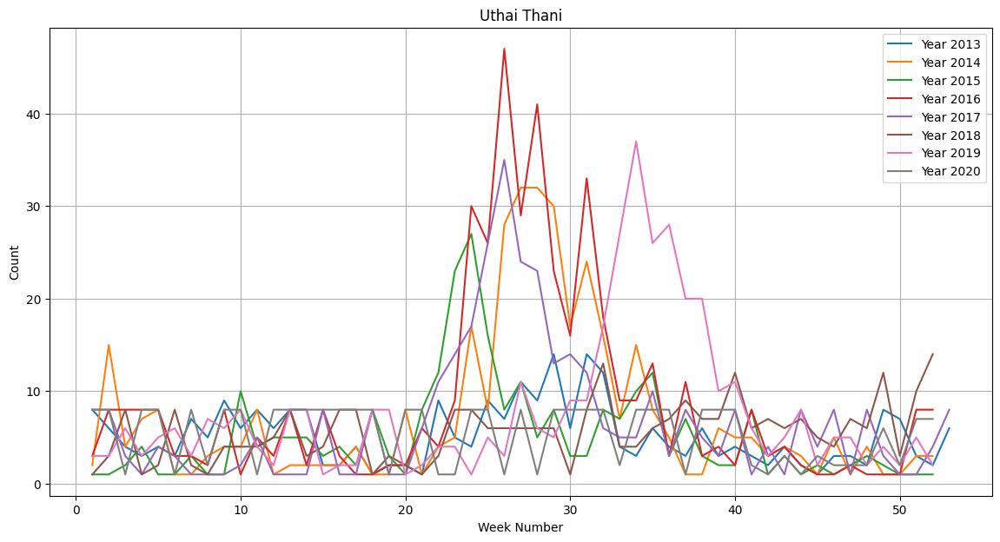

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155325"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.3%)
Disk Space Avail:   46.42 GB / 78.19 GB (59.4%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.32875


	-3.9537	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 4.02146


	-4.5298	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.0498	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.8119	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.2877	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.0533	 = Validation score   (-root_mean_squared_error)
	4.31s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.1934	 = Validation score   (-root_mean_squared_error)
	0.44s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBM': 0.5, 'NeuralNetTorch': 0.417, 'LightGBMXT':


RMSE: 3.970558824132814


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.805921,-3.805921,-4.049793,root_mean_squared_error,0.056447,0.046813,0.475730,0.056447,0.046813,0.475730,1,True,6
1,LightGBMLarge,-3.917425,-3.917425,-4.193448,root_mean_squared_error,0.008522,0.001170,0.439994,0.008522,0.001170,0.439994,1,True,10
2,WeightedEnsemble_L2,-3.970559,-3.970559,-3.751563,root_mean_squared_error,0.029479,0.008094,5.600797,0.003223,0.000389,0.013988,2,True,11
3,LightGBM,-4.088849,-4.088849,-3.953744,root_mean_squared_error,0.008072,0.001900,0.496872,0.008072,0.001900,0.496872,1,True,4
4,RandomForestMSE,-4.240770,-4.240770,-4.529782,root_mean_squared_error,0.058268,0.046214,0.468552,0.058268,0.046214,0.468552,1,True,5
5,KNeighborsDist,-4.393322,-4.393322,-5.266399,root_mean_squared_error,0.014433,0.013713,0.003698,0.014433,0.013713,0.003698,1,True,2
6,XGBoost,-4.419124,-4.419124,-4.287682,root_mean_squared_error,0.008340,0.002437,0.145856,0.008340,0.002437,0.145856,1,True,8
7,KNeighborsUnif,-4.426005,-4.426005,-5.369900,root_mean_squared_error,0.014425,0.013972,0.004505,0.014425,0.013972,0.004505,1,True,1
8,LightGBMXT,-4.506313,-4.506313,-4.319078,root_mean_squared_error,0.004529,0.001277,0.344772,0.004529,0.001277,0.344772,1,True,3
9,NeuralNetTorch,-4.601854,-4.601854,-4.053281,root_mean_squared_error,0.005133,0.003357,4.305170,0.005133,0.003357,4.305170,1,True,9


In [54]:
#*
province = "Uthai Thani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Uthai_Thani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Uthai_Thani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Uthai_Thani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Kamphaeng Phet

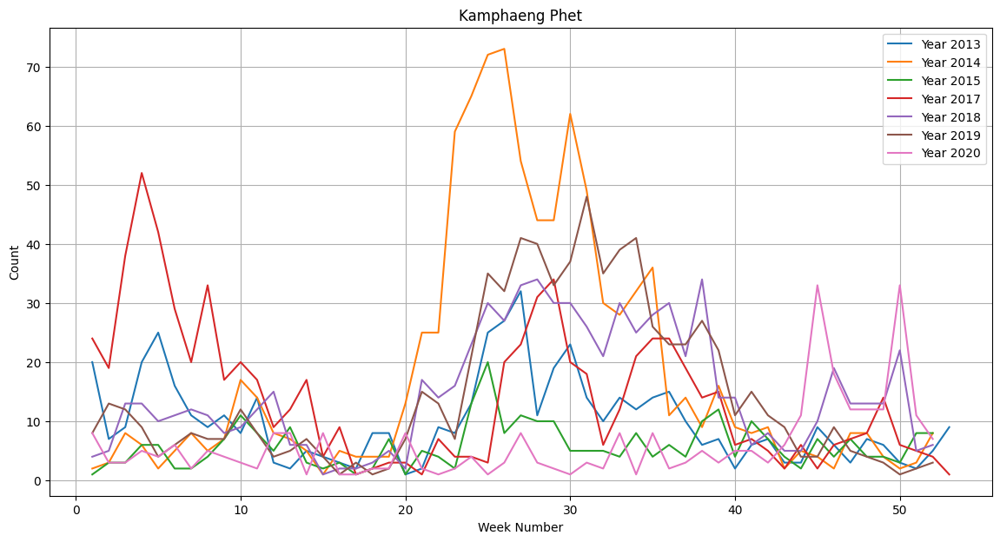

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155333"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.50 GB / 52.96 GB (95.4%)
Disk Space Avail:   46.40 GB / 78.19 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 7.294665567627883


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-6.459418,-6.459418,-5.067630,root_mean_squared_error,0.012222,0.002571,0.189648,0.012222,0.002571,0.189648,1,True,8
1,RandomForestMSE,-6.880906,-6.880906,-4.617712,root_mean_squared_error,0.058911,0.039657,0.461543,0.058911,0.039657,0.461543,1,True,5
2,WeightedEnsemble_L2,-7.294666,-7.294666,-4.588556,root_mean_squared_error,0.114567,0.044182,1.198459,0.002841,0.000384,0.014193,2,True,11
3,ExtraTreesMSE,-7.777965,-7.777965,-5.367571,root_mean_squared_error,0.061199,0.047992,0.451924,0.061199,0.047992,0.451924,1,True,6
4,LightGBMLarge,-7.930641,-7.930641,-5.428131,root_mean_squared_error,0.023935,0.015580,0.399247,0.023935,0.015580,0.399247,1,True,10
5,LightGBM,-11.548404,-11.548404,-5.811707,root_mean_squared_error,0.025334,0.000781,0.261990,0.025334,0.000781,0.261990,1,True,4
6,NeuralNetTorch,-12.224999,-12.224999,-6.114502,root_mean_squared_error,0.005677,0.003332,2.780283,0.005677,0.003332,2.780283,1,True,9
7,LightGBMXT,-13.086248,-13.086248,-7.024999,root_mean_squared_error,0.015260,0.000788,0.271086,0.015260,0.000788,0.271086,1,True,3
8,KNeighborsDist,-13.257442,-13.257442,-6.697430,root_mean_squared_error,0.014943,0.015701,0.004384,0.014943,0.015701,0.004384,1,True,2
9,NeuralNetFastAI,-13.377520,-13.377520,-7.405629,root_mean_squared_error,0.017576,0.008387,1.689027,0.017576,0.008387,1.689027,1,True,7


In [55]:
#*
province = "Kamphaeng Phet"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Kamphaeng_Phet = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Kamphaeng_Phet.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Kamphaeng_Phet.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Tak

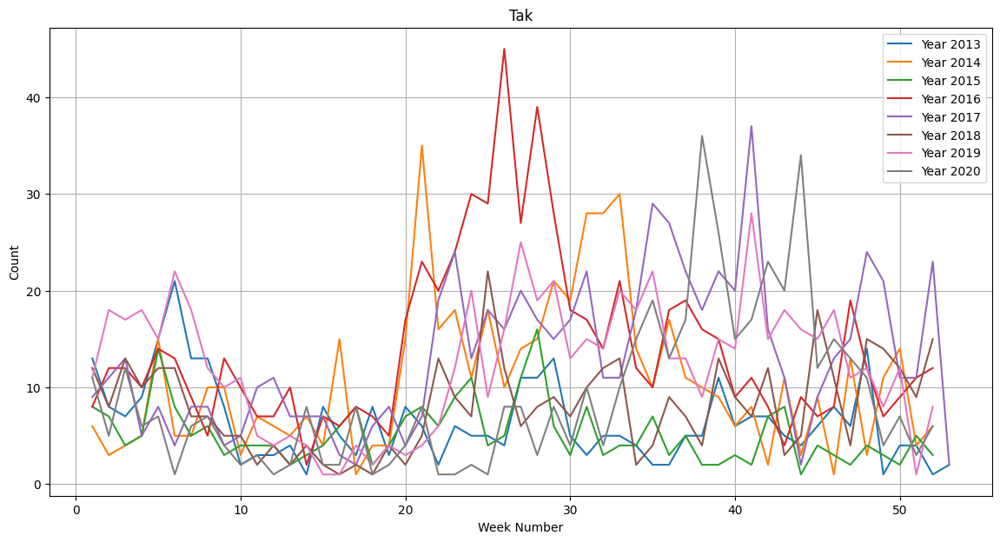

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155341"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.43 GB / 52.96 GB (95.2%)
Disk Space Avail:   46.39 GB / 78.19 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 5.464342427832331


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-5.462828,-5.462828,-4.716686,root_mean_squared_error,0.061296,0.059057,0.582692,0.061296,0.059057,0.582692,1,True,6
1,WeightedEnsemble_L2,-5.464342,-5.464342,-4.628937,root_mean_squared_error,0.086244,0.069249,1.285081,0.002751,0.000436,0.014624,2,True,11
2,LightGBMLarge,-5.478286,-5.478286,-5.305139,root_mean_squared_error,0.018135,0.010444,0.386563,0.018135,0.010444,0.386563,1,True,10
3,RandomForestMSE,-5.805764,-5.805764,-5.398354,root_mean_squared_error,0.061912,0.061393,0.565438,0.061912,0.061393,0.565438,1,True,5
4,LightGBM,-5.853936,-5.853936,-5.434666,root_mean_squared_error,0.023106,0.010283,0.319747,0.023106,0.010283,0.319747,1,True,4
5,XGBoost,-5.959312,-5.959312,-4.900954,root_mean_squared_error,0.010308,0.002937,0.166773,0.010308,0.002937,0.166773,1,True,8
6,LightGBMXT,-6.255361,-6.255361,-5.486515,root_mean_squared_error,0.017360,0.010496,0.338359,0.017360,0.010496,0.338359,1,True,3
7,NeuralNetTorch,-6.277954,-6.277954,-5.467930,root_mean_squared_error,0.005290,0.004612,3.875986,0.005290,0.004612,3.875986,1,True,9
8,KNeighborsDist,-6.669814,-6.669814,-6.567672,root_mean_squared_error,0.014463,0.014647,0.004970,0.014463,0.014647,0.004970,1,True,2
9,KNeighborsUnif,-6.705967,-6.705967,-6.695822,root_mean_squared_error,0.014702,0.014545,0.004974,0.014702,0.014545,0.004974,1,True,1


In [56]:
#*
province = "Tak"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Tak = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Tak.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Tak.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Sukhothai

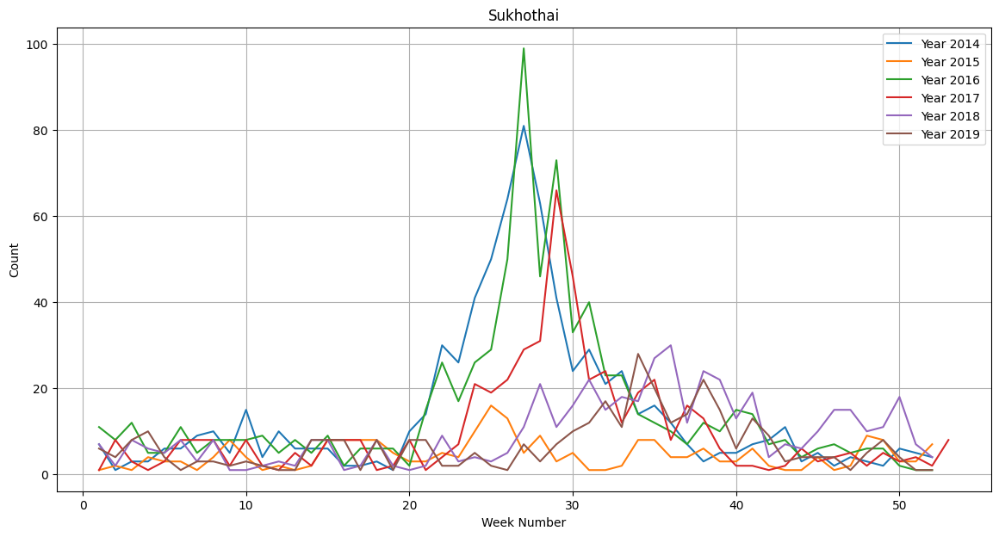

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155349"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.37 GB / 78.19 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 10.0118
[2000]	valid_set's rmse: 9.74063
[3000]	valid_set's rmse: 9.4804
[4000]	valid_set's rmse: 9.38555
[5000]	valid_set's rmse: 9.29305
[6000]	valid_set's rmse: 9.23714
[7000]	valid_set's rmse: 9.19346
[8000]	valid_set's rmse: 9.1488
[9000]	valid_set's rmse: 9.12769
[10000]	valid_set's rmse: 9.06648


	-9.0665	 = Validation score   (-root_mean_squared_error)
	1.26s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-10.7915	 = Validation score   (-root_mean_squared_error)
	0.29s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-10.4238	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-8.9782	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-10.2968	 = Validation score   (-root_mean_squared_error)
	1.63s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-9.9519	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-14.5846	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training  


RMSE: 6.380434604275281


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.032590,-6.032590,-8.978235,root_mean_squared_error,0.056266,0.046173,0.481294,0.056266,0.046173,0.481294,1,True,6
1,WeightedEnsemble_L2,-6.380435,-6.380435,-8.919183,root_mean_squared_error,0.104322,0.057873,1.755455,0.002395,0.000401,0.013752,2,True,11
2,XGBoost,-6.822939,-6.822939,-9.951879,root_mean_squared_error,0.009144,0.002589,0.156561,0.009144,0.002589,0.156561,1,True,8
3,LightGBMXT,-7.410284,-7.410284,-9.066476,root_mean_squared_error,0.045661,0.011300,1.260409,0.045661,0.011300,1.260409,1,True,3
4,LightGBMLarge,-7.632920,-7.632920,-10.159895,root_mean_squared_error,0.016642,0.015698,0.396191,0.016642,0.015698,0.396191,1,True,10
5,RandomForestMSE,-7.919940,-7.919940,-10.423846,root_mean_squared_error,0.058414,0.047575,0.491641,0.058414,0.047575,0.491641,1,True,5
6,NeuralNetFastAI,-8.507495,-8.507495,-10.296835,root_mean_squared_error,0.015422,0.009471,1.628901,0.015422,0.009471,1.628901,1,True,7
7,LightGBM,-8.785316,-8.785316,-10.791518,root_mean_squared_error,0.018593,0.010396,0.289630,0.018593,0.010396,0.289630,1,True,4
8,KNeighborsUnif,-10.216948,-10.216948,-11.713035,root_mean_squared_error,0.014800,0.013880,0.004237,0.014800,0.013880,0.004237,1,True,1
9,KNeighborsDist,-10.243752,-10.243752,-11.361286,root_mean_squared_error,0.014064,0.013686,0.004551,0.014064,0.013686,0.004551,1,True,2


In [57]:
#*
province = "Sukhothai"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Sukhothai = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Sukhothai.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Sukhothai.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phitsanulok

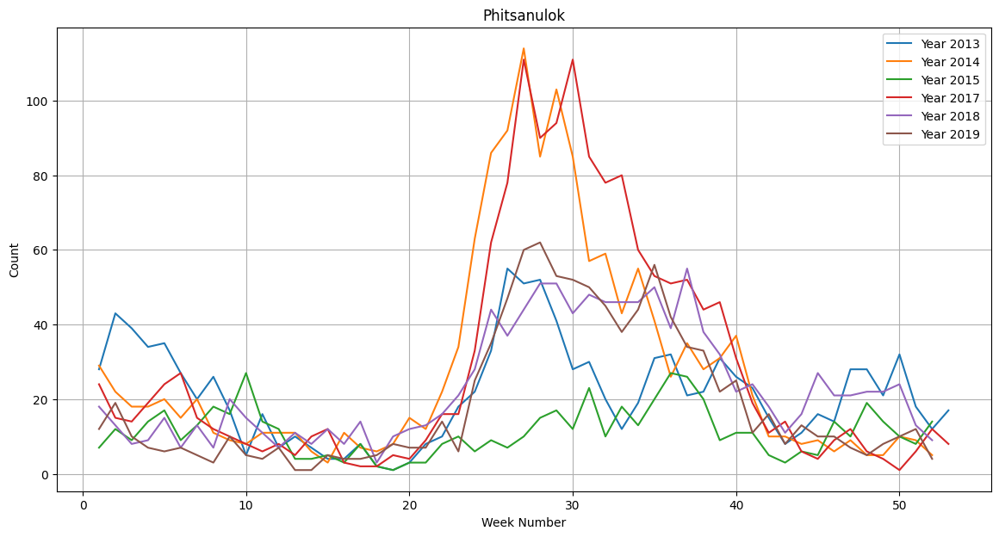

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155356"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.36 GB / 78.19 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 11.5111
[2000]	valid_set's rmse: 10.7648
[3000]	valid_set's rmse: 10.2174
[4000]	valid_set's rmse: 9.81682
[5000]	valid_set's rmse: 9.50591
[6000]	valid_set's rmse: 9.33617
[7000]	valid_set's rmse: 9.18156
[8000]	valid_set's rmse: 9.09893
[9000]	valid_set's rmse: 9.02742
[10000]	valid_set's rmse: 8.98186


	-8.9819	 = Validation score   (-root_mean_squared_error)
	1.39s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 9.77762
[2000]	valid_set's rmse: 9.39157


	-9.3599	 = Validation score   (-root_mean_squared_error)
	0.56s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-7.076	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-7.6574	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.0194	 = Validation score   (-root_mean_squared_error)
	1.54s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-7.206	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-7.7751	 = Validation score   (-root_mean_squared_error)
	5.25s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-7.3062	 = Validation score   (-root_mean_squared_error)
	0.37s	 = Training   


RMSE: 8.204286529281493


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-7.476791,-7.476791,-7.775073,root_mean_squared_error,0.005099,0.003379,5.253947,0.005099,0.003379,5.253947,1,True,9
1,RandomForestMSE,-8.078334,-8.078334,-7.075983,root_mean_squared_error,0.060756,0.049074,0.480957,0.060756,0.049074,0.480957,1,True,5
2,WeightedEnsemble_L2,-8.204287,-8.204287,-6.657298,root_mean_squared_error,0.104189,0.074773,7.813654,0.003553,0.000407,0.013957,2,True,11
3,LightGBMLarge,-8.618925,-8.618925,-7.306155,root_mean_squared_error,0.011591,0.010848,0.374894,0.011591,0.010848,0.374894,1,True,10
4,LightGBM,-9.035524,-9.035524,-9.359863,root_mean_squared_error,0.021461,0.013911,0.562675,0.021461,0.013911,0.562675,1,True,4
5,LightGBMXT,-9.200994,-9.200994,-8.981863,root_mean_squared_error,0.043639,0.010712,1.394096,0.043639,0.010712,1.394096,1,True,3
6,XGBoost,-9.608590,-9.608590,-7.205954,root_mean_squared_error,0.008384,0.002486,0.145720,0.008384,0.002486,0.145720,1,True,8
7,ExtraTreesMSE,-9.730253,-9.730253,-7.657354,root_mean_squared_error,0.060157,0.047941,0.471679,0.060157,0.047941,0.471679,1,True,6
8,KNeighborsDist,-16.842512,-16.842512,-11.963149,root_mean_squared_error,0.014360,0.014161,0.004273,0.014360,0.014161,0.004273,1,True,2
9,KNeighborsUnif,-17.337930,-17.337930,-12.298605,root_mean_squared_error,0.014382,0.014024,0.004953,0.014382,0.014024,0.004953,1,True,1


In [58]:
#*
province = "Phitsanulok"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phitsanulok = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phitsanulok.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phitsanulok.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phichit

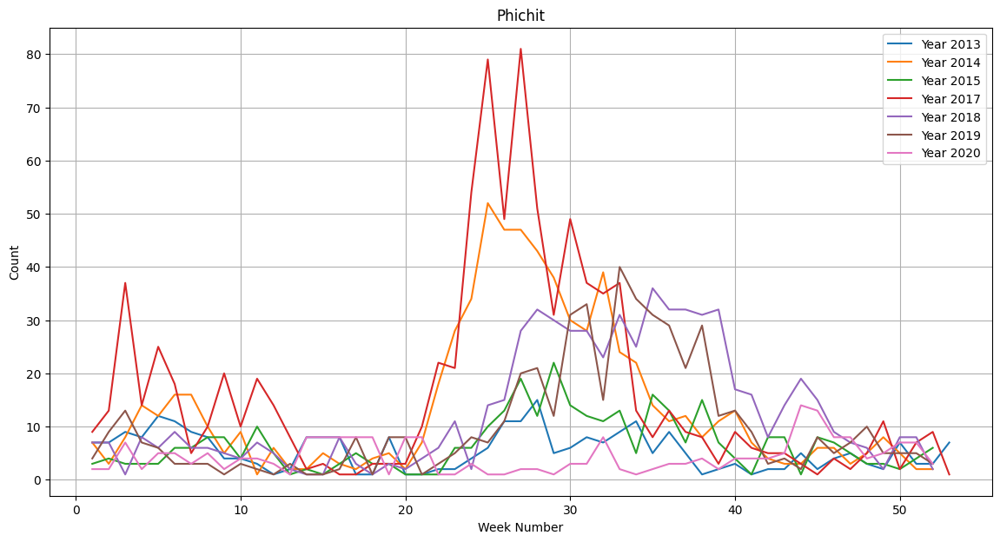

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155407"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.23 GB / 52.96 GB (94.9%)
Disk Space Avail:   46.34 GB / 78.19 GB (59.3%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 8.185863175596678


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.355708,-6.355708,-4.152556,root_mean_squared_error,0.058254,0.048264,0.465248,0.058254,0.048264,0.465248,1,True,6
1,RandomForestMSE,-6.416699,-6.416699,-4.460780,root_mean_squared_error,0.057439,0.049620,0.462695,0.057439,0.049620,0.462695,1,True,5
2,LightGBMLarge,-7.303828,-7.303828,-4.525753,root_mean_squared_error,0.012317,0.000962,0.369289,0.012317,0.000962,0.369289,1,True,10
3,XGBoost,-7.870735,-7.870735,-4.203308,root_mean_squared_error,0.010083,0.002208,0.134948,0.010083,0.002208,0.134948,1,True,8
4,LightGBM,-8.008352,-8.008352,-4.237853,root_mean_squared_error,0.003571,0.001053,0.333769,0.003571,0.001053,0.333769,1,True,4
5,WeightedEnsemble_L2,-8.185863,-8.185863,-3.667549,root_mean_squared_error,0.022256,0.007178,3.135770,0.002593,0.000391,0.014113,2,True,11
6,NeuralNetTorch,-9.574654,-9.574654,-4.081218,root_mean_squared_error,0.006009,0.003526,2.652940,0.006009,0.003526,2.652940,1,True,9
7,NeuralNetFastAI,-10.645308,-10.645308,-4.582563,root_mean_squared_error,0.018211,0.008479,1.680009,0.018211,0.008479,1.680009,1,True,7
8,LightGBMXT,-10.730143,-10.730143,-5.597952,root_mean_squared_error,0.002993,0.000786,0.267969,0.002993,0.000786,0.267969,1,True,3
9,KNeighborsDist,-10.947093,-10.947093,-5.415450,root_mean_squared_error,0.014081,0.013891,0.004294,0.014081,0.013891,0.004294,1,True,2


In [59]:
#*
province = "Phichit"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phichit = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phichit.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phichit.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phetchabun

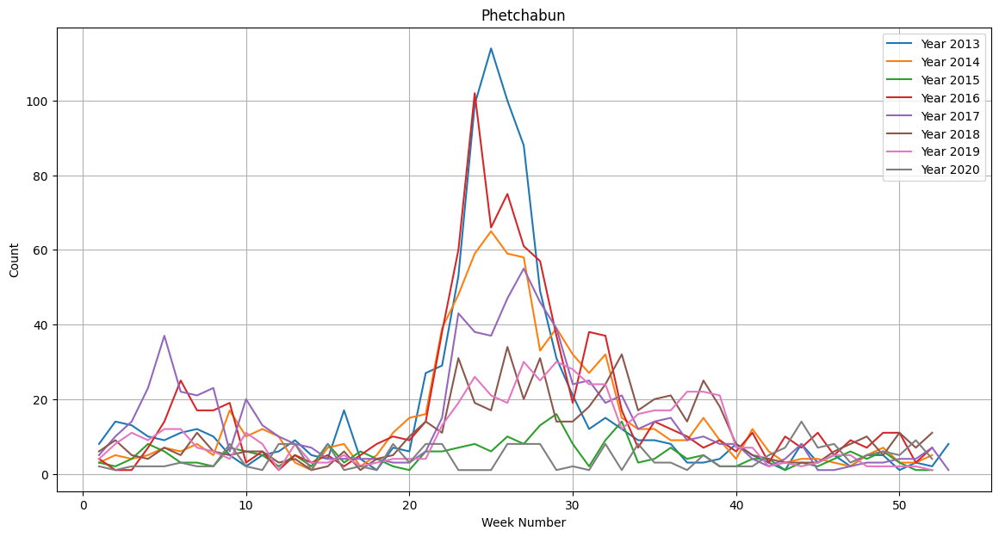

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155415"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.24 GB / 52.96 GB (94.9%)
Disk Space Avail:   46.33 GB / 78.19 GB (59.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 8.36426
[2000]	valid_set's rmse: 7.99062
[3000]	valid_set's rmse: 7.70002
[4000]	valid_set's rmse: 7.61956
[5000]	valid_set's rmse: 7.50303
[6000]	valid_set's rmse: 7.4748
[7000]	valid_set's rmse: 7.46063
[8000]	valid_set's rmse: 7.44821
[9000]	valid_set's rmse: 7.45963


	-7.4492	 = Validation score   (-root_mean_squared_error)
	1.25s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[10000]	valid_set's rmse: 7.46713
[1000]	valid_set's rmse: 6.27525
[2000]	valid_set's rmse: 5.85755


	-5.8269	 = Validation score   (-root_mean_squared_error)
	0.69s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.5848	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.8884	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-9.2403	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.5017	 = Validation score   (-root_mean_squared_error)
	0.36s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.4859	 = Validation score   (-root_mean_squared_error)
	5.55s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-5.7458	 = Validation score   (-root_mean_squared_error)
	0.43s	 = Training   run


RMSE: 8.367170420732949


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBM,-8.308792,-8.308792,-5.826943,root_mean_squared_error,0.013908,0.002564,0.694161,0.013908,0.002564,0.694161,1,True,4
1,WeightedEnsemble_L2,-8.367170,-8.367170,-5.390382,root_mean_squared_error,0.093433,0.058700,6.855846,0.003240,0.000429,0.014085,2,True,11
2,LightGBMLarge,-8.530334,-8.530334,-5.745766,root_mean_squared_error,0.008185,0.001059,0.431682,0.008185,0.001059,0.431682,1,True,10
3,RandomForestMSE,-9.070817,-9.070817,-5.584761,root_mean_squared_error,0.058244,0.050641,0.501088,0.058244,0.050641,0.501088,1,True,5
4,XGBoost,-9.494367,-9.494367,-5.501712,root_mean_squared_error,0.017487,0.003175,0.359734,0.017487,0.003175,0.359734,1,True,8
5,LightGBMXT,-10.383063,-10.383063,-7.449174,root_mean_squared_error,0.026164,0.004546,1.253435,0.026164,0.004546,1.253435,1,True,3
6,ExtraTreesMSE,-10.446823,-10.446823,-5.888422,root_mean_squared_error,0.061390,0.048564,0.495048,0.061390,0.048564,0.495048,1,True,6
7,NeuralNetTorch,-11.663555,-11.663555,-6.485938,root_mean_squared_error,0.006277,0.003396,5.549258,0.006277,0.003396,5.549258,1,True,9
8,KNeighborsDist,-14.019585,-14.019585,-8.570352,root_mean_squared_error,0.014296,0.013838,0.004326,0.014296,0.013838,0.004326,1,True,2
9,KNeighborsUnif,-14.976903,-14.976903,-8.830713,root_mean_squared_error,0.014363,0.014086,0.004820,0.014363,0.014086,0.004820,1,True,1


In [60]:
#*
province = "Phetchabun"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phetchabun = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phetchabun.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phetchabun.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Ratchaburi

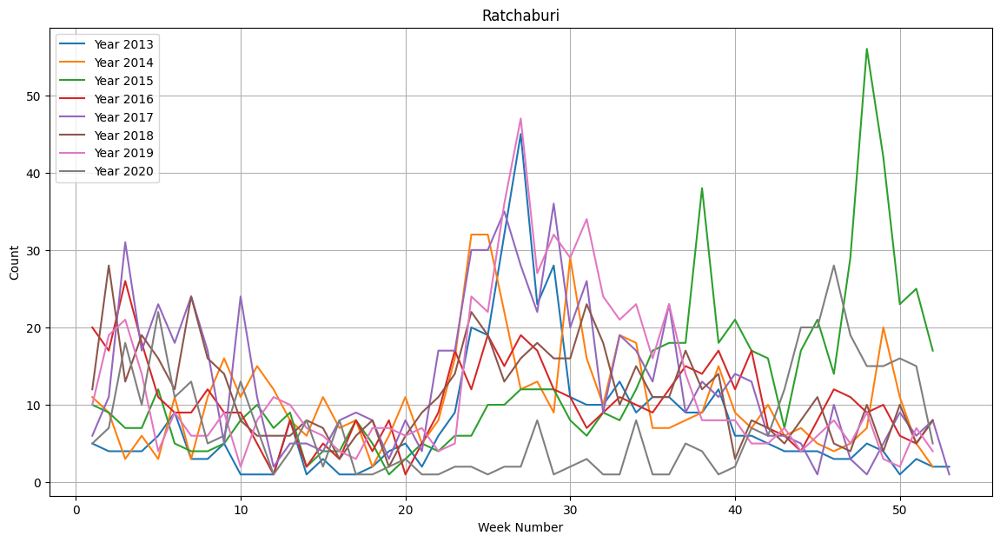

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155426"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.24 GB / 52.96 GB (94.9%)
Disk Space Avail:   46.30 GB / 78.19 GB (59.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 7.29181
[1000]	valid_set's rmse: 6.03744
[2000]	valid_set's rmse: 5.82428


	-5.8022	 = Validation score   (-root_mean_squared_error)
	0.7s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 5.82235


	-5.3538	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.0773	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-7.5933	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.2383	 = Validation score   (-root_mean_squared_error)
	0.18s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-8.5267	 = Validation score   (-root_mean_squared_error)
	0.61s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-5.6737	 = Validation score   (-root_mean_squared_error)
	0.56s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.667, 'XGBoost': 0.333}
	-5.0209	 = V


RMSE: 5.9871252340905965


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-5.593292,-5.593292,-5.077264,root_mean_squared_error,0.056242,0.049640,0.475529,0.056242,0.049640,0.475529,1,True,6
1,RandomForestMSE,-5.740842,-5.740842,-5.353771,root_mean_squared_error,0.062452,0.046746,0.459729,0.062452,0.046746,0.459729,1,True,5
2,WeightedEnsemble_L2,-5.987125,-5.987125,-5.020888,root_mean_squared_error,0.068377,0.052700,0.674438,0.002687,0.000423,0.014326,2,True,11
3,LightGBM,-6.166596,-6.166596,-5.802197,root_mean_squared_error,0.012903,0.002478,0.699917,0.012903,0.002478,0.699917,1,True,4
4,LightGBMLarge,-6.230801,-6.230801,-5.673717,root_mean_squared_error,0.010020,0.001223,0.559184,0.010020,0.001223,0.559184,1,True,10
5,KNeighborsDist,-7.094849,-7.094849,-6.959138,root_mean_squared_error,0.014145,0.013888,0.003949,0.014145,0.013888,0.003949,1,True,2
6,XGBoost,-7.127142,-7.127142,-5.238323,root_mean_squared_error,0.009449,0.002636,0.184583,0.009449,0.002636,0.184583,1,True,8
7,LightGBMXT,-7.129999,-7.129999,-7.275760,root_mean_squared_error,0.003827,0.001180,0.346247,0.003827,0.001180,0.346247,1,True,3
8,KNeighborsUnif,-7.341857,-7.341857,-7.163506,root_mean_squared_error,0.014710,0.013961,0.004206,0.014710,0.013961,0.004206,1,True,1
9,NeuralNetFastAI,-7.659477,-7.659477,-7.593340,root_mean_squared_error,0.011503,0.006097,0.492598,0.011503,0.006097,0.492598,1,True,7


In [61]:
#*
province = "Ratchaburi"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Ratchaburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Ratchaburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Ratchaburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Kanchanaburi

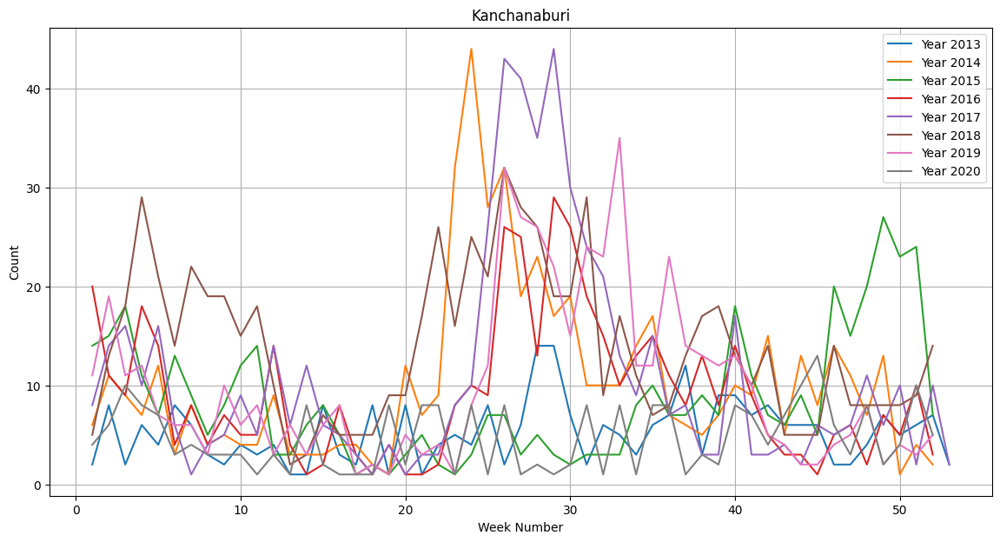

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155431"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.30 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.29 GB / 78.19 GB (59.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.51704
[2000]	valid_set's rmse: 5.36529


	-5.3249	 = Validation score   (-root_mean_squared_error)
	0.64s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[3000]	valid_set's rmse: 5.33112


	-4.4918	 = Validation score   (-root_mean_squared_error)
	0.31s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.2494	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.0227	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.9233	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.2117	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.4099	 = Validation score   (-root_mean_squared_error)
	4.31s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.0801	 = Validation score   (-root_mean_squared_error)
	0.41s	 = Training   


RMSE: 6.67740614140352


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-6.206505,-6.206505,-4.022708,root_mean_squared_error,0.057857,0.047321,0.470620,0.057857,0.047321,0.470620,1,True,6
1,WeightedEnsemble_L2,-6.677406,-6.677406,-3.943597,root_mean_squared_error,0.082658,0.054578,5.372655,0.003143,0.000384,0.014225,2,True,11
2,LightGBMLarge,-6.713135,-6.713135,-4.080070,root_mean_squared_error,0.007353,0.001008,0.414718,0.007353,0.001008,0.414718,1,True,10
3,RandomForestMSE,-6.863964,-6.863964,-4.249354,root_mean_squared_error,0.063354,0.047172,0.465537,0.063354,0.047172,0.465537,1,True,5
4,XGBoost,-7.014488,-7.014488,-4.211664,root_mean_squared_error,0.008997,0.002552,0.159890,0.008997,0.002552,0.159890,1,True,8
5,LightGBM,-7.566827,-7.566827,-4.491753,root_mean_squared_error,0.003372,0.000922,0.311549,0.003372,0.000922,0.311549,1,True,4
6,LightGBMXT,-7.656042,-7.656042,-5.324934,root_mean_squared_error,0.011128,0.002336,0.644148,0.011128,0.002336,0.644148,1,True,3
7,NeuralNetTorch,-8.065895,-8.065895,-4.409871,root_mean_squared_error,0.005309,0.003313,4.313203,0.005309,0.003313,4.313203,1,True,9
8,NeuralNetFastAI,-8.200455,-8.200455,-5.923330,root_mean_squared_error,0.011730,0.006036,0.479650,0.011730,0.006036,0.479650,1,True,7
9,KNeighborsDist,-8.439102,-8.439102,-5.375634,root_mean_squared_error,0.013928,0.013764,0.003804,0.013928,0.013764,0.003804,1,True,2


In [62]:
#*
province = "Kanchanaburi"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Kanchanaburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Kanchanaburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Kanchanaburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Suphan Buri

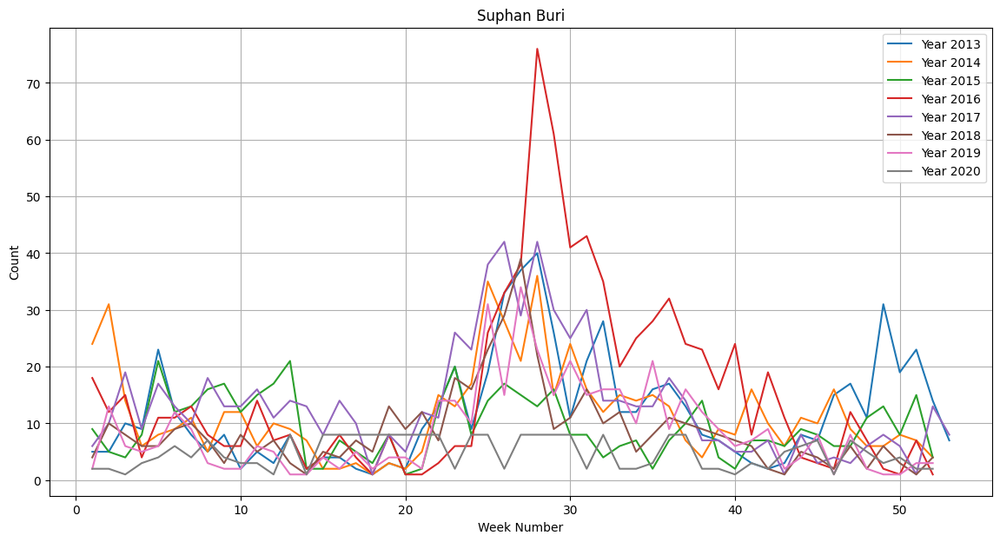

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155440"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.27 GB / 78.19 GB (59.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.67854
[2000]	valid_set's rmse: 5.49461


	-5.4525	 = Validation score   (-root_mean_squared_error)
	0.55s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...
	-5.2717	 = Validation score   (-root_mean_squared_error)
	0.32s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.2737	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.06s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-5.2183	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.5622	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.0282	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.9209	 = Validation score   (-root_mean_squared_error)
	3.64s	 = Training   runt


RMSE: 4.794184458062974


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,-4.501386,-4.501386,-4.851558,root_mean_squared_error,0.006699,0.010325,0.375781,0.006699,0.010325,0.375781,1,True,10
1,XGBoost,-4.600234,-4.600234,-5.028209,root_mean_squared_error,0.008576,0.002481,0.137992,0.008576,0.002481,0.137992,1,True,8
2,WeightedEnsemble_L2,-4.794184,-4.794184,-4.696408,root_mean_squared_error,0.017443,0.013945,4.028828,0.005380,0.000396,0.014804,2,True,11
3,ExtraTreesMSE,-4.815550,-4.815550,-5.218296,root_mean_squared_error,0.058626,0.047032,0.494186,0.058626,0.047032,0.494186,1,True,6
4,RandomForestMSE,-4.966127,-4.966127,-5.273673,root_mean_squared_error,0.058620,0.058684,0.486713,0.058620,0.058684,0.486713,1,True,5
5,LightGBM,-5.346980,-5.346980,-5.271711,root_mean_squared_error,0.002885,0.010995,0.322942,0.002885,0.010995,0.322942,1,True,4
6,NeuralNetTorch,-5.640024,-5.640024,-4.920866,root_mean_squared_error,0.005364,0.003224,3.638243,0.005364,0.003224,3.638243,1,True,9
7,LightGBMXT,-5.720622,-5.720622,-5.452546,root_mean_squared_error,0.008756,0.002707,0.552022,0.008756,0.002707,0.552022,1,True,3
8,KNeighborsDist,-5.906687,-5.906687,-6.337310,root_mean_squared_error,0.014074,0.013595,0.004130,0.014074,0.013595,0.004130,1,True,2
9,KNeighborsUnif,-6.068262,-6.068262,-6.321865,root_mean_squared_error,0.014580,0.014113,0.004926,0.014580,0.014113,0.004926,1,True,1


In [63]:
#*
province = "Suphan Buri"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Suphan_Buri = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Suphan_Buri.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Suphan_Buri.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Pathom

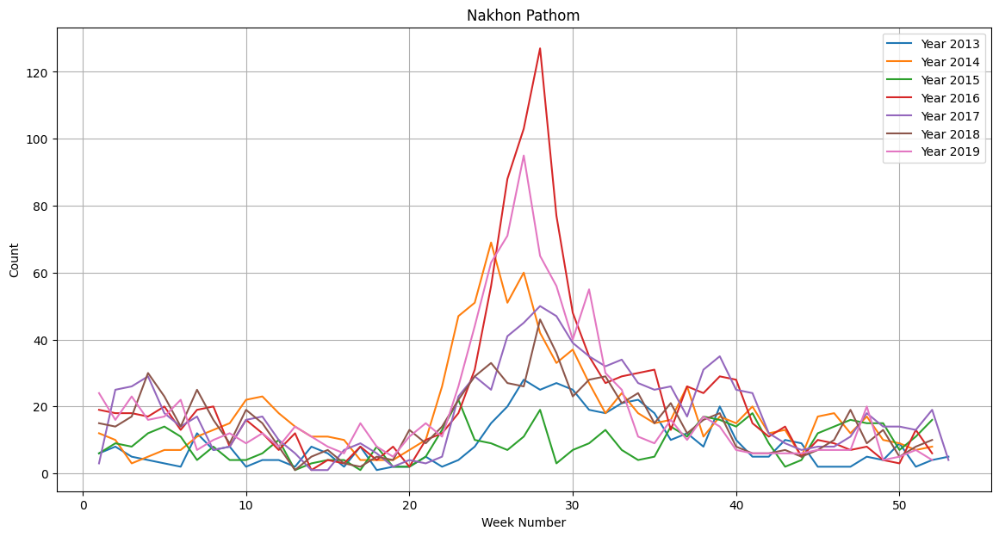

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155448"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.33 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.25 GB / 78.19 GB (59.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F


RMSE: 8.896198958690979


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-7.496548,-7.496548,-6.446350,root_mean_squared_error,0.009521,0.002460,0.179998,0.009521,0.002460,0.179998,1,True,8
1,LightGBMLarge,-7.706085,-7.706085,-7.329490,root_mean_squared_error,0.012115,0.001203,0.506459,0.012115,0.001203,0.506459,1,True,10
2,ExtraTreesMSE,-7.803862,-7.803862,-6.250054,root_mean_squared_error,0.056754,0.049496,0.468521,0.056754,0.049496,0.468521,1,True,6
3,RandomForestMSE,-8.289317,-8.289317,-7.085270,root_mean_squared_error,0.058438,0.048345,0.477445,0.058438,0.048345,0.477445,1,True,5
4,WeightedEnsemble_L2,-8.896199,-8.896199,-5.720537,root_mean_squared_error,0.158291,0.110087,3.339334,0.004081,0.000411,0.014308,2,True,11
5,LightGBM,-11.930694,-11.930694,-7.540804,root_mean_squared_error,0.001293,0.002774,0.267056,0.001293,0.002774,0.267056,1,True,4
6,KNeighborsDist,-12.128594,-12.128594,-8.637976,root_mean_squared_error,0.014240,0.013896,0.004833,0.014240,0.013896,0.004833,1,True,2
7,KNeighborsUnif,-12.288668,-12.288668,-8.839817,root_mean_squared_error,0.014452,0.014911,0.003652,0.014452,0.014911,0.003652,1,True,1
8,LightGBMXT,-12.483087,-12.483087,-7.914277,root_mean_squared_error,0.002284,0.007133,0.278822,0.002284,0.007133,0.278822,1,True,3
9,NeuralNetTorch,-13.039266,-13.039266,-7.896141,root_mean_squared_error,0.005274,0.003426,3.090029,0.005274,0.003426,3.090029,1,True,9


In [64]:
#*
province = "Nakhon Pathom"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Pathom = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Pathom.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Pathom.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Samut Sakhon

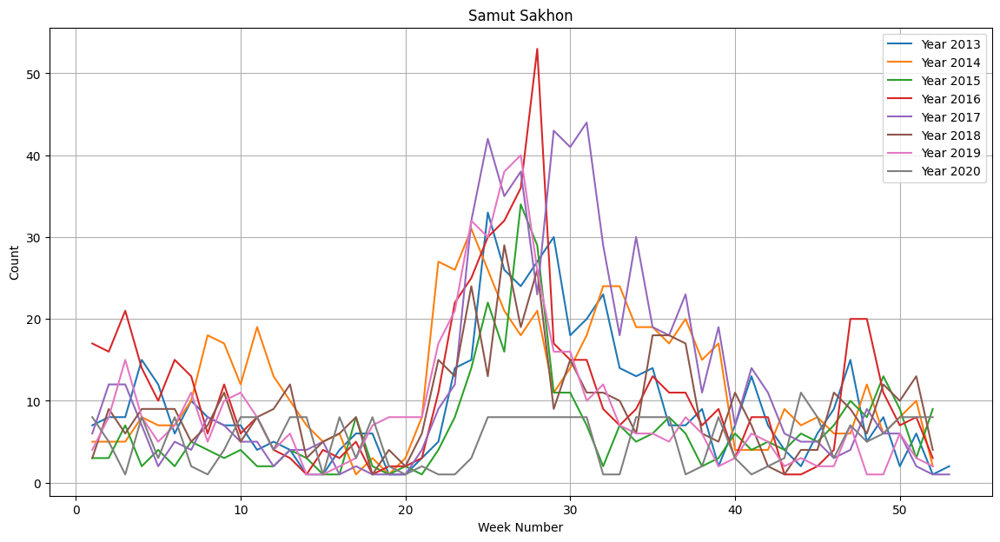

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155456"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.24 GB / 78.19 GB (59.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.29156
[2000]	valid_set's rmse: 5.07799
[3000]	valid_set's rmse: 5.00363


	-4.9944	 = Validation score   (-root_mean_squared_error)
	0.66s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[4000]	valid_set's rmse: 5.00511


	-4.6623	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 4.72008


	-4.2531	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.2047	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.5994	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.3668	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.2229	 = Validation score   (-root_mean_squared_error)
	3.6s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.8397	 = Validation score   (-root_mean_squared_error)
	0.43s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 1.0}
	-3.8397	 = Validation score   (-ro


RMSE: 4.596189361292357


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.472237,-4.472237,-4.204676,root_mean_squared_error,0.058580,0.046728,0.455460,0.058580,0.046728,0.455460,1,True,6
1,LightGBMLarge,-4.596189,-4.596189,-3.839712,root_mean_squared_error,0.007727,0.001090,0.434510,0.007727,0.001090,0.434510,1,True,10
2,WeightedEnsemble_L2,-4.596189,-4.596189,-3.839712,root_mean_squared_error,0.009596,0.001486,0.448471,0.001868,0.000396,0.013960,2,True,11
3,XGBoost,-4.665364,-4.665364,-4.366835,root_mean_squared_error,0.009278,0.002499,0.162170,0.009278,0.002499,0.162170,1,True,8
4,RandomForestMSE,-4.732611,-4.732611,-4.253134,root_mean_squared_error,0.058247,0.049751,0.461478,0.058247,0.049751,0.461478,1,True,5
5,LightGBM,-4.934952,-4.934952,-4.662272,root_mean_squared_error,0.006094,0.001376,0.396441,0.006094,0.001376,0.396441,1,True,4
6,NeuralNetTorch,-5.272685,-5.272685,-5.222894,root_mean_squared_error,0.005701,0.003487,3.601105,0.005701,0.003487,3.601105,1,True,9
7,LightGBMXT,-5.604525,-5.604525,-4.994412,root_mean_squared_error,0.014241,0.002588,0.658704,0.014241,0.002588,0.658704,1,True,3
8,KNeighborsDist,-5.645688,-5.645688,-5.190483,root_mean_squared_error,0.013873,0.013920,0.004487,0.013873,0.013920,0.004487,1,True,2
9,KNeighborsUnif,-5.652770,-5.652770,-5.249307,root_mean_squared_error,0.014404,0.016545,0.004071,0.014404,0.016545,0.004071,1,True,1


In [65]:
#*
province = "Samut Sakhon"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Samut_Sakhon = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Samut_Sakhon.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Samut_Sakhon.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Samut Songkhram

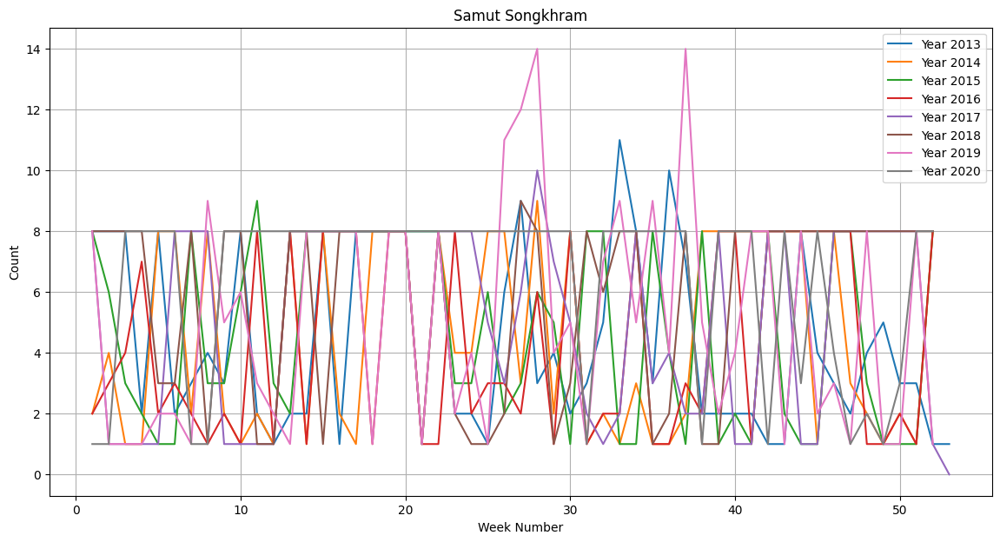

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155504"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.22 GB / 78.19 GB (59.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 3.08812


	-3.0803	 = Validation score   (-root_mean_squared_error)
	0.31s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-3.2305	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.1602	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-3.2039	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.2164	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.2768	 = Validation score   (-root_mean_squared_error)
	0.64s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.1937	 = Validation score   (-root_mean_squared_error)
	0.37s	 = Training   


RMSE: 3.3178486706368284


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-3.254079,-3.254079,-3.216380,root_mean_squared_error,0.009660,0.002228,0.138037,0.009660,0.002228,0.138037,1,True,8
1,WeightedEnsemble_L2,-3.317849,-3.317849,-3.047391,root_mean_squared_error,0.074934,0.065877,1.826449,0.003027,0.000434,0.013665,2,True,11
2,NeuralNetFastAI,-3.330891,-3.330891,-3.203922,root_mean_squared_error,0.012207,0.006661,0.449623,0.012207,0.006661,0.449623,1,True,7
3,LightGBMXT,-3.348104,-3.348104,-3.086842,root_mean_squared_error,0.004524,0.001323,0.366161,0.004524,0.001323,0.366161,1,True,3
4,LightGBM,-3.353225,-3.353225,-3.080305,root_mean_squared_error,0.002001,0.011977,0.307760,0.002001,0.011977,0.307760,1,True,4
5,LightGBMLarge,-3.360216,-3.360216,-3.193688,root_mean_squared_error,0.010768,0.000909,0.368810,0.010768,0.000909,0.368810,1,True,10
6,ExtraTreesMSE,-3.466915,-3.466915,-3.160200,root_mean_squared_error,0.059633,0.048861,0.497009,0.059633,0.048861,0.497009,1,True,6
7,NeuralNetTorch,-3.534872,-3.534872,-3.276798,root_mean_squared_error,0.005749,0.003281,0.641854,0.005749,0.003281,0.641854,1,True,9
8,RandomForestMSE,-3.548092,-3.548092,-3.230544,root_mean_squared_error,0.056598,0.048674,0.476580,0.056598,0.048674,0.476580,1,True,5
9,KNeighborsUnif,-3.567245,-3.567245,-3.570526,root_mean_squared_error,0.014523,0.014808,0.004646,0.014523,0.014808,0.004646,1,True,1


In [66]:
#*
province = "Samut Songkhram"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Samut_Songkhram = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Samut_Songkhram.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Samut_Songkhram.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phetchaburi

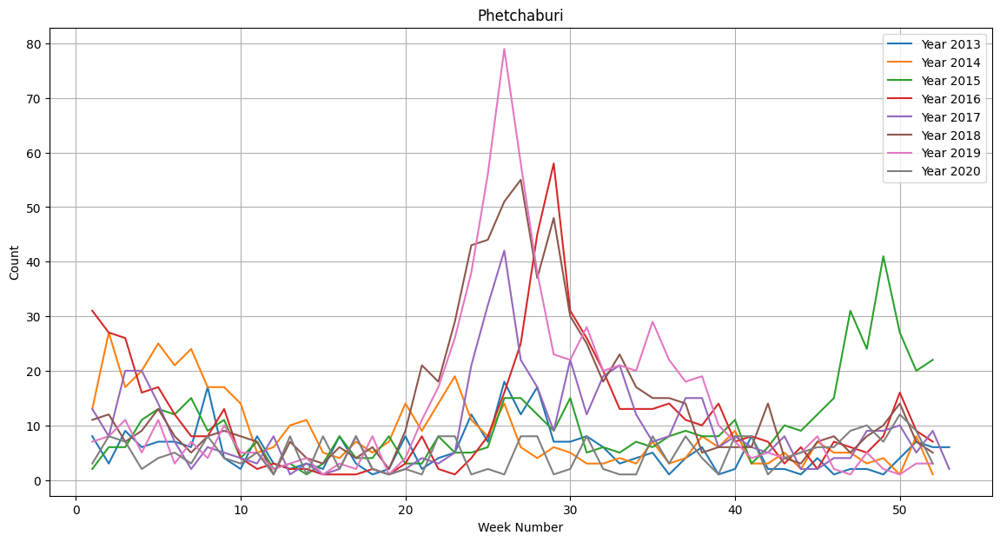

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155508"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.33 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.21 GB / 78.19 GB (59.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 7.99077
[2000]	valid_set's rmse: 7.7457
[3000]	valid_set's rmse: 7.67091
[4000]	valid_set's rmse: 7.61927
[5000]	valid_set's rmse: 7.61503


	-7.6156	 = Validation score   (-root_mean_squared_error)
	0.82s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 5.35904
[2000]	valid_set's rmse: 4.74616
[3000]	valid_set's rmse: 4.59501
[4000]	valid_set's rmse: 4.56982
[5000]	valid_set's rmse: 4.54583
[6000]	valid_set's rmse: 4.51912
[7000]	valid_set's rmse: 4.52966


	-4.5083	 = Validation score   (-root_mean_squared_error)
	1.42s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.3593	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.6971	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-8.6764	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.113	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.0263	 = Validation score   (-root_mean_squared_error)
	4.31s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.3343	 = Validation score   (-root_mean_squared_error)
	0.63s	 = Training   


RMSE: 4.91742565067919


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.684826,-4.684826,-3.697103,root_mean_squared_error,0.060656,0.047730,0.475053,0.060656,0.047730,0.475053,1,True,6
1,WeightedEnsemble_L2,-4.917426,-4.917426,-3.633374,root_mean_squared_error,0.123928,0.055943,2.063630,0.004598,0.000474,0.014180,2,True,11
2,RandomForestMSE,-5.444150,-5.444150,-4.359254,root_mean_squared_error,0.063789,0.046329,0.474385,0.063789,0.046329,0.474385,1,True,5
3,XGBoost,-5.462175,-5.462175,-4.112952,root_mean_squared_error,0.009621,0.002631,0.152013,0.009621,0.002631,0.152013,1,True,8
4,NeuralNetTorch,-5.473443,-5.473443,-6.026276,root_mean_squared_error,0.006010,0.003936,4.311759,0.006010,0.003936,4.311759,1,True,9
5,LightGBMLarge,-5.579532,-5.579532,-4.334334,root_mean_squared_error,0.017927,0.009008,0.630447,0.017927,0.009008,0.630447,1,True,10
6,LightGBM,-6.507718,-6.507718,-4.508350,root_mean_squared_error,0.049053,0.005107,1.422383,0.049053,0.005107,1.422383,1,True,4
7,LightGBMXT,-7.245018,-7.245018,-7.615585,root_mean_squared_error,0.021177,0.003909,0.819932,0.021177,0.003909,0.819932,1,True,3
8,KNeighborsDist,-7.627353,-7.627353,-6.747792,root_mean_squared_error,0.015051,0.013939,0.003901,0.015051,0.013939,0.003901,1,True,2
9,NeuralNetFastAI,-7.709111,-7.709111,-8.676438,root_mean_squared_error,0.011992,0.006198,0.477781,0.011992,0.006198,0.477781,1,True,7


In [67]:
#*
province = "Phetchaburi"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phetchaburi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phetchaburi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phetchaburi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Prachuap Khiri Khan

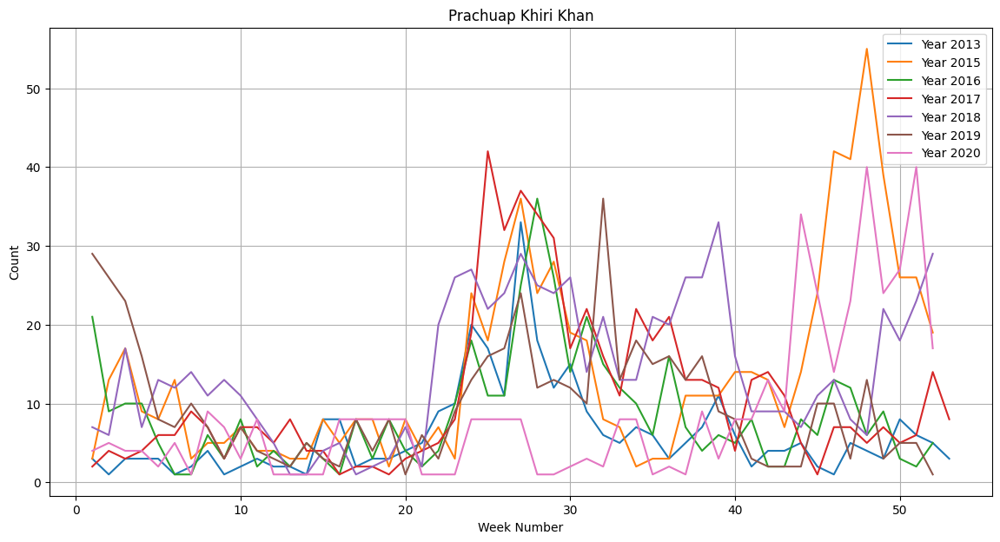

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155519"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.33 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.18 GB / 78.19 GB (59.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.10933
[2000]	valid_set's rmse: 5.04381


	-4.7144	 = Validation score   (-root_mean_squared_error)
	0.35s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.2038	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.1839	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.2613	 = Validation score   (-root_mean_squared_error)
	1.79s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.4004	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.7468	 = Validation score   (-root_mean_squared_error)
	3.77s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.4573	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   r


RMSE: 6.219526766900077


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.923342,-4.923342,-4.183941,root_mean_squared_error,0.061332,0.046846,0.493543,0.061332,0.046846,0.493543,1,True,6
1,RandomForestMSE,-5.253121,-5.253121,-4.203818,root_mean_squared_error,0.058034,0.048610,0.498210,0.058034,0.048610,0.498210,1,True,5
2,XGBoost,-5.841998,-5.841998,-4.400359,root_mean_squared_error,0.008511,0.002594,0.143849,0.008511,0.002594,0.143849,1,True,8
3,LightGBMLarge,-5.905550,-5.905550,-4.457272,root_mean_squared_error,0.010321,0.001034,0.384582,0.010321,0.001034,0.384582,1,True,10
4,LightGBM,-6.020780,-6.020780,-4.714403,root_mean_squared_error,0.003487,0.001119,0.348458,0.003487,0.001119,0.348458,1,True,4
5,WeightedEnsemble_L2,-6.219527,-6.219527,-3.557394,root_mean_squared_error,0.083232,0.061531,6.070034,0.002797,0.000440,0.014041,2,True,11
6,LightGBMXT,-6.877368,-6.877368,-5.047304,root_mean_squared_error,0.008748,0.001836,0.509411,0.008748,0.001836,0.509411,1,True,3
7,NeuralNetTorch,-7.142815,-7.142815,-3.746844,root_mean_squared_error,0.005246,0.003550,3.770384,0.005246,0.003550,3.770384,1,True,9
8,NeuralNetFastAI,-7.719707,-7.719707,-4.261270,root_mean_squared_error,0.017154,0.008931,1.787398,0.017154,0.008931,1.787398,1,True,7
9,KNeighborsDist,-8.100524,-8.100524,-5.976435,root_mean_squared_error,0.014297,0.014292,0.004535,0.014297,0.014292,0.004535,1,True,2


In [68]:
#*
province = "Prachuap Khiri Khan"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Prachuap_Khiri_Khan = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Prachuap_Khiri_Khan.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Prachuap_Khiri_Khan.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Nakhon Si Thammarat

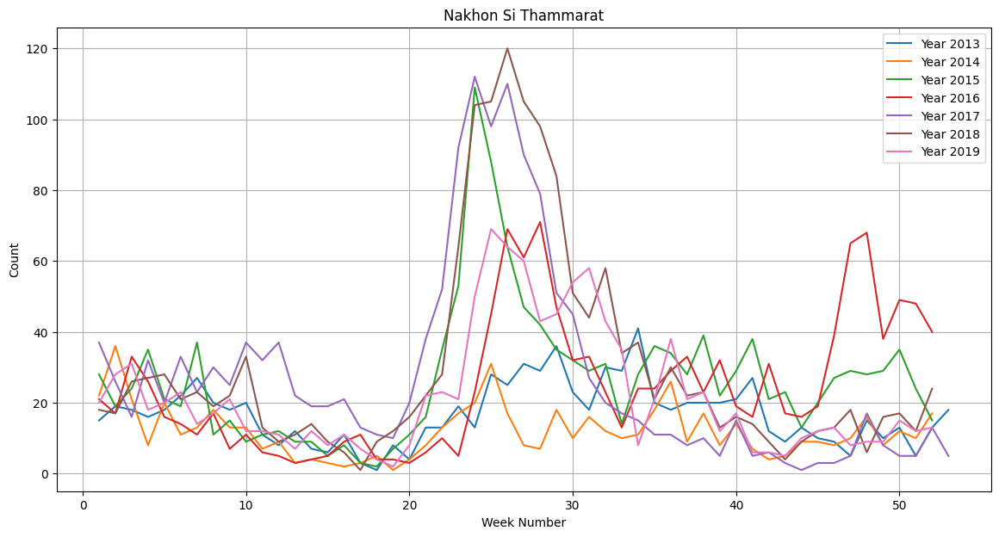

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155528"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.17 GB / 78.19 GB (59.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 12.3257
[2000]	valid_set's rmse: 11.3878
[3000]	valid_set's rmse: 11.0816
[4000]	valid_set's rmse: 11.0119
[5000]	valid_set's rmse: 11.1166


	-11.0489	 = Validation score   (-root_mean_squared_error)
	0.83s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 8.53105
[2000]	valid_set's rmse: 8.04741
[3000]	valid_set's rmse: 7.86182
[4000]	valid_set's rmse: 7.94883


	-7.8479	 = Validation score   (-root_mean_squared_error)
	0.86s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-7.8597	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-8.0213	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.573	 = Validation score   (-root_mean_squared_error)
	1.77s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-9.1544	 = Validation score   (-root_mean_squared_error)
	0.2s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.8698	 = Validation score   (-root_mean_squared_error)
	4.86s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-7.5822	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   r


RMSE: 9.219175949927125


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForestMSE,-8.214611,-8.214611,-7.859690,root_mean_squared_error,0.061822,0.047050,0.492789,0.061822,0.047050,0.492789,1,True,5
1,XGBoost,-8.389973,-8.389973,-9.154390,root_mean_squared_error,0.012067,0.003655,0.195799,0.012067,0.003655,0.195799,1,True,8
2,ExtraTreesMSE,-8.402889,-8.402889,-8.021313,root_mean_squared_error,0.062854,0.048899,0.494467,0.062854,0.048899,0.494467,1,True,6
3,LightGBMXT,-8.990631,-8.990631,-11.048929,root_mean_squared_error,0.016016,0.014199,0.832791,0.016016,0.014199,0.832791,1,True,3
4,WeightedEnsemble_L2,-9.219176,-9.219176,-6.644629,root_mean_squared_error,0.103077,0.057135,6.695709,0.003727,0.000474,0.014235,2,True,11
5,LightGBM,-9.340487,-9.340487,-7.847851,root_mean_squared_error,0.016170,0.004986,0.855439,0.016170,0.004986,0.855439,1,True,4
6,LightGBMLarge,-9.450365,-9.450365,-7.582197,root_mean_squared_error,0.015102,0.001133,0.468399,0.015102,0.001133,0.468399,1,True,10
7,NeuralNetTorch,-10.118631,-10.118631,-6.869807,root_mean_squared_error,0.006256,0.003492,4.864847,0.006256,0.003492,4.864847,1,True,9
8,KNeighborsDist,-11.907179,-11.907179,-10.917293,root_mean_squared_error,0.014674,0.014312,0.004506,0.014674,0.014312,0.004506,1,True,2
9,KNeighborsUnif,-12.432629,-12.432629,-11.431120,root_mean_squared_error,0.015216,0.014129,0.005270,0.015216,0.014129,0.005270,1,True,1


In [69]:
#*
province = "Nakhon Si Thammarat"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Nakhon_Si_Thammarat = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Nakhon_Si_Thammarat.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Nakhon_Si_Thammarat.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Krabi

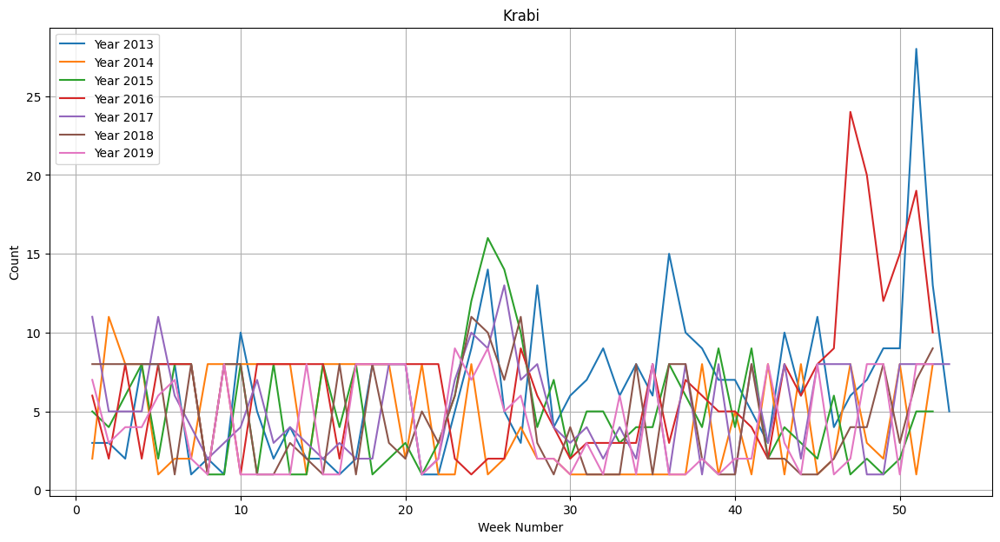

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155539"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.15 GB / 78.19 GB (59.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.55013
[2000]	valid_set's rmse: 4.43049
[3000]	valid_set's rmse: 4.34597
[4000]	valid_set's rmse: 4.2851
[5000]	valid_set's rmse: 4.25542
[6000]	valid_set's rmse: 4.24209
[7000]	valid_set's rmse: 4.2232
[8000]	valid_set's rmse: 4.22356
[9000]	valid_set's rmse: 4.23165


	-4.2256	 = Validation score   (-root_mean_squared_error)
	1.24s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-4.0212	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 4.06506


	-4.1941	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.2192	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.3907	 = Validation score   (-root_mean_squared_error)
	1.74s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.209	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.9201	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.2799	 = Validation score   (-root_mean_squared_error)
	0.45s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBM': 0.733, 'RandomForestMSE': 0.267}
	-3.9942	 =


RMSE: 3.630385827362823


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-3.450441,-3.450441,-4.209005,root_mean_squared_error,0.010444,0.002527,0.153335,0.010444,0.002527,0.153335,1,True,8
1,ExtraTreesMSE,-3.506852,-3.506852,-4.219237,root_mean_squared_error,0.057363,0.046808,0.486549,0.057363,0.046808,0.486549,1,True,6
2,LightGBMXT,-3.596208,-3.596208,-4.225616,root_mean_squared_error,0.024750,0.010949,1.237183,0.024750,0.010949,1.237183,1,True,3
3,LightGBM,-3.625129,-3.625129,-4.021155,root_mean_squared_error,0.007792,0.009945,0.402436,0.007792,0.009945,0.402436,1,True,4
4,WeightedEnsemble_L2,-3.630386,-3.630386,-3.994209,root_mean_squared_error,0.069777,0.057390,0.938411,0.002583,0.000399,0.014309,2,True,11
5,LightGBMLarge,-3.742510,-3.742510,-4.279949,root_mean_squared_error,0.010069,0.001099,0.448447,0.010069,0.001099,0.448447,1,True,10
6,RandomForestMSE,-3.837515,-3.837515,-4.194074,root_mean_squared_error,0.059401,0.047045,0.521665,0.059401,0.047045,0.521665,1,True,5
7,NeuralNetFastAI,-3.864263,-3.864263,-4.390669,root_mean_squared_error,0.018351,0.009520,1.737363,0.018351,0.009520,1.737363,1,True,7
8,NeuralNetTorch,-3.890116,-3.890116,-4.920104,root_mean_squared_error,0.006213,0.003347,0.511639,0.006213,0.003347,0.511639,1,True,9
9,KNeighborsUnif,-3.940023,-3.940023,-4.765768,root_mean_squared_error,0.014735,0.014261,0.005208,0.014735,0.014261,0.005208,1,True,1


In [70]:
#*
province = "Krabi"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Krabi = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Krabi.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Krabi.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phang Nga

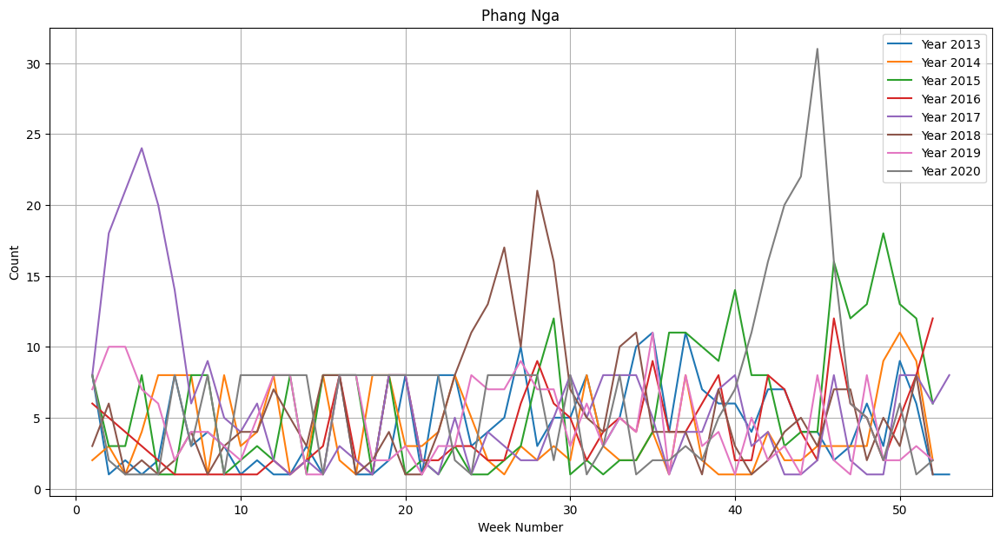

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155546"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.14 GB / 78.19 GB (59.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.28872
[2000]	valid_set's rmse: 4.10794
[3000]	valid_set's rmse: 4.0271
[4000]	valid_set's rmse: 4.00157
[5000]	valid_set's rmse: 3.98101
[6000]	valid_set's rmse: 3.97834
[7000]	valid_set's rmse: 3.97942
[8000]	valid_set's rmse: 3.98474


	-3.9721	 = Validation score   (-root_mean_squared_error)
	1.64s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.3682	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.0948	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.4046	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.8658	 = Validation score   (-root_mean_squared_error)
	0.23s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.6853	 = Validation score   (-root_mean_squared_error)
	0.57s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...


[1000]	valid_set's rmse: 3.90079
[2000]	valid_set's rmse: 3.85129
[3000]	valid_set's rmse: 3.85017


	-3.8468	 = Validation score   (-root_mean_squared_error)
	1.73s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 0.429, 'XGBoost': 0.286, 'LightGBM': 0.19, 'ExtraTreesMSE': 0.095}
	-3.7634	 = Validation score   (-root_mean_squared_error)
	0.01s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 6.86s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 981.6 rows/s (67 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("AutogluonModels/ag-20240803_155546")



RMSE: 3.48083277749657


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.156791,-3.156791,-4.094813,root_mean_squared_error,0.064141,0.047481,0.500357,0.064141,0.047481,0.500357,1,True,6
1,XGBoost,-3.347105,-3.347105,-3.865757,root_mean_squared_error,0.013604,0.002757,0.229018,0.013604,0.002757,0.229018,1,True,8
2,RandomForestMSE,-3.358796,-3.358796,-4.368173,root_mean_squared_error,0.067299,0.048131,0.510880,0.067299,0.048131,0.510880,1,True,5
3,KNeighborsDist,-3.464772,-3.464772,-5.346947,root_mean_squared_error,0.015257,0.014087,0.004361,0.015257,0.014087,0.004361,1,True,2
4,WeightedEnsemble_L2,-3.480833,-3.480833,-3.763395,root_mean_squared_error,0.188412,0.068258,4.118011,0.006629,0.000415,0.014589,2,True,11
5,KNeighborsUnif,-3.551391,-3.551391,-5.445908,root_mean_squared_error,0.014492,0.014386,0.004287,0.014492,0.014386,0.004287,1,True,1
6,LightGBM,-3.714861,-3.714861,-3.972068,root_mean_squared_error,0.055724,0.007374,1.639266,0.055724,0.007374,1.639266,1,True,4
7,NeuralNetFastAI,-4.039186,-4.039186,-5.404555,root_mean_squared_error,0.013165,0.006321,0.509756,0.013165,0.006321,0.509756,1,True,7
8,LightGBMLarge,-4.098433,-4.098433,-3.846798,root_mean_squared_error,0.048313,0.010232,1.734782,0.048313,0.010232,1.734782,1,True,10
9,LightGBMXT,-4.139159,-4.139159,-5.504911,root_mean_squared_error,0.008192,0.001002,0.301907,0.008192,0.001002,0.301907,1,True,3


In [71]:
#*
province = "Phang Nga"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phang_Nga = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phang_Nga.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phang_Nga.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phuket

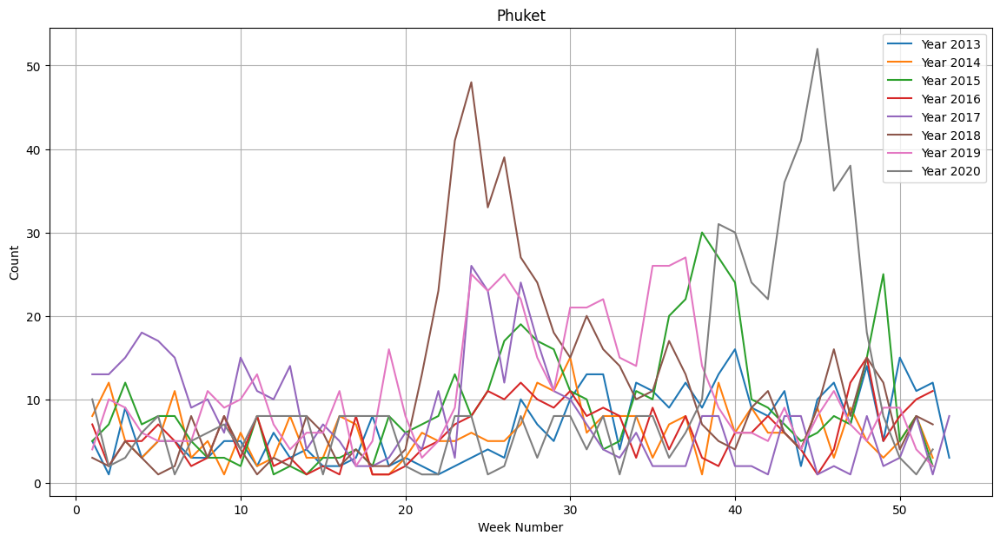

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155554"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.11 GB / 78.19 GB (59.0%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 6.66001
[2000]	valid_set's rmse: 6.56206
[3000]	valid_set's rmse: 6.48846
[4000]	valid_set's rmse: 6.48292


	-6.482	 = Validation score   (-root_mean_squared_error)
	0.81s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 5.20603
[2000]	valid_set's rmse: 4.86537
[3000]	valid_set's rmse: 4.69502
[4000]	valid_set's rmse: 4.68731


	-4.6701	 = Validation score   (-root_mean_squared_error)
	0.95s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-5.2247	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.7958	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.6933	 = Validation score   (-root_mean_squared_error)
	0.51s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.5403	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.0228	 = Validation score   (-root_mean_squared_error)
	3.99s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.9168	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   ru


RMSE: 5.265380505321653


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-5.119276,-5.119276,-4.795760,root_mean_squared_error,0.064509,0.049531,0.492086,0.064509,0.049531,0.492086,1,True,6
1,WeightedEnsemble_L2,-5.265381,-5.265381,-4.617346,root_mean_squared_error,0.085470,0.053078,1.451684,0.003019,0.000409,0.014044,2,True,11
2,LightGBM,-5.521724,-5.521724,-4.670068,root_mean_squared_error,0.017942,0.003139,0.945554,0.017942,0.003139,0.945554,1,True,4
3,RandomForestMSE,-5.602520,-5.602520,-5.224691,root_mean_squared_error,0.060531,0.049204,0.495939,0.060531,0.049204,0.495939,1,True,5
4,LightGBMLarge,-5.707400,-5.707400,-4.916829,root_mean_squared_error,0.008886,0.001178,0.497051,0.008886,0.001178,0.497051,1,True,10
5,NeuralNetTorch,-6.085120,-6.085120,-6.022803,root_mean_squared_error,0.005786,0.003549,3.986396,0.005786,0.003549,3.986396,1,True,9
6,XGBoost,-6.321801,-6.321801,-5.540271,root_mean_squared_error,0.009519,0.002691,0.158696,0.009519,0.002691,0.158696,1,True,8
7,KNeighborsDist,-6.992358,-6.992358,-6.321772,root_mean_squared_error,0.014555,0.014830,0.004824,0.014555,0.014830,0.004824,1,True,2
8,LightGBMXT,-7.388507,-7.388507,-6.481970,root_mean_squared_error,0.016435,0.002732,0.809485,0.016435,0.002732,0.809485,1,True,3
9,KNeighborsUnif,-7.389246,-7.389246,-6.486542,root_mean_squared_error,0.014648,0.015448,0.005765,0.014648,0.015448,0.005765,1,True,1


In [72]:
#*
province = "Phuket"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phuket = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phuket.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phuket.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Surat Thani

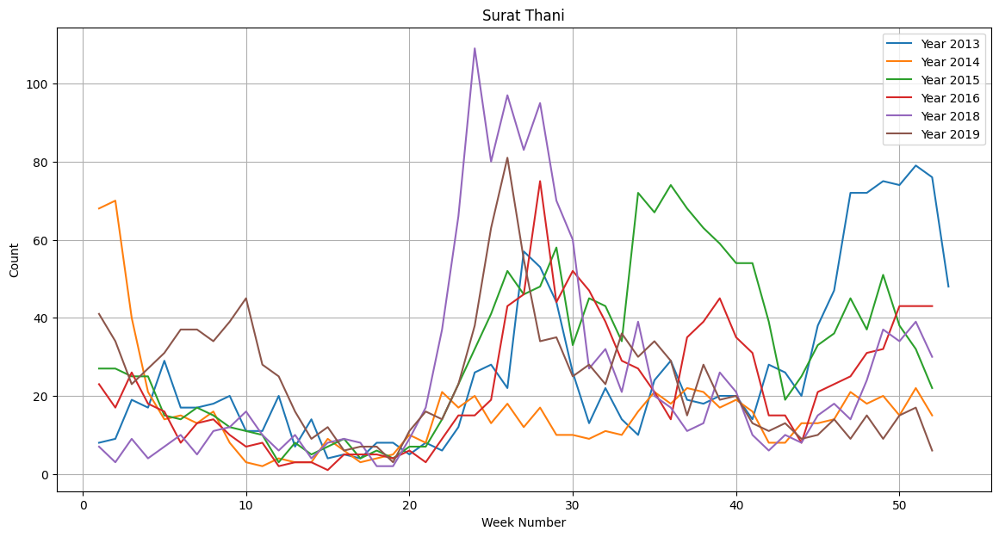

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155603"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.32 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.09 GB / 78.19 GB (58.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 11.5599
[2000]	valid_set's rmse: 11.2299
[3000]	valid_set's rmse: 11.0521
[4000]	valid_set's rmse: 10.932
[5000]	valid_set's rmse: 10.8016
[6000]	valid_set's rmse: 10.6892
[7000]	valid_set's rmse: 10.6373
[8000]	valid_set's rmse: 10.5642
[9000]	valid_set's rmse: 10.5856
[10000]	valid_set's rmse: 10.567


	-10.5673	 = Validation score   (-root_mean_squared_error)
	1.37s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 8.50309
[2000]	valid_set's rmse: 8.1629


	-8.12	 = Validation score   (-root_mean_squared_error)
	0.61s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-8.7216	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-7.6053	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-13.8384	 = Validation score   (-root_mean_squared_error)
	1.56s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-8.4297	 = Validation score   (-root_mean_squared_error)
	0.37s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-6.5376	 = Validation score   (-root_mean_squared_error)
	7.22s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-8.4168	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   ru


RMSE: 6.137177691147416


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-6.137178,-6.137178,-6.136536,root_mean_squared_error,0.051325,0.017453,8.123248,0.003437,0.000440,0.014357,2,True,11
1,NeuralNetTorch,-6.531067,-6.531067,-6.537611,root_mean_squared_error,0.007026,0.003843,7.224553,0.007026,0.003843,7.224553,1,True,9
2,ExtraTreesMSE,-6.875335,-6.875335,-7.605303,root_mean_squared_error,0.058937,0.048172,0.485844,0.058937,0.048172,0.485844,1,True,6
3,LightGBM,-8.339660,-8.339660,-8.119976,root_mean_squared_error,0.018601,0.003821,0.607461,0.018601,0.003821,0.607461,1,True,4
4,RandomForestMSE,-8.560748,-8.560748,-8.721613,root_mean_squared_error,0.063540,0.046078,0.500634,0.063540,0.046078,0.500634,1,True,5
5,LightGBMLarge,-8.915981,-8.915981,-8.416821,root_mean_squared_error,0.019544,0.009840,0.517682,0.019544,0.009840,0.517682,1,True,10
6,LightGBMXT,-9.093221,-9.093221,-10.567272,root_mean_squared_error,0.043660,0.010194,1.367305,0.043660,0.010194,1.367305,1,True,3
7,XGBoost,-9.559226,-9.559226,-8.429699,root_mean_squared_error,0.021317,0.003330,0.366656,0.021317,0.003330,0.366656,1,True,8
8,NeuralNetFastAI,-10.814575,-10.814575,-13.838427,root_mean_squared_error,0.015460,0.008485,1.559689,0.015460,0.008485,1.559689,1,True,7
9,KNeighborsDist,-11.675653,-11.675653,-13.333712,root_mean_squared_error,0.014522,0.013828,0.004172,0.014522,0.013828,0.004172,1,True,2


In [73]:
#*
province = "Surat Thani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Surat_Thani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Surat_Thani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Surat_Thani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Ranong

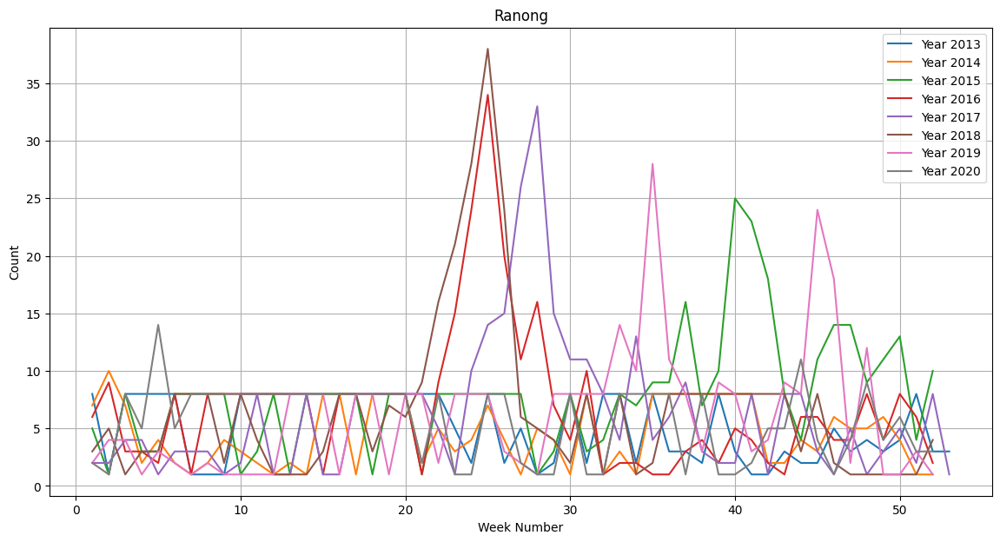

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155617"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.07 GB / 78.19 GB (58.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.06285
[2000]	valid_set's rmse: 4.87587
[3000]	valid_set's rmse: 4.78307
[4000]	valid_set's rmse: 4.73644
[5000]	valid_set's rmse: 4.71621
[6000]	valid_set's rmse: 4.70744
[7000]	valid_set's rmse: 4.70806
[8000]	valid_set's rmse: 4.70244
[9000]	valid_set's rmse: 4.70954


	-4.7037	 = Validation score   (-root_mean_squared_error)
	1.3s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[10000]	valid_set's rmse: 4.73042


	-4.6034	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 4.61245


	-4.3085	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.0975	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.1801	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.3753	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.3523	 = Validation score   (-root_mean_squared_error)
	1.17s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.3963	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 1.0}
	-4.0975	 = Validation score   (-


RMSE: 3.5370765485472693


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-3.537077,-3.537077,-4.097547,root_mean_squared_error,0.062799,0.048726,0.474481,0.062799,0.048726,0.474481,1,True,6
1,WeightedEnsemble_L2,-3.537077,-3.537077,-4.097547,root_mean_squared_error,0.065282,0.049191,0.490063,0.002483,0.000465,0.015583,2,True,11
2,XGBoost,-3.721537,-3.721537,-4.375332,root_mean_squared_error,0.010807,0.002702,0.146595,0.010807,0.002702,0.146595,1,True,8
3,LightGBMXT,-3.844556,-3.844556,-4.703708,root_mean_squared_error,0.045885,0.005787,1.296691,0.045885,0.005787,1.296691,1,True,3
4,RandomForestMSE,-3.907612,-3.907612,-4.308525,root_mean_squared_error,0.059525,0.047570,0.500736,0.059525,0.047570,0.500736,1,True,5
5,LightGBMLarge,-3.976945,-3.976945,-4.396254,root_mean_squared_error,0.016947,0.010055,0.473034,0.016947,0.010055,0.473034,1,True,10
6,LightGBM,-3.987592,-3.987592,-4.603446,root_mean_squared_error,0.026279,0.001915,0.469050,0.026279,0.001915,0.469050,1,True,4
7,NeuralNetFastAI,-4.156168,-4.156168,-5.180138,root_mean_squared_error,0.012445,0.006931,0.476148,0.012445,0.006931,0.476148,1,True,7
8,KNeighborsDist,-4.210063,-4.210063,-5.230577,root_mean_squared_error,0.014182,0.015569,0.005717,0.014182,0.015569,0.005717,1,True,2
9,NeuralNetTorch,-4.316995,-4.316995,-5.352269,root_mean_squared_error,0.006561,0.003596,1.173524,0.006561,0.003596,1.173524,1,True,9


In [74]:
#*
province = "Ranong"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Ranong = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Ranong.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Ranong.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Chumphon

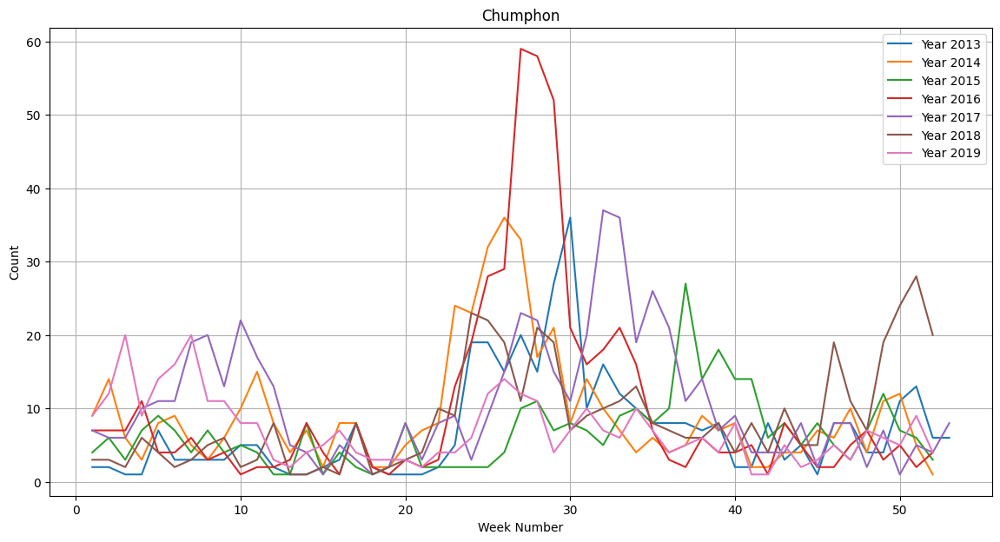

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155624"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.30 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.05 GB / 78.19 GB (58.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.88211


	-5.8049	 = Validation score   (-root_mean_squared_error)
	0.34s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.1487	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.7157	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.1909	 = Validation score   (-root_mean_squared_error)
	1.82s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.6227	 = Validation score   (-root_mean_squared_error)
	0.3s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-5.7512	 = Validation score   (-root_mean_squared_error)
	3.8s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-5.0447	 = Validation score   (-root_mean_squared_error)
	0.38s	 = Training   runt


RMSE: 6.112417766452195


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,XGBoost,-5.291725,-5.291725,-5.622695,root_mean_squared_error,0.016320,0.003822,0.304963,0.016320,0.003822,0.304963,1,True,8
1,ExtraTreesMSE,-5.423804,-5.423804,-4.715690,root_mean_squared_error,0.061097,0.047831,0.497579,0.061097,0.047831,0.497579,1,True,6
2,WeightedEnsemble_L2,-6.112418,-6.112418,-4.148390,root_mean_squared_error,0.122200,0.098515,1.010207,0.002174,0.000419,0.014457,2,True,11
3,RandomForestMSE,-6.150163,-6.150163,-4.148675,root_mean_squared_error,0.058928,0.050266,0.498171,0.058928,0.050266,0.498171,1,True,5
4,LightGBM,-6.367425,-6.367425,-5.804907,root_mean_squared_error,0.002762,0.001134,0.338201,0.002762,0.001134,0.338201,1,True,4
5,LightGBMLarge,-6.468973,-6.468973,-5.044702,root_mean_squared_error,0.011103,0.000915,0.381888,0.011103,0.000915,0.381888,1,True,10
6,NeuralNetTorch,-6.525914,-6.525914,-5.751189,root_mean_squared_error,0.005960,0.003340,3.795854,0.005960,0.003340,3.795854,1,True,9
7,LightGBMXT,-6.628897,-6.628897,-5.828454,root_mean_squared_error,0.009843,0.001517,0.448560,0.009843,0.001517,0.448560,1,True,3
8,KNeighborsDist,-7.381975,-7.381975,-6.015997,root_mean_squared_error,0.013942,0.013909,0.004784,0.013942,0.013909,0.004784,1,True,2
9,KNeighborsUnif,-7.457302,-7.457302,-6.074174,root_mean_squared_error,0.014519,0.014417,0.004870,0.014519,0.014417,0.004870,1,True,1


In [75]:
#*
province = "Chumphon"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Chumphon = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Chumphon.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Chumphon.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Songkhla

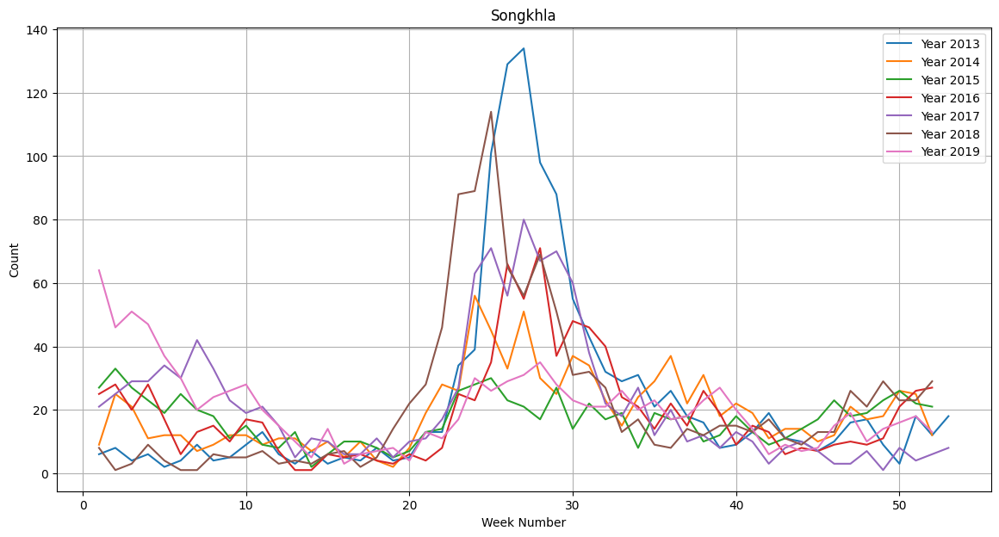

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155633"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.30 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.03 GB / 78.19 GB (58.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 10.6112
[2000]	valid_set's rmse: 10.3229
[3000]	valid_set's rmse: 10.2764


	-10.214	 = Validation score   (-root_mean_squared_error)
	0.72s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[4000]	valid_set's rmse: 10.2226
[1000]	valid_set's rmse: 9.24561
[2000]	valid_set's rmse: 8.83889
[3000]	valid_set's rmse: 8.61658
[4000]	valid_set's rmse: 8.67115


	-8.5689	 = Validation score   (-root_mean_squared_error)
	0.83s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-8.2452	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-6.9222	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-11.3242	 = Validation score   (-root_mean_squared_error)
	1.7s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-8.437	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-7.2031	 = Validation score   (-root_mean_squared_error)
	4.13s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-9.0338	 = Validation score   (-root_mean_squared_error)
	0.39s	 = Training   r


RMSE: 8.192380983732399


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-7.216180,-7.216180,-6.922223,root_mean_squared_error,0.057165,0.049775,0.459975,0.057165,0.049775,0.459975,1,True,6
1,RandomForestMSE,-7.995317,-7.995317,-8.245171,root_mean_squared_error,0.060471,0.047686,0.474500,0.060471,0.047686,0.474500,1,True,5
2,WeightedEnsemble_L2,-8.192381,-8.192381,-6.407956,root_mean_squared_error,0.142519,0.109741,6.780168,0.003157,0.000400,0.014797,2,True,11
3,XGBoost,-8.627097,-8.627097,-8.436972,root_mean_squared_error,0.008534,0.002440,0.136517,0.008534,0.002440,0.136517,1,True,8
4,LightGBMLarge,-9.269977,-9.269977,-9.033795,root_mean_squared_error,0.012340,0.010235,0.388748,0.012340,0.010235,0.388748,1,True,10
5,NeuralNetTorch,-9.453273,-9.453273,-7.203114,root_mean_squared_error,0.005007,0.003444,4.128542,0.005007,0.003444,4.128542,1,True,9
6,LightGBM,-9.861410,-9.861410,-8.568868,root_mean_squared_error,0.017106,0.004557,0.831139,0.017106,0.004557,0.831139,1,True,4
7,KNeighborsDist,-10.402734,-10.402734,-8.301184,root_mean_squared_error,0.013975,0.013880,0.003864,0.013975,0.013880,0.003864,1,True,2
8,KNeighborsUnif,-11.238183,-11.238183,-8.029733,root_mean_squared_error,0.014674,0.014425,0.004260,0.014674,0.014425,0.004260,1,True,1
9,LightGBMXT,-11.388897,-11.388897,-10.213970,root_mean_squared_error,0.013657,0.002418,0.721386,0.013657,0.002418,0.721386,1,True,3


In [76]:
#*
province = "Songkhla"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Songkhla = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Songkhla.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Songkhla.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Satun

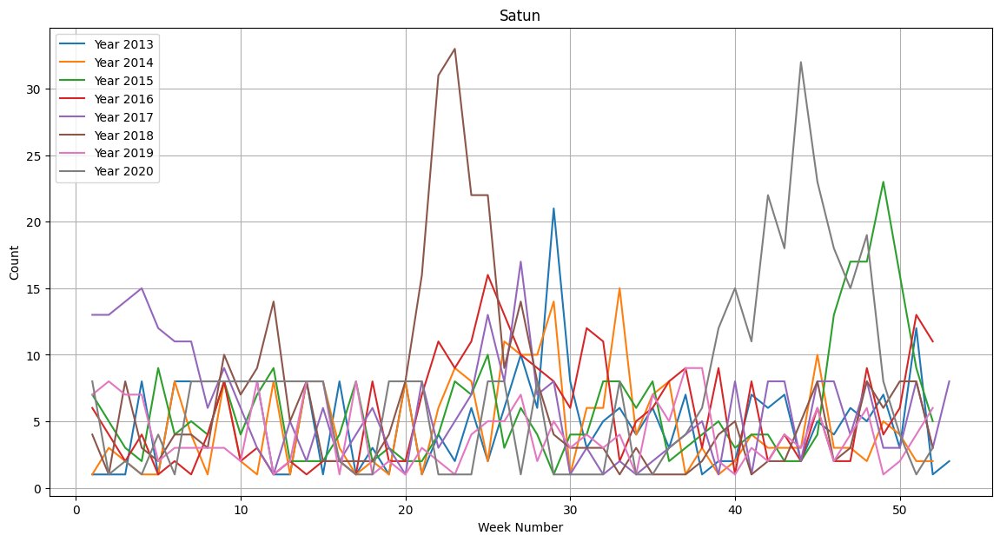

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155643"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.02 GB / 78.19 GB (58.9%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 4.24533


	-3.8456	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 3.89246


	-3.5988	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.4121	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-4.2187	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.4912	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.5287	 = Validation score   (-root_mean_squared_error)
	0.99s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.7925	 = Validation score   (-root_mean_squared_error)
	0.63s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.667, 'XGBoost': 0.333}
	-3.3862	 = V


RMSE: 4.058941239721519


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,ExtraTreesMSE,-4.010503,-4.010503,-3.412078,root_mean_squared_error,0.059361,0.047094,0.457862,0.059361,0.047094,0.457862,1,True,6
1,RandomForestMSE,-4.057950,-4.057950,-3.598800,root_mean_squared_error,0.059323,0.047038,0.469389,0.059323,0.047038,0.469389,1,True,5
2,WeightedEnsemble_L2,-4.058941,-4.058941,-3.386244,root_mean_squared_error,0.071192,0.050055,0.627562,0.002958,0.000402,0.014001,2,True,11
3,XGBoost,-4.389432,-4.389432,-3.491193,root_mean_squared_error,0.008873,0.002560,0.155699,0.008873,0.002560,0.155699,1,True,8
4,LightGBM,-4.590072,-4.590072,-3.845626,root_mean_squared_error,0.007048,0.001684,0.479475,0.007048,0.001684,0.479475,1,True,4
5,LightGBMLarge,-4.694333,-4.694333,-3.792486,root_mean_squared_error,0.014060,0.001726,0.631285,0.014060,0.001726,0.631285,1,True,10
6,KNeighborsDist,-4.950547,-4.950547,-4.380703,root_mean_squared_error,0.014254,0.013604,0.003724,0.014254,0.013604,0.003724,1,True,2
7,KNeighborsUnif,-5.072287,-5.072287,-4.505983,root_mean_squared_error,0.014337,0.017251,0.004440,0.014337,0.017251,0.004440,1,True,1
8,NeuralNetFastAI,-5.145799,-5.145799,-4.218744,root_mean_squared_error,0.011557,0.005869,0.470160,0.011557,0.005869,0.470160,1,True,7
9,LightGBMXT,-5.176548,-5.176548,-4.239892,root_mean_squared_error,0.004552,0.001166,0.365324,0.004552,0.001166,0.365324,1,True,3


In [77]:
#*
province = "Satun"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Satun = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Satun.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Satun.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Trang

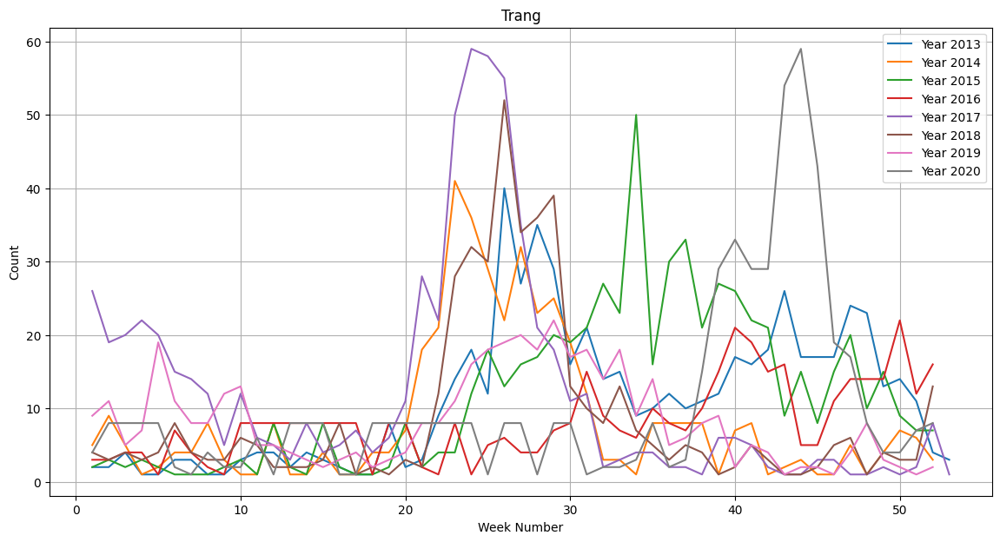

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155649"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   46.00 GB / 78.19 GB (58.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.64354
[2000]	valid_set's rmse: 5.13


	-4.9571	 = Validation score   (-root_mean_squared_error)
	0.75s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 5.00374


	-4.3132	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.227	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.7616	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-5.1296	 = Validation score   (-root_mean_squared_error)
	0.16s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-8.2168	 = Validation score   (-root_mean_squared_error)
	0.81s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.7676	 = Validation score   (-root_mean_squared_error)
	0.44s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'ExtraTreesMSE': 0.462, 'RandomForestMSE': 0.385, 'Light


RMSE: 6.62534554042965


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,RandomForestMSE,-6.408240,-6.408240,-4.313179,root_mean_squared_error,0.061158,0.046842,0.467312,0.061158,0.046842,0.467312,1,True,5
1,WeightedEnsemble_L2,-6.625346,-6.625346,-4.071534,root_mean_squared_error,0.146086,0.096740,1.696054,0.002696,0.000402,0.014356,2,True,11
2,LightGBM,-6.939335,-6.939335,-4.957092,root_mean_squared_error,0.024279,0.002574,0.748176,0.024279,0.002574,0.748176,1,True,4
3,ExtraTreesMSE,-7.002470,-7.002470,-4.226958,root_mean_squared_error,0.057953,0.046922,0.466210,0.057953,0.046922,0.466210,1,True,6
4,LightGBMLarge,-7.285261,-7.285261,-4.767571,root_mean_squared_error,0.008235,0.007448,0.442887,0.008235,0.007448,0.442887,1,True,10
5,XGBoost,-7.681098,-7.681098,-5.129629,root_mean_squared_error,0.008545,0.003196,0.162871,0.008545,0.003196,0.162871,1,True,8
6,KNeighborsDist,-9.272798,-9.272798,-7.559487,root_mean_squared_error,0.014000,0.013998,0.004062,0.014000,0.013998,0.004062,1,True,2
7,KNeighborsUnif,-9.659883,-9.659883,-7.578406,root_mean_squared_error,0.014266,0.013737,0.004275,0.014266,0.013737,0.004275,1,True,1
8,LightGBMXT,-9.860694,-9.860694,-6.575269,root_mean_squared_error,0.018829,0.001078,0.329234,0.018829,0.001078,0.329234,1,True,3
9,NeuralNetFastAI,-10.248451,-10.248451,-6.761627,root_mean_squared_error,0.011655,0.006709,0.495910,0.011655,0.006709,0.495910,1,True,7


In [78]:
#*
province = "Trang"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Trang = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Trang.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Trang.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Phatthalung

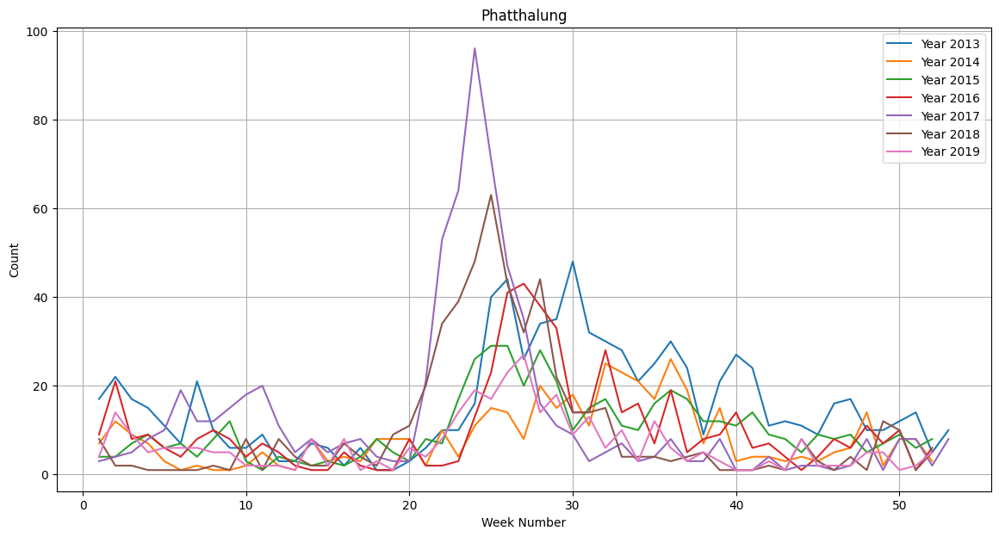

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155654"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   45.98 GB / 78.19 GB (58.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.81393
[1000]	valid_set's rmse: 5.52417
[2000]	valid_set's rmse: 5.13945


	-5.0777	 = Validation score   (-root_mean_squared_error)
	0.72s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[3000]	valid_set's rmse: 5.10663


	-5.0016	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.7765	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.4881	 = Validation score   (-root_mean_squared_error)
	1.71s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.98	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.9058	 = Validation score   (-root_mean_squared_error)
	3.54s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.5417	 = Validation score   (-root_mean_squared_error)
	0.4s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBMLarge': 0.35, 'RandomForestMSE': 0.3, 'NeuralNetF


RMSE: 5.027619864847653


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-5.027620,-5.027620,-4.284256,root_mean_squared_error,0.095927,0.061182,6.126582,0.003119,0.000403,0.013903,2,True,11
1,ExtraTreesMSE,-5.056240,-5.056240,-4.776456,root_mean_squared_error,0.056577,0.046463,0.457789,0.056577,0.046463,0.457789,1,True,6
2,XGBoost,-5.417817,-5.417817,-4.979956,root_mean_squared_error,0.008462,0.002295,0.136795,0.008462,0.002295,0.136795,1,True,8
3,RandomForestMSE,-5.433821,-5.433821,-5.001594,root_mean_squared_error,0.059998,0.048052,0.465368,0.059998,0.048052,0.465368,1,True,5
4,LightGBMLarge,-5.477509,-5.477509,-4.541695,root_mean_squared_error,0.011709,0.000921,0.399854,0.011709,0.000921,0.399854,1,True,10
5,LightGBM,-5.577046,-5.577046,-5.077706,root_mean_squared_error,0.012612,0.002288,0.724538,0.012612,0.002288,0.724538,1,True,4
6,NeuralNetTorch,-5.861602,-5.861602,-4.905831,root_mean_squared_error,0.004984,0.003421,3.536558,0.004984,0.003421,3.536558,1,True,9
7,KNeighborsDist,-6.738974,-6.738974,-5.209970,root_mean_squared_error,0.014206,0.013765,0.003856,0.014206,0.013765,0.003856,1,True,2
8,LightGBMXT,-6.949372,-6.949372,-5.799367,root_mean_squared_error,0.005212,0.001314,0.392497,0.005212,0.001314,0.392497,1,True,3
9,KNeighborsUnif,-6.970672,-6.970672,-5.372561,root_mean_squared_error,0.014491,0.013894,0.004482,0.014491,0.013894,0.004482,1,True,1


In [79]:
#*
province = "Phatthalung"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Phatthalung = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Phatthalung.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Phatthalung.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Pattani

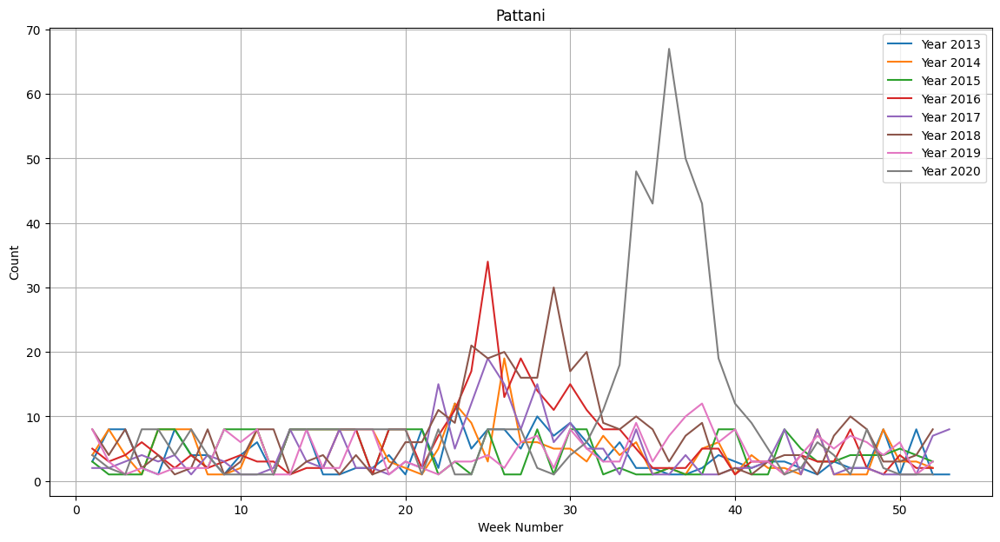

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155703"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   45.96 GB / 78.19 GB (58.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.66614
[2000]	valid_set's rmse: 5.39212
[3000]	valid_set's rmse: 5.29132
[4000]	valid_set's rmse: 5.22273
[5000]	valid_set's rmse: 5.16466
[6000]	valid_set's rmse: 5.14078
[7000]	valid_set's rmse: 5.14757
[8000]	valid_set's rmse: 5.13128
[9000]	valid_set's rmse: 5.14171
[10000]	valid_set's rmse: 5.1591


	-5.129	 = Validation score   (-root_mean_squared_error)
	1.4s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...
	-3.7144	 = Validation score   (-root_mean_squared_error)
	0.57s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...


[1000]	valid_set's rmse: 3.84551


	-4.003	 = Validation score   (-root_mean_squared_error)
	0.46s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.2718	 = Validation score   (-root_mean_squared_error)
	0.47s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-5.6327	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-3.922	 = Validation score   (-root_mean_squared_error)
	0.14s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-4.2427	 = Validation score   (-root_mean_squared_error)
	6.34s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.7669	 = Validation score   (-root_mean_squared_error)
	0.41s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ...
	Ensemble Weights: {'LightGBM': 0.5, 'LightGBMLarge': 0.389, 'LightGBMXT': 0.


RMSE: 4.470105758413418


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-3.849599,-3.849599,-4.242725,root_mean_squared_error,0.005421,0.003411,6.335898,0.005421,0.003411,6.335898,1,True,9
1,ExtraTreesMSE,-3.960193,-3.960193,-4.271823,root_mean_squared_error,0.059826,0.046887,0.468786,0.059826,0.046887,0.468786,1,True,6
2,RandomForestMSE,-4.306970,-4.306970,-4.002976,root_mean_squared_error,0.058599,0.048392,0.459163,0.058599,0.048392,0.459163,1,True,5
3,LightGBMXT,-4.446125,-4.446125,-5.128970,root_mean_squared_error,0.031527,0.012836,1.404214,0.031527,0.012836,1.404214,1,True,3
4,XGBoost,-4.456086,-4.456086,-3.921999,root_mean_squared_error,0.008584,0.002580,0.139383,0.008584,0.002580,0.139383,1,True,8
5,WeightedEnsemble_L2,-4.470106,-4.470106,-3.639721,root_mean_squared_error,0.115391,0.064512,2.861779,0.003119,0.000421,0.013916,2,True,11
6,KNeighborsDist,-4.477135,-4.477135,-4.805841,root_mean_squared_error,0.013885,0.013772,0.004500,0.013885,0.013772,0.004500,1,True,2
7,LightGBM,-4.503104,-4.503104,-3.714395,root_mean_squared_error,0.011382,0.001871,0.572985,0.011382,0.001871,0.572985,1,True,4
8,KNeighborsUnif,-4.521694,-4.521694,-5.034864,root_mean_squared_error,0.014273,0.014129,0.005052,0.014273,0.014129,0.005052,1,True,1
9,NeuralNetFastAI,-4.871846,-4.871846,-5.632704,root_mean_squared_error,0.011944,0.006065,0.490049,0.011944,0.006065,0.490049,1,True,7


In [80]:
#*
province = "Pattani"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019,2020] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Pattani = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Pattani.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Pattani.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Yala


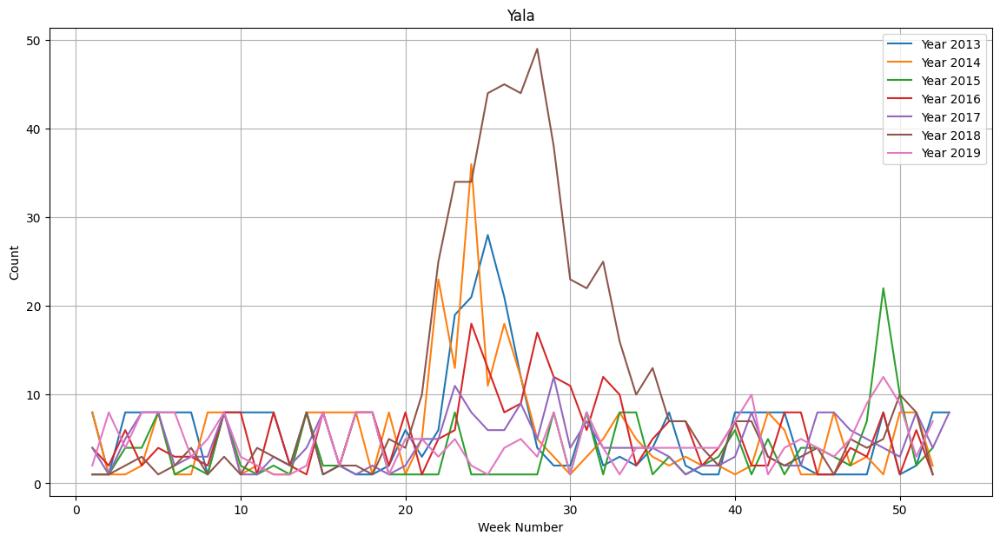

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155715"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   45.95 GB / 78.19 GB (58.8%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 7.05509
[2000]	valid_set's rmse: 6.92799


	-6.8964	 = Validation score   (-root_mean_squared_error)
	0.59s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: LightGBM ...


[3000]	valid_set's rmse: 6.90101


	-6.4652	 = Validation score   (-root_mean_squared_error)
	0.35s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.36	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-3.9249	 = Validation score   (-root_mean_squared_error)
	0.52s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-7.6867	 = Validation score   (-root_mean_squared_error)
	1.76s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.4355	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-8.8182	 = Validation score   (-root_mean_squared_error)
	0.55s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-3.6966	 = Validation score   (-root_mean_squared_error)
	0.48s	 = Training   ru


RMSE: 4.404534202722687


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,-4.404534,-4.404534,-3.651231,root_mean_squared_error,0.080840,0.052733,1.157597,0.003044,0.000452,0.015458,2,True,11
1,ExtraTreesMSE,-4.410649,-4.410649,-3.924927,root_mean_squared_error,0.058533,0.048577,0.517642,0.058533,0.048577,0.517642,1,True,6
2,LightGBMLarge,-4.524006,-4.524006,-3.696565,root_mean_squared_error,0.009907,0.001174,0.475562,0.009907,0.001174,0.475562,1,True,10
3,RandomForestMSE,-4.848109,-4.848109,-4.359993,root_mean_squared_error,0.061127,0.048786,0.499655,0.061127,0.048786,0.499655,1,True,5
4,XGBoost,-5.199398,-5.199398,-4.435523,root_mean_squared_error,0.009357,0.002530,0.148935,0.009357,0.002530,0.148935,1,True,8
5,LightGBM,-5.563266,-5.563266,-6.465183,root_mean_squared_error,0.004320,0.010138,0.351963,0.004320,0.010138,0.351963,1,True,4
6,LightGBMXT,-5.793228,-5.793228,-6.896383,root_mean_squared_error,0.009406,0.007604,0.593298,0.009406,0.007604,0.593298,1,True,3
7,KNeighborsUnif,-5.839798,-5.839798,-7.024268,root_mean_squared_error,0.014889,0.014139,0.004711,0.014889,0.014139,0.004711,1,True,1
8,KNeighborsDist,-5.848024,-5.848024,-6.722864,root_mean_squared_error,0.014557,0.013777,0.004323,0.014557,0.013777,0.004323,1,True,2
9,NeuralNetFastAI,-6.122361,-6.122361,-7.686687,root_mean_squared_error,0.017758,0.008797,1.763719,0.017758,0.008797,1.763719,1,True,7


In [81]:
#*
province = "Yala"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Yala = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Yala.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Yala.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<br>

## Narathiwat

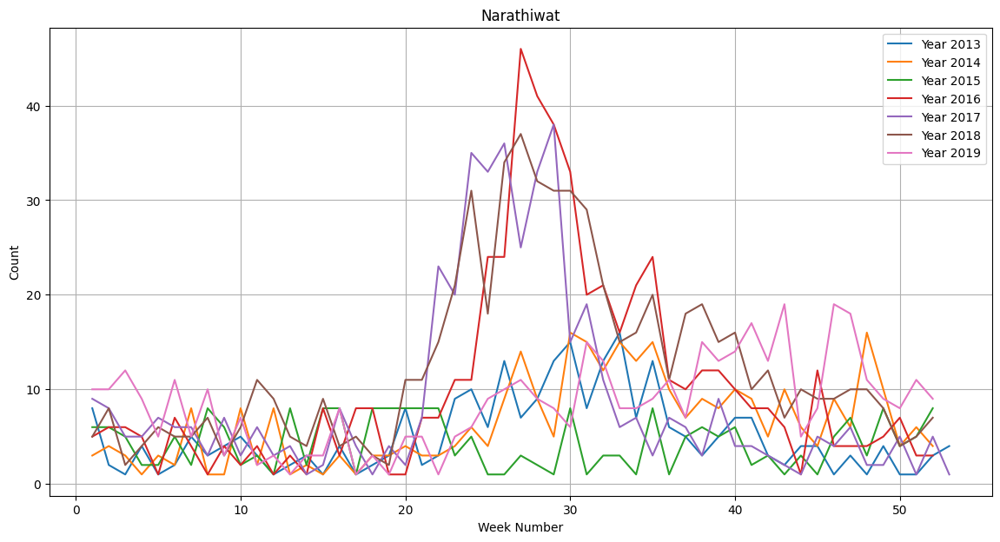

No path specified. Models will be saved in: "AutogluonModels/ag-20240803_155721"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.1.1
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          12
Memory Avail:       50.31 GB / 52.96 GB (95.0%)
Disk Space Avail:   45.93 GB / 78.19 GB (58.7%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets.
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='best_quality'   : Maximize accuracy. Default time_limit=3600.
	presets='high_quality'   : Strong accuracy with fast inference speed. Default time_limit=3600.
	presets='good_quality'   : Good accuracy with very fast inference speed. Default time_limit=3600.
	presets='medium_quality' : F

[1000]	valid_set's rmse: 5.84843
[2000]	valid_set's rmse: 5.78255
[3000]	valid_set's rmse: 5.75


	-5.7572	 = Validation score   (-root_mean_squared_error)
	0.65s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBM ...


[1000]	valid_set's rmse: 4.66856
[2000]	valid_set's rmse: 4.59439
[3000]	valid_set's rmse: 4.51987
[4000]	valid_set's rmse: 4.43792
[5000]	valid_set's rmse: 4.41421
[6000]	valid_set's rmse: 4.41641


	-4.4079	 = Validation score   (-root_mean_squared_error)
	1.18s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: RandomForestMSE ...
	-4.2267	 = Validation score   (-root_mean_squared_error)
	0.5s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: CatBoost ...
		
Fitting model: ExtraTreesMSE ...
	-4.1953	 = Validation score   (-root_mean_squared_error)
	0.49s	 = Training   runtime
	0.05s	 = Validation runtime
Fitting model: NeuralNetFastAI ...
	-6.0907	 = Validation score   (-root_mean_squared_error)
	1.77s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: XGBoost ...
	-4.468	 = Validation score   (-root_mean_squared_error)
	0.15s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: NeuralNetTorch ...
	-3.3582	 = Validation score   (-root_mean_squared_error)
	5.37s	 = Training   runtime
	0.0s	 = Validation runtime
Fitting model: LightGBMLarge ...
	-4.0301	 = Validation score   (-root_mean_squared_error)
	0.42s	 = Training   ru


RMSE: 3.6196155450344247


,model,score_test,root_mean_squared_error,score_val,eval_metric,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,NeuralNetTorch,-3.619616,-3.619616,-3.358184,root_mean_squared_error,0.005578,0.003357,5.374892,0.005578,0.003357,5.374892,1,True,9
1,WeightedEnsemble_L2,-3.619616,-3.619616,-3.358184,root_mean_squared_error,0.007598,0.003834,5.389346,0.002020,0.000477,0.014454,2,True,11
2,ExtraTreesMSE,-4.006170,-4.006170,-4.195271,root_mean_squared_error,0.060117,0.048877,0.486859,0.060117,0.048877,0.486859,1,True,6
3,RandomForestMSE,-4.198697,-4.198697,-4.226739,root_mean_squared_error,0.062440,0.047714,0.502791,0.062440,0.047714,0.502791,1,True,5
4,LightGBMLarge,-4.292443,-4.292443,-4.030108,root_mean_squared_error,0.007624,0.001029,0.423708,0.007624,0.001029,0.423708,1,True,10
5,LightGBM,-4.669735,-4.669735,-4.407920,root_mean_squared_error,0.024130,0.003901,1.180825,0.024130,0.003901,1.180825,1,True,4
6,XGBoost,-4.764421,-4.764421,-4.467968,root_mean_squared_error,0.008908,0.002546,0.145368,0.008908,0.002546,0.145368,1,True,8
7,KNeighborsDist,-5.330553,-5.330553,-5.323861,root_mean_squared_error,0.014029,0.013888,0.004455,0.014029,0.013888,0.004455,1,True,2
8,LightGBMXT,-5.348366,-5.348366,-5.757178,root_mean_squared_error,0.011678,0.002296,0.652752,0.011678,0.002296,0.652752,1,True,3
9,KNeighborsUnif,-5.523757,-5.523757,-5.314898,root_mean_squared_error,0.014741,0.014607,0.004659,0.014741,0.014607,0.004659,1,True,1


In [82]:
#*
province = "Narathiwat"
province_df = train_df[train_df['PROVINCE'] == province]
years = [2013,2014,2015,2016,2017,2018,2019] #* select year that is outliner
province_df = province_df[province_df['Year'].isin(years)]
pplot(province_df,province)

X = province_df[['Year','PROVINCE','Week_no']]
y = province_df['Count']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

train_data = X_train.copy()
train_data['Count'] = y_train
val_data = X_val.copy()
val_data['Count'] = y_val

#*
Narathiwat = TabularPredictor(label='Count', problem_type='regression', eval_metric='rmse').fit(train_data)
#*
leaderboard = Narathiwat.leaderboard(val_data, extra_metrics=['rmse'])
#*
y_pred = Narathiwat.predict(X_val)
rmse_value = rmse(y_val, y_pred)
print(f"\nRMSE: {rmse_value}")
pvrecord[province] = rmse_value
leaderboard

<hr><hr>

# Predict switching

In [83]:
# df = pd.read_csv("/content/sample_submission.csv")
# for idx,row in df[3:].iterrows():
#     data = test_df[test_df['_id']==row['_id']].drop(columns=['_id','Disease'])
#     # print(data.PROVINCE)
#     province = data.PROVINCE.iloc[0]
#     # print(province)
#     if province == "Bangkok":
#         df.at[idx,'Pred'] = Bangkok.predict(data)
#     elif province == "Samut Prakan":
#         df.at[idx,'Pred'] = Samut_Prakan.predict(data)
#     elif province == "Nonthaburi":
#         df.at[idx,'Pred'] = Nonthaburi.predict(data)
#     elif province == "Pathum Thani":
#         df.at[idx,'Pred'] = Pathum_Thani.predict(data)
#     elif province == "Phra Nakhon Si Ayutthaya":
#         df.at[idx,'Pred'] = Phra_Nakhon_Si_Ayutthaya.predict(data)
#     elif province == "Ang Thong":
#         df.at[idx,'Pred'] = Ang_Thong.predict(data)
#     elif province == "Lopburi":
#         df.at[idx,'Pred'] = Lopburi.predict(data)
#     elif province == "Sing Buri":
#         df.at[idx,'Pred'] = Sing_Buri.predict(data)
#     elif province == "Chainat":
#         df.at[idx,'Pred'] = Chainat.predict(data)
#     elif province == "Saraburi":
#         df.at[idx,'Pred'] = Saraburi.predict(data)
#     elif province == "Chonburi":
#         df.at[idx,'Pred'] = Chonburi.predict(data)
#     elif province == "Rayong":
#         df.at[idx,'Pred'] = Rayong.predict(data)
#     elif province == "Chanthaburi":
#         df.at[idx,'Pred'] = Chanthaburi.predict(data)
#     elif province == "Trat":
#         df.at[idx,'Pred'] = Trat.predict(data)
#     elif province == "Chachoengsao":
#         df.at[idx,'Pred'] = Chachoengsao.predict(data)
#     elif province == "Prachinburi":
#         df.at[idx,'Pred'] = Prachinburi.predict(data)
#     elif province == "Nakhon Nayok":
#         df.at[idx,'Pred'] = Nakhon_Nayok.predict(data)
#     elif province == "Sa Kaeo":
#         df.at[idx,'Pred'] = Sa_Kaeo.predict(data)
#     elif province == "Nakhon Ratchasima":
#         df.at[idx,'Pred'] = Nakhon_Ratchasima.predict(data)
#     elif province == "Buriram":
#         df.at[idx,'Pred'] = Buriram.predict(data)
#     elif province == "Surin":
#         df.at[idx,'Pred'] = Surin.predict(data)
#     elif province == "Sisaket":
#         df.at[idx,'Pred'] = Sisaket.predict(data)
#     elif province == "Ubon Ratchathani":
#         df.at[idx,'Pred'] = Ubon_Ratchathani.predict(data)
#     elif province == "Yasothon":
#         df.at[idx,'Pred'] = Yasothon.predict(data)
#     elif province == "Chaiyaphum":
#         df.at[idx,'Pred'] = Chaiyaphum.predict(data)
#     elif province == "Amnat Charoen":
#         df.at[idx,'Pred'] = Amnat_Charoen.predict(data)
#     elif province == "Bueng Kan":
#         df.at[idx,'Pred'] = Bueng_Kan.predict(data)
#     elif province == "Nong Bua Lamphu":
#         df.at[idx,'Pred'] = Nong_Bua_Lamphu.predict(data)
#     elif province == "Khon Kaen":
#         df.at[idx,'Pred'] = Khon_Kaen.predict(data)
#     elif province == "Udon Thani":
#         df.at[idx,'Pred'] = Udon_Thani.predict(data)
#     elif province == "Loei":
#         df.at[idx,'Pred'] = Loei.predict(data)
#     elif province == "Nong Khai":
#         df.at[idx,'Pred'] = Nong_Khai.predict(data)
#     elif province == "Maha Sarakham":
#         df.at[idx,'Pred'] = Maha_Sarakham.predict(data)
#     elif province == "Roi Et":
#         df.at[idx,'Pred'] = Roi_Et.predict(data)
#     elif province == "Kalasin":
#         df.at[idx,'Pred'] = Kalasin.predict(data)
#     elif province == "Sakon Nakhon":
#         df.at[idx,'Pred'] = Sakon_Nakhon.predict(data)
#     elif province == "Nakhon Phanom":
#         df.at[idx,'Pred'] = Nakhon_Phanom.predict(data)
#     elif province == "Mukdahan":
#         df.at[idx,'Pred'] = Mukdahan.predict(data)
#     elif province == "Chiang Mai":
#         df.at[idx,'Pred'] = Chiang_Mai.predict(data)
#     elif province == "Lamphun":
#         df.at[idx,'Pred'] = Lamphun.predict(data)
#     elif province == "Lampang":
#         df.at[idx,'Pred'] = Lampang.predict(data)
#     elif province == "Uttaradit":
#         df.at[idx,'Pred'] = Uttaradit.predict(data)
#     elif province == "Phrae":
#         df.at[idx,'Pred'] = Phrae.predict(data)
#     elif province == "Nan":
#         df.at[idx,'Pred'] = Nan.predict(data)
#     elif province == "Phayao":
#         df.at[idx,'Pred'] = Phayao.predict(data)
#     elif province == "Chiang Rai":
#         df.at[idx,'Pred'] = Chiang_Rai.predict(data)
#     elif province == "Mae Hong Son":
#         df.at[idx,'Pred'] = Mae_Hong_Son.predict(data)
#     elif province == "Nakhon Sawan":
#         df.at[idx,'Pred'] = Nakhon_Sawan.predict(data)
#     elif province == "Uthai Thani":
#         df.at[idx,'Pred'] = Uthai_Thani.predict(data)
#     elif province == "Kamphaeng Phet":
#         df.at[idx,'Pred'] = Kamphaeng_Phet.predict(data)
#     elif province == "Tak":
#         df.at[idx,'Pred'] = Tak.predict(data)
#     elif province == "Sukhothai":
#         df.at[idx,'Pred'] = Sukhothai.predict(data)
#     elif province == "Phitsanulok":
#         df.at[idx,'Pred'] = Phitsanulok.predict(data)
#     elif province == "Phichit":
#         df.at[idx,'Pred'] = Phichit.predict(data)
#     elif province == "Phetchabun":
#         df.at[idx,'Pred'] = Phetchabun.predict(data)
#     elif province == "Ratchaburi":
#         df.at[idx,'Pred'] = Ratchaburi.predict(data)
#     elif province == "Kanchanaburi":
#         df.at[idx,'Pred'] = Kanchanaburi.predict(data)
#     elif province == "Suphan Buri":
#         df.at[idx,'Pred'] = Suphan_Buri.predict(data)
#     elif province == "Nakhon Pathom":
#         df.at[idx,'Pred'] = Nakhon_Pathom.predict(data)
#     elif province == "Samut Sakhon":
#         df.at[idx,'Pred'] = Samut_Sakhon.predict(data)
#     elif province == "Samut Songkhram":
#         df.at[idx,'Pred'] = Samut_Songkhram.predict(data)
#     elif province == "Phetchaburi":
#         df.at[idx,'Pred'] = Phetchaburi.predict(data)
#     elif province == "Prachuap Khiri Khan":
#         df.at[idx,'Pred'] = Prachuap_Khiri_Khan.predict(data)
#     elif province == "Nakhon Si Thammarat":
#         df.at[idx,'Pred'] = Nakhon_Si_Thammarat.predict(data)
#     elif province == "Krabi":
#         df.at[idx,'Pred'] = Krabi.predict(data)
#     elif province == "Phang Nga":
#         df.at[idx,'Pred'] = Phang_Nga.predict(data)
#     elif province == "Phuket":
#         df.at[idx,'Pred'] = Phuket.predict(data)
#     elif province == "Surat Thani":
#         df.at[idx,'Pred'] = Surat_Thani.predict(data)
#     elif province == "Ranong":
#         df.at[idx,'Pred'] = Ranong.predict(data)
#     elif province == "Chumphon":
#         df.at[idx,'Pred'] = Chumphon.predict(data)
#     elif province == "Songkhla":
#         df.at[idx,'Pred'] = Songkhla.predict(data)
#     elif province == "Satun":
#         df.at[idx,'Pred'] = Satun.predict(data)
#     elif province == "Trang":
#         df.at[idx,'Pred'] = Trang.predict(data)
#     elif province == "Phatthalung":
#         df.at[idx,'Pred'] = Phatthalung.predict(data)
#     elif province == "Pattani":
#         df.at[idx,'Pred'] = Pattani.predict(data)
#     elif province == "Yala":
#         df.at[idx,'Pred'] = Yala.predict(data)
#     elif province == "Narathiwat":
#         df.at[idx,'Pred'] = Narathiwat.predict(data)
#     else:
#         print(f"\n\n\nData issue detected in row {idx}. Interrupting process.")
#         break
#         # df.at[idx,'Pred'] = "???"

In [84]:
df = pd.read_csv("/content/sample_submission.csv")
for idx,row in df[3:].iterrows():
    data = test_df[test_df['_id']==row['_id']].drop(columns=['_id','Disease'])
    # print(data.PROVINCE)
    province = data.PROVINCE.iloc[0]
    # print(province)
    if province == "Bangkok":
        result = Bangkok.predict(data)
    elif province == "Samut Prakan":
        result = Samut_Prakan.predict(data)
    elif province == "Nonthaburi":
        result = Nonthaburi.predict(data)
    elif province == "Pathum Thani":
        result = Pathum_Thani.predict(data)
    elif province == "Phra Nakhon Si Ayutthaya":
        result = Phra_Nakhon_Si_Ayutthaya.predict(data)
    elif province == "Ang Thong":
        result = Ang_Thong.predict(data)
    elif province == "Lopburi":
        result = Lopburi.predict(data)
    elif province == "Sing Buri":
        result = Sing_Buri.predict(data)
    elif province == "Chainat":
        result = Chainat.predict(data)
    elif province == "Saraburi":
        result = Saraburi.predict(data)
    elif province == "Chonburi":
        result = Chonburi.predict(data)
    elif province == "Rayong":
        result = Rayong.predict(data)
    elif province == "Chanthaburi":
        result = Chanthaburi.predict(data)
    elif province == "Trat":
        result = Trat.predict(data)
    elif province == "Chachoengsao":
        result = Chachoengsao.predict(data)
    elif province == "Prachinburi":
        result = Prachinburi.predict(data)
    elif province == "Nakhon Nayok":
        result = Nakhon_Nayok.predict(data)
    elif province == "Sa Kaeo":
        result = Sa_Kaeo.predict(data)
    elif province == "Nakhon Ratchasima":
        result = Nakhon_Ratchasima.predict(data)
    elif province == "Buriram":
        result = Buriram.predict(data)
    elif province == "Surin":
        result = Surin.predict(data)
    elif province == "Sisaket":
        result = Sisaket.predict(data)
    elif province == "Ubon Ratchathani":
        result = Ubon_Ratchathani.predict(data)
    elif province == "Yasothon":
        result = Yasothon.predict(data)
    elif province == "Chaiyaphum":
        result = Chaiyaphum.predict(data)
    elif province == "Amnat Charoen":
        result = Amnat_Charoen.predict(data)
    elif province == "Bueng Kan":
        result = Bueng_Kan.predict(data)
    elif province == "Nong Bua Lamphu":
        result = Nong_Bua_Lamphu.predict(data)
    elif province == "Khon Kaen":
        result = Khon_Kaen.predict(data)
    elif province == "Udon Thani":
        result = Udon_Thani.predict(data)
    elif province == "Loei":
        result = Loei.predict(data)
    elif province == "Nong Khai":
        result = Nong_Khai.predict(data)
    elif province == "Maha Sarakham":
        result = Maha_Sarakham.predict(data)
    elif province == "Roi Et":
        result = Roi_Et.predict(data)
    elif province == "Kalasin":
        result = Kalasin.predict(data)
    elif province == "Sakon Nakhon":
        result = Sakon_Nakhon.predict(data)
    elif province == "Nakhon Phanom":
        result = Nakhon_Phanom.predict(data)
    elif province == "Mukdahan":
        result = Mukdahan.predict(data)
    elif province == "Chiang Mai":
        result = Chiang_Mai.predict(data)
    elif province == "Lamphun":
        result = Lamphun.predict(data)
    elif province == "Lampang":
        result = Lampang.predict(data)
    elif province == "Uttaradit":
        result = Uttaradit.predict(data)
    elif province == "Phrae":
        result = Phrae.predict(data)
    elif province == "Nan":
        result = Nan.predict(data)
    elif province == "Phayao":
        result = Phayao.predict(data)
    elif province == "Chiang Rai":
        result = Chiang_Rai.predict(data)
    elif province == "Mae Hong Son":
        result = Mae_Hong_Son.predict(data)
    elif province == "Nakhon Sawan":
        result = Nakhon_Sawan.predict(data)
    elif province == "Uthai Thani":
        result = Uthai_Thani.predict(data)
    elif province == "Kamphaeng Phet":
        result = Kamphaeng_Phet.predict(data)
    elif province == "Tak":
        result = Tak.predict(data)
    elif province == "Sukhothai":
        result = Sukhothai.predict(data)
    elif province == "Phitsanulok":
        result = Phitsanulok.predict(data)
    elif province == "Phichit":
        result = Phichit.predict(data)
    elif province == "Phetchabun":
        result = Phetchabun.predict(data)
    elif province == "Ratchaburi":
        result = Ratchaburi.predict(data)
    elif province == "Kanchanaburi":
        result = Kanchanaburi.predict(data)
    elif province == "Suphan Buri":
        result = Suphan_Buri.predict(data)
    elif province == "Nakhon Pathom":
        result = Nakhon_Pathom.predict(data)
    elif province == "Samut Sakhon":
        result = Samut_Sakhon.predict(data)
    elif province == "Samut Songkhram":
        result = Samut_Songkhram.predict(data)
    elif province == "Phetchaburi":
        result = Phetchaburi.predict(data)
    elif province == "Prachuap Khiri Khan":
        result = Prachuap_Khiri_Khan.predict(data)
    elif province == "Nakhon Si Thammarat":
        result = Nakhon_Si_Thammarat.predict(data)
    elif province == "Krabi":
        result = Krabi.predict(data)
    elif province == "Phang Nga":
        result = Phang_Nga.predict(data)
    elif province == "Phuket":
        result = Phuket.predict(data)
    elif province == "Surat Thani":
        result = Surat_Thani.predict(data)
    elif province == "Ranong":
        result = Ranong.predict(data)
    elif province == "Chumphon":
        result = Chumphon.predict(data)
    elif province == "Songkhla":
        result = Songkhla.predict(data)
    elif province == "Satun":
        result = Satun.predict(data)
    elif province == "Trang":
        result = Trang.predict(data)
    elif province == "Phatthalung":
        result = Phatthalung.predict(data)
    elif province == "Pattani":
        result = Pattani.predict(data)
    elif province == "Yala":
        result = Yala.predict(data)
    elif province == "Narathiwat":
        result = Narathiwat.predict(data)
    else:
        print(f"\n\n\nData issue detected in row {idx}. Interrupting process.")
        break

    # Ensure result is a scalar value
    if isinstance(result, pd.Series):
        result = result.iloc[0]

    # Ensure result is not negative
    if result < 1:
        result = 1.0

    # Assign the result to the dataframe
    df.at[idx, 'Pred'] = result

In [85]:
df

,_id,Pred
0,32187,32.000000
1,32188,13.000000
2,32189,17.000000
3,32190,69.021561
4,32191,70.456551
...,...,...
11198,43385,1.406991
11199,43386,1.485941
11200,43387,1.569796
11201,43388,1.653163


In [86]:
version = '2.1.3'
formatted_time = time.strftime("%H.%M", time.localtime())
formatted_time = str(int(formatted_time.split(".")[0])+7)+formatted_time.split(".")[1]
formatted_time
csv_name = f'v.{version}.{formatted_time}.csv'
print(csv_name)
df.to_csv(csv_name,index=False)

v.2.1.3.2310.csv


In [87]:
pvrecord

{'Bangkok': 39.23794010974002,
 'Samut Prakan': 10.166167116762558,
 'Nonthaburi': 6.438546710645192,
 'Pathum Thani': 7.223013573266722,
 'Phra Nakhon Si Ayutthaya': 8.790417107404064,
 'Ang Thong': 3.588964622360581,
 'Lopburi': 7.7765270352184315,
 'Sing Buri': 3.871741006042545,
 'Chainat': 3.814785125760958,
 'Saraburi': 7.342297229416183,
 'Chonburi': 7.737617588243486,
 'Rayong': 13.218722445420894,
 'Chanthaburi': 6.719756876386463,
 'Trat': 3.7734066171864917,
 'Chachoengsao': 4.652566579209719,
 'Prachinburi': 6.6056278793465,
 'Nakhon Nayok': 3.6528602519031965,
 'Sa Kaeo': 5.575370759440385,
 'Nakhon Ratchasima': 18.058206829415482,
 'Buriram': 6.09719570249447,
 'Surin': 9.651037522096336,
 'Sisaket': 7.1902850356626775,
 'Ubon Ratchathani': 10.9947399822635,
 'Yasothon': 5.259409681477039,
 'Chaiyaphum': 6.986343350571975,
 'Amnat Charoen': 5.965155752019958,
 'Bueng Kan': 3.795099026970346,
 'Nong Bua Lamphu': 3.327853211591088,
 'Khon Kaen': 9.085570610846142,
 'Udon Th

In [90]:
import matplotlib.pyplot as plt

Total RMSE: 524.39773327865


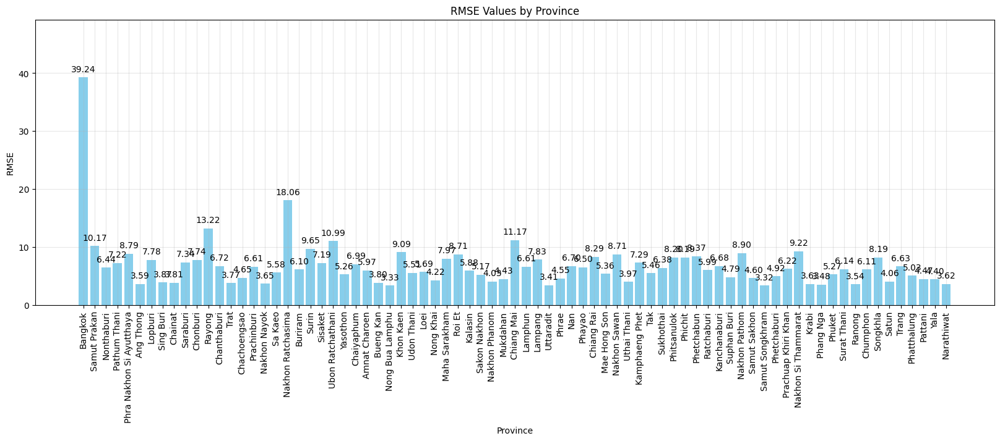

In [93]:
total_rmse = sum(pvrecord.values())
print(f"Total RMSE: {total_rmse}")

# Creating a bar plot
fig, ax = plt.subplots(figsize=(20, 6))
ax.bar(pvrecord.keys(), pvrecord.values(), color='skyblue')
ax.set_xlabel('Province')
ax.set_ylabel('RMSE')
ax.set_title('RMSE Values by Province')
ax.set_ylim(0, max(pvrecord.values()) + 10)

# Rotate the x-axis labels
plt.xticks(rotation=90)

# Adding the RMSE values on top of the bars
for i, v in enumerate(pvrecord.values()):
    ax.text(i, v + 1, f'{v:.2f}', ha='center')

# Display the plot
plt.grid(alpha=0.3)
plt.show()


                          pvrecord0  pvrecord1  Difference
Bangkok                   76.360637  39.237940   37.122697
Samut Prakan              13.049636  10.166167    2.883469
Nonthaburi                 7.249498   6.438547    0.810951
Pathum Thani               8.574578   7.223014    1.351564
Phra Nakhon Si Ayutthaya   8.763172   8.790417   -0.027245
...                             ...        ...         ...
Trang                      6.625346   6.625346    0.000000
Phatthalung                6.907409   5.027620    1.879789
Pattani                    4.455147   4.470106   -0.014959
Yala                       5.440996   4.404534    1.036461
Narathiwat                 4.089187   3.619616    0.469571

[77 rows x 3 columns]


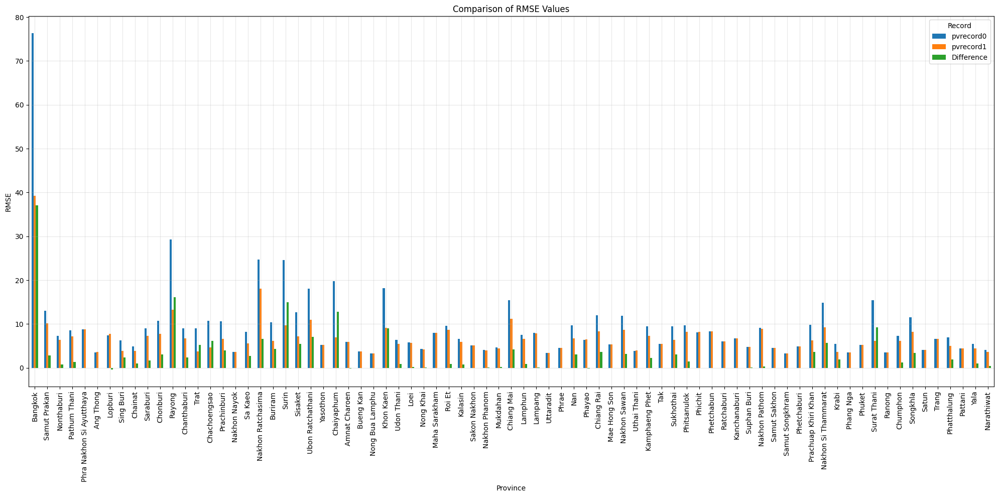

In [99]:
pvrecord0  = {'Bangkok': 76.36063676449949,
 'Samut Prakan': 13.049635977070057,
 'Nonthaburi': 7.249497713985841,
 'Pathum Thani': 8.574577749408144,
 'Phra Nakhon Si Ayutthaya': 8.763172056558089,
 'Ang Thong': 3.5622489642936315,
 'Lopburi': 7.394539554350971,
 'Sing Buri': 6.253745392561713,
 'Chainat': 4.850372128317462,
 'Saraburi': 9.004934429518402,
 'Chonburi': 10.784751151284173,
 'Rayong': 29.29362612877891,
 'Chanthaburi': 9.039207586402009,
 'Trat': 8.967513750095625,
 'Chachoengsao': 10.776458397495487,
 'Prachinburi': 10.575305865941772,
 'Nakhon Nayok': 3.652860249914554,
 'Sa Kaeo': 8.265378298643776,
 'Nakhon Ratchasima': 24.678096716895894,
 'Buriram': 10.444504297959122,
 'Surin': 24.616549364792785,
 'Sisaket': 12.624889186982282,
 'Ubon Ratchathani': 18.02407231485729,
 'Yasothon': 5.259409681477039,
 'Chaiyaphum': 19.807608785001023,
 'Amnat Charoen': 5.878235959045015,
 'Bueng Kan': 3.7951607901835005,
 'Nong Bua Lamphu': 3.327853211591088,
 'Khon Kaen': 18.12098161888682,
 'Udon Thani': 6.412187338357021,
 'Loei': 5.8572859313625605,
 'Nong Khai': 4.296222163775307,
 'Maha Sarakham': 7.971467665882491,
 'Roi Et': 9.630361738476637,
 'Kalasin': 6.6386293797418015,
 'Sakon Nakhon': 5.16666162320079,
 'Nakhon Phanom': 4.059842034208891,
 'Mukdahan': 4.6688712445788125,
 'Chiang Mai': 15.419972781224041,
 'Lamphun': 7.53656421144407,
 'Lampang': 7.957290790165344,
 'Uttaradit': 3.397264339792317,
 'Phrae': 4.495905692917569,
 'Nan': 9.740079675824619,
 'Phayao': 6.372662040035755,
 'Chiang Rai': 11.936946678828246,
 'Mae Hong Son': 5.371809629955286,
 'Nakhon Sawan': 11.906167302534225,
 'Uthai Thani': 3.9118348052198804,
 'Kamphaeng Phet': 9.525922515895905,
 'Tak': 5.464342176058535,
 'Sukhothai': 9.421698008380176,
 'Phitsanulok': 9.6757096172131,
 'Phichit': 8.118654864730004,
 'Phetchabun': 8.282681051272142,
 'Ratchaburi': 5.9871252340905965,
 'Kanchanaburi': 6.699083833956905,
 'Suphan Buri': 4.831099975430087,
 'Nakhon Pathom': 9.182769187059774,
 'Samut Sakhon': 4.596189361292357,
 'Samut Songkhram': 3.317848658454171,
 'Phetchaburi': 4.91742565067919,
 'Prachuap Khiri Khan': 9.82226000037338,
 'Nakhon Si Thammarat': 14.892790755064764,
 'Krabi': 5.511365974780709,
 'Phang Nga': 3.48083277749657,
 'Phuket': 5.265380505321653,
 'Surat Thani': 15.433859756576167,
 'Ranong': 3.5370765485472693,
 'Chumphon': 7.3176919374148035,
 'Songkhla': 11.556063031083653,
 'Satun': 4.058941239721519,
 'Trang': 6.62534554042965,
 'Phatthalung': 6.907408901052155,
 'Pattani': 4.455146604571581,
 'Yala': 5.440995573277607,
 'Narathiwat': 4.089186511786015}

pvrecord1  = {'Bangkok': 39.23794010974002,
 'Samut Prakan': 10.166167116762558,
 'Nonthaburi': 6.438546710645192,
 'Pathum Thani': 7.223013573266722,
 'Phra Nakhon Si Ayutthaya': 8.790417107404064,
 'Ang Thong': 3.588964622360581,
 'Lopburi': 7.7765270352184315,
 'Sing Buri': 3.871741006042545,
 'Chainat': 3.814785125760958,
 'Saraburi': 7.342297229416183,
 'Chonburi': 7.737617588243486,
 'Rayong': 13.218722445420894,
 'Chanthaburi': 6.719756876386463,
 'Trat': 3.7734066171864917,
 'Chachoengsao': 4.652566579209719,
 'Prachinburi': 6.6056278793465,
 'Nakhon Nayok': 3.6528602519031965,
 'Sa Kaeo': 5.575370759440385,
 'Nakhon Ratchasima': 18.058206829415482,
 'Buriram': 6.09719570249447,
 'Surin': 9.651037522096336,
 'Sisaket': 7.1902850356626775,
 'Ubon Ratchathani': 10.9947399822635,
 'Yasothon': 5.259409681477039,
 'Chaiyaphum': 6.986343350571975,
 'Amnat Charoen': 5.965155752019958,
 'Bueng Kan': 3.795099026970346,
 'Nong Bua Lamphu': 3.327853211591088,
 'Khon Kaen': 9.085570610846142,
 'Udon Thani': 5.506419662001304,
 'Loei': 5.68791236110198,
 'Nong Khai': 4.221642355429842,
 'Maha Sarakham': 7.971294758469244,
 'Roi Et': 8.705422231574858,
 'Kalasin': 5.883256080259316,
 'Sakon Nakhon': 5.173248790364447,
 'Nakhon Phanom': 4.029618858229757,
 'Mukdahan': 4.433071167366718,
 'Chiang Mai': 11.168174967712858,
 'Lamphun': 6.613175825838823,
 'Lampang': 7.8257110785908806,
 'Uttaradit': 3.407559889807749,
 'Phrae': 4.554907928774935,
 'Nan': 6.6971402509959965,
 'Phayao': 6.503879832812334,
 'Chiang Rai': 8.292998313562533,
 'Mae Hong Son': 5.356883066846493,
 'Nakhon Sawan': 8.71397352735358,
 'Uthai Thani': 3.970558824132814,
 'Kamphaeng Phet': 7.294665567627883,
 'Tak': 5.464342427832331,
 'Sukhothai': 6.380434604275281,
 'Phitsanulok': 8.204286529281493,
 'Phichit': 8.185863175596678,
 'Phetchabun': 8.367170420732949,
 'Ratchaburi': 5.9871252340905965,
 'Kanchanaburi': 6.67740614140352,
 'Suphan Buri': 4.794184458062974,
 'Nakhon Pathom': 8.896198958690979,
 'Samut Sakhon': 4.596189361292357,
 'Samut Songkhram': 3.3178486706368284,
 'Phetchaburi': 4.91742565067919,
 'Prachuap Khiri Khan': 6.219526766900077,
 'Nakhon Si Thammarat': 9.219175949927125,
 'Krabi': 3.630385827362823,
 'Phang Nga': 3.48083277749657,
 'Phuket': 5.265380505321653,
 'Surat Thani': 6.137177691147416,
 'Ranong': 3.5370765485472693,
 'Chumphon': 6.112417766452195,
 'Songkhla': 8.192380983732399,
 'Satun': 4.058941239721519,
 'Trang': 6.62534554042965,
 'Phatthalung': 5.027619864847653,
 'Pattani': 4.470105758413418,
 'Yala': 4.404534202722687,
 'Narathiwat': 3.6196155450344247}

 # Create a DataFrame from the dictionaries
comparison_df = pd.DataFrame([pvrecord0, pvrecord1], index=['pvrecord0', 'pvrecord1']).T
comparison_df['Difference'] = comparison_df['pvrecord0'] - comparison_df['pvrecord1']

# Display the DataFrame
print(comparison_df)

# Create a bar plot to visualize the comparison
comparison_df.plot(kind='bar', figsize=(20, 10))
plt.title('Comparison of RMSE Values')
plt.xlabel('Province')
plt.ylabel('RMSE')
plt.xticks(rotation=90)
plt.legend(title='Record')
plt.tight_layout()
plt.grid(alpha=0.3)
# Show the plot
plt.show()